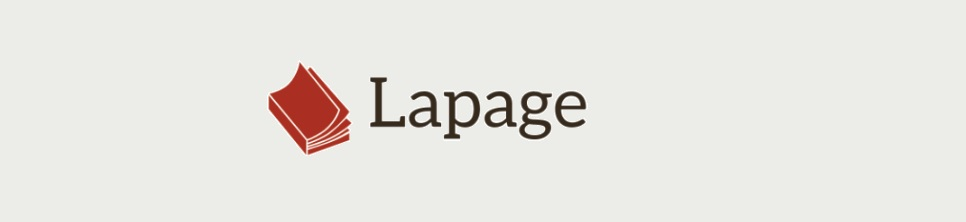

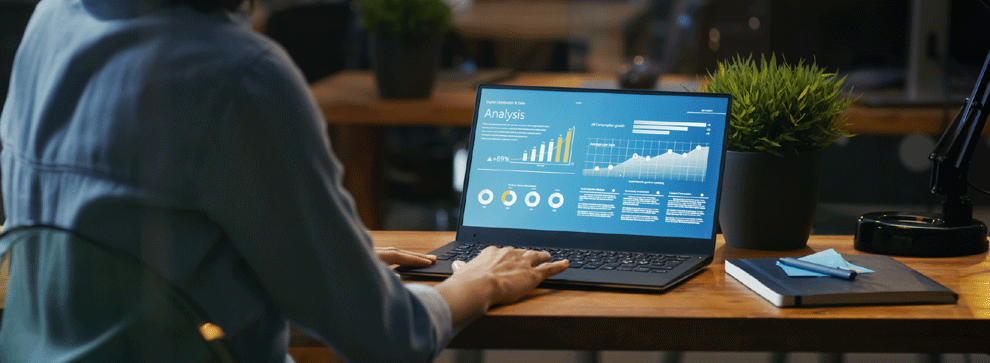

# ------ Analyses MARKETING --- 02/09/2022 ---
## /// Pour Annabelle, Julie et Antoine /// 
---

# 1 - Récupération de données
# 2 - Nettoyage des données
# 3 - Exploration des données

---

In [1]:
# 🛰🛰🛰 --- Récupération de librairies --- 🛰🛰🛰

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy
import seaborn as sns
import openpyxl

import warnings
warnings.filterwarnings("ignore")

In [2]:
pip install openpyxl

Note: you may need to restart the kernel to use updated packages.


---

# 1 - RÉCUPÉRATION DES DONNÉES

In [3]:
df_customers = pd.read_csv("customers.csv",sep=",")
df_products = pd.read_csv("products.csv",sep=",")
df_transactions = pd.read_csv("transactions.csv",sep=",",parse_dates=['date'])

### - Analyse rapide de fichier CUSTOMERS :

In [4]:
df_customers.head(3)

,client_id,sex,birth
0,c_4410,f,1967
1,c_7839,f,1975
2,c_1699,f,1984


In [5]:
(df_customers.isna().sum()/df_customers.shape[0]).sort_values(ascending=True) # Vérification des cellules vides

client_id    0.0
sex          0.0
birth        0.0
dtype: float64

In [6]:
df_customers.shape # affichage de la taille des tableaux

(8623, 3)

In [7]:
df_customers.client_id.unique().shape # affichage de la taille des tableaux

(8623,)

### - Pas de doublons, 8623 client_id différentes.

---

### - Analyse rapide de PRODUCTS :

In [8]:
df_products.head(3)

,id_prod,price,categ
0,0_1421,19.99,0
1,0_1368,5.13,0
2,0_731,17.99,0


In [9]:
(df_products.isna().sum()/df_products.shape[0]).sort_values(ascending=True)

id_prod    0.0
price      0.0
categ      0.0
dtype: float64

In [10]:
df_products.id_prod.unique().shape

(3287,)

### - Pas de doublons, 3287 clés produit différentes.

---

### - Analyse rapide de TRANSACTIONS :

In [11]:
df_transactions.head(3)

,id_prod,date,session_id,client_id
0,0_1518,2022-05-20 13:21:29.043970,s_211425,c_103
1,1_251,2022-02-02 07:55:19.149409,s_158752,c_8534
2,0_1277,2022-06-18 15:44:33.155329,s_225667,c_6714


In [12]:
(df_transactions.isna().sum()/df_transactions.shape[0]).sort_values(ascending=True)

id_prod       0.0
date          0.0
session_id    0.0
client_id     0.0
dtype: float64

In [13]:
df_transactions.shape # Nous avons beaucoup de données dans la table !

(679532, 4)

In [14]:
df_transactions.date.unique().shape # Détection de doublons dans la rubrique Date, à contrôler ensuite.

(679371,)

In [15]:
df_transactions.id_prod.unique().shape # contrôle du nombre de clé produit différentes.

(3267,)

### - Doublons potentiels, 679 371 lignes de données, 3267 clés produit différentes.

---

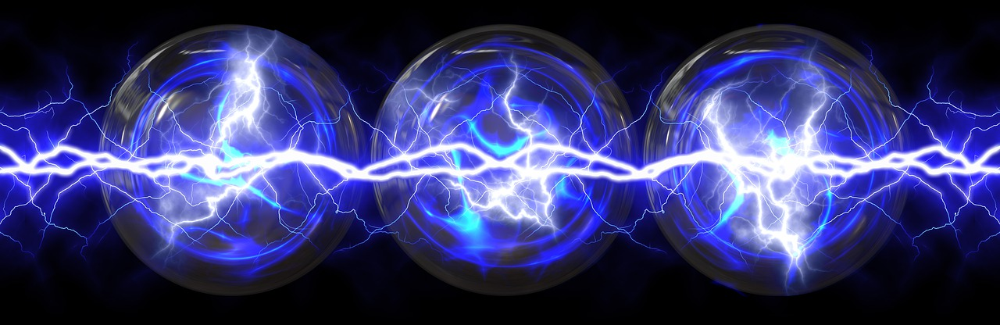
Image par Gerd Altmann de Pixabay 

#  ---------------- FIN DE RÉCUPÉRATION DES DONNÉES ----------------

---
---

# 2 - Début de nettoyage des données

In [16]:
df_transactions.session_id.unique().shape, df_transactions.session_id.shape

((342316,), (679532,))

### 679 532 occurences de session_id  ------ contre ------- 342 316 session_id différentes

In [17]:
df_transactions.session_id.value_counts() # Calcul du nbre de session_id identiques

s_0         200
s_118668     14
s_96857      13
s_215292     13
s_342045     13
           ... 
s_33111       1
s_22778       1
s_198924      1
s_45000       1
s_181434      1
Name: session_id, Length: 342316, dtype: int64

### "s_0" possède 200 valeurs session_id identiques, consultation des lignes :

In [18]:
df_transactions.loc[df_transactions['session_id']=="s_0",:] # Vérifications

,id_prod,date,session_id,client_id
3019,T_0,test_2021-03-01 02:30:02.237419,s_0,ct_0
5138,T_0,test_2021-03-01 02:30:02.237425,s_0,ct_0
9668,T_0,test_2021-03-01 02:30:02.237437,s_0,ct_1
10728,T_0,test_2021-03-01 02:30:02.237436,s_0,ct_0
15292,T_0,test_2021-03-01 02:30:02.237430,s_0,ct_0
...,...,...,...,...
657830,T_0,test_2021-03-01 02:30:02.237417,s_0,ct_0
662081,T_0,test_2021-03-01 02:30:02.237427,s_0,ct_1
670680,T_0,test_2021-03-01 02:30:02.237449,s_0,ct_1
671647,T_0,test_2021-03-01 02:30:02.237424,s_0,ct_1


In [19]:
df_transactions.date.value_counts().head(10) # Visualisation des dates de test du jeu de données

test_2021-03-01 02:30:02.237413    13
test_2021-03-01 02:30:02.237428     8
test_2021-03-01 02:30:02.237414     8
test_2021-03-01 02:30:02.237443     8
test_2021-03-01 02:30:02.237444     8
test_2021-03-01 02:30:02.237427     8
test_2021-03-01 02:30:02.237432     7
test_2021-03-01 02:30:02.237446     7
test_2021-03-01 02:30:02.237430     7
test_2021-03-01 02:30:02.237419     6
Name: date, dtype: int64

### Toutes les connexions test ont eut lieu le même jour.

In [20]:
df_transactions.loc[df_transactions["date"] == "test_2021-03-01 02:30:02.237413",:] # Visualisation rapide d'un échantillon

,id_prod,date,session_id,client_id
85486,T_0,test_2021-03-01 02:30:02.237413,s_0,ct_1
103119,T_0,test_2021-03-01 02:30:02.237413,s_0,ct_0
165314,T_0,test_2021-03-01 02:30:02.237413,s_0,ct_1
213273,T_0,test_2021-03-01 02:30:02.237413,s_0,ct_0
236225,T_0,test_2021-03-01 02:30:02.237413,s_0,ct_0
255856,T_0,test_2021-03-01 02:30:02.237413,s_0,ct_1
394969,T_0,test_2021-03-01 02:30:02.237413,s_0,ct_0
412584,T_0,test_2021-03-01 02:30:02.237413,s_0,ct_0
427604,T_0,test_2021-03-01 02:30:02.237413,s_0,ct_0
440821,T_0,test_2021-03-01 02:30:02.237413,s_0,ct_0


---

## - Suppression des connexions "tests" pour éviter les erreurs d'interprétation :

#### dans df_transactions : ------------------------------------------------------------------------- 

In [21]:
# Suppression tests clients_id :
df_transactions = df_transactions.loc[df_transactions['client_id'] != "ct_0",:]
df_transactions = df_transactions.loc[df_transactions['client_id'] != "ct_1",:]

# Suppression tests id_prod :
df_transactions = df_transactions.loc[df_transactions['id_prod'] != "T_0",:]

#### dans df_customers : ---------------------------------------------------------

In [22]:
df_customers.loc[df_customers['client_id'].str.contains("ct"),:]

,client_id,sex,birth
2735,ct_0,f,2001
8494,ct_1,m,2001


In [23]:
df_customers = df_customers.loc[df_customers['client_id'] != "ct_0",:]
df_customers = df_customers.loc[df_customers['client_id'] != "ct_1",:]

#### dans df_products : -----------------------------------------------------

In [24]:
df_products.loc[df_products['id_prod'].str.contains("T"),:]

,id_prod,price,categ
731,T_0,-1.0,0


In [25]:
df_products = df_products.loc[df_products['id_prod'] != "T_0",:]

## - Jeux de données nettoyés des différentes lignes laissées par les tests.

---

## - Traitement des dates :

In [26]:
import datetime as dt

In [27]:
# Changement de format date :
df_transactions['date'] = pd.to_datetime(df_transactions['date'])

# Décompression de la granularité de la date et extraction des variables la composant :
df_transactions['année'] = df_transactions['date'].dt.year
df_transactions['mois'] = df_transactions['date'].dt.month
df_transactions['jour'] = df_transactions['date'].dt.day
df_transactions['heure'] = df_transactions['date'].dt.hour
df_transactions['minute'] = df_transactions['date'].dt.minute
df_transactions['jour_semaine'] = df_transactions['date'].dt.weekday

### - Extraction de toutes les unités temporelles à valeur pertinente ok

In [28]:
df_transactions.head(3)

,id_prod,date,session_id,client_id,année,mois,jour,heure,minute,jour_semaine
0,0_1518,2022-05-20 13:21:29.043970,s_211425,c_103,2022,5,20,13,21,4
1,1_251,2022-02-02 07:55:19.149409,s_158752,c_8534,2022,2,2,7,55,2
2,0_1277,2022-06-18 15:44:33.155329,s_225667,c_6714,2022,6,18,15,44,5


### - Contrôle rapide sur les doublons :

In [29]:
test_doublons = (df_transactions.duplicated (subset = None, keep = 'first'))
unique, counts = np.unique(test_doublons, return_counts=True)
dict(zip(unique, counts))

{False: 679332}

### - Aucun doublon.

In [30]:
df_transactions.client_id.unique().shape

(8600,)

---

# ------------ Réalisation de la Fusion des différentes tables de données ------------

In [31]:
df_transactions.shape,df_products.shape,df_customers.shape

((679332, 10), (3286, 3), (8621, 3))

In [32]:
# - Connexion df_transactions à products -
df_transactions_products = df_transactions.merge(df_products, how = 'outer', on = 'id_prod')
df_transactions_products.shape

(679353, 12)

In [33]:
# - Connexion df_transactions_products à customers -
df_transactions_products_customers = df_transactions_products.merge(df_customers,how='outer', on='client_id')
df_transactions_products_customers.shape

(679374, 14)

In [34]:
df_transactions_products_customers.isna().sum().sort_values(ascending=True) # nbr champs vides pour chaque variable

id_prod          21
client_id        21
sex              21
birth            21
date             42
session_id       42
année            42
mois             42
jour             42
heure            42
minute           42
jour_semaine     42
price           242
categ           242
dtype: int64

---

### Extraction d'un fichier Excel  :
#### df_transactions_products_customers_pb_paiement_ou_pas_de_commandes
#### Possibilité de recontacter des clients :
#### => 📈📌Ceux qui ont du rencontrer des problèmes de paiement 
#### => 📈📌Ceux qui ont du rencontrer des annulations de commandes 

In [35]:
df_transactions_products_customers_pb_paiement_ou_pas_de_commandes = df_transactions_products_customers.loc[df_transactions_products_customers['categ'].isna(),:]
datatoexcel = df_transactions_products_customers_pb_paiement_ou_pas_de_commandes
datatoexcel = pd.ExcelWriter('df_transactions_products_customers_pb_paiement_ou_pas_de_commandes.xlsx')
df_transactions_products_customers_pb_paiement_ou_pas_de_commandes.to_excel(datatoexcel)
datatoexcel.save()
print('DataFrame is written to Excel File successfully.')

DataFrame is written to Excel File successfully.


---

## - Consultation des lignes avec les valeurs de date vides : 

In [36]:
df_transactions_products.loc[df_transactions_products['date'].isna(),:]

,id_prod,date,session_id,client_id,année,mois,jour,heure,minute,jour_semaine,price,categ
679332,0_1016,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,35.06,0.0
679333,0_1780,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.67,0.0
679334,0_1062,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.08,0.0
679335,0_1119,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.99,0.0
679336,0_1014,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.15,0.0
679337,1_0,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31.82,1.0
679338,0_1318,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.92,0.0
679339,0_1800,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22.05,0.0
679340,0_1645,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.99,0.0
679341,0_322,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.99,0.0


#### - Extraction de plusieurs lignes pour vérifier mais ce doit être les produits qui ne se vendent pas :

In [37]:
df_transactions_products.loc[df_transactions_products['id_prod']=="0_1016",:]

,id_prod,date,session_id,client_id,année,mois,jour,heure,minute,jour_semaine,price,categ
679332,0_1016,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,35.06,0.0


In [38]:
df_transactions_products.loc[df_transactions_products['id_prod']=="0_1062",:]

,id_prod,date,session_id,client_id,année,mois,jour,heure,minute,jour_semaine,price,categ
679334,0_1062,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.08,0.0


In [39]:
df_transactions_products.loc[df_transactions_products['id_prod']=="0_1645",:]

,id_prod,date,session_id,client_id,année,mois,jour,heure,minute,jour_semaine,price,categ
679340,0_1645,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.99,0.0


In [40]:
df_transactions_products.loc[df_transactions_products['id_prod']=="0_299",:]

,id_prod,date,session_id,client_id,année,mois,jour,heure,minute,jour_semaine,price,categ
679350,0_299,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22.99,0.0


#### Corrélation confirmée à première vue ce sont les produits pour lesquels nous n'avons aucune vente. 
### Recommandation :  Suppression sauf si ce sont des produits qui viennent tout juste d'être mis en ligne.

---

## Extraction d'un fichier Excel  :
### df_transactions_products_customers_produits_sans_ventes_ou_tres_recents
#### => Groupage des produits qui ne comptabilise pas de ventes

In [41]:
df_transactions_products_customers_produits_sans_ventes_ou_tres_recents = df_transactions_products_customers.loc[df_transactions_products_customers['categ'].isna(),:]
datatoexcel = df_transactions_products_customers_produits_sans_ventes_ou_tres_recents
datatoexcel = pd.ExcelWriter('df_transactions_products_customers_produits_sans_ventes_ou_tres_recents.xlsx')
df_transactions_products_customers_produits_sans_ventes_ou_tres_recents.to_excel(datatoexcel)
datatoexcel.save()
print('DataFrame is written to Excel File successfully.')

DataFrame is written to Excel File successfully.


---

## - Passons au traitement des transactions sans prix :

In [42]:
df_transactions_sans_prix = df_transactions_products_customers.loc[df_transactions_products_customers.price.isna(),:]
df_transactions_sans_prix

,id_prod,date,session_id,client_id,année,mois,jour,heure,minute,jour_semaine,price,categ,sex,birth
37861,0_2245,2021-04-22 04:57:20.090378,s_23987,c_6714,2021.0,4.0,22.0,4.0,57.0,3.0,NaN,NaN,f,1968.0
37862,0_2245,2021-06-05 17:04:43.982913,s_44481,c_6714,2021.0,6.0,5.0,17.0,4.0,5.0,NaN,NaN,f,1968.0
37863,0_2245,2022-04-05 17:04:43.982913,s_189669,c_6714,2022.0,4.0,5.0,17.0,4.0,1.0,NaN,NaN,f,1968.0
37864,0_2245,2022-05-05 17:04:43.982913,s_204093,c_6714,2022.0,5.0,5.0,17.0,4.0,3.0,NaN,NaN,f,1968.0
37865,0_2245,2022-12-05 17:04:43.982913,s_307520,c_6714,2022.0,12.0,5.0,17.0,4.0,0.0,NaN,NaN,f,1968.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
679369,NaN,NaT,NaN,c_862,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,1956.0
679370,NaN,NaT,NaN,c_7584,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,1960.0
679371,NaN,NaT,NaN,c_90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,m,2001.0
679372,NaN,NaT,NaN,c_587,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,m,1993.0


### - Consultation des id_prod sans prix

In [43]:
df_transactions_sans_prix.id_prod.unique()

array(['0_2245', nan], dtype=object)

## id_prod 0_2245 : 221 lignes de commandes sans price ni categ trouvées.
### Pour categ nous pouvons lui réattribuer un numéro grâce à la nomenclature de formation des id_prod mais le problème d'absence de ligne price est à vérifier, j'extraie les informations au format excel.

In [44]:
df_transactions_sans_prix.loc[df_transactions_sans_prix['id_prod']=="0_2245",:]

,id_prod,date,session_id,client_id,année,mois,jour,heure,minute,jour_semaine,price,categ,sex,birth
37861,0_2245,2021-04-22 04:57:20.090378,s_23987,c_6714,2021.0,4.0,22.0,4.0,57.0,3.0,NaN,NaN,f,1968.0
37862,0_2245,2021-06-05 17:04:43.982913,s_44481,c_6714,2021.0,6.0,5.0,17.0,4.0,5.0,NaN,NaN,f,1968.0
37863,0_2245,2022-04-05 17:04:43.982913,s_189669,c_6714,2022.0,4.0,5.0,17.0,4.0,1.0,NaN,NaN,f,1968.0
37864,0_2245,2022-05-05 17:04:43.982913,s_204093,c_6714,2022.0,5.0,5.0,17.0,4.0,3.0,NaN,NaN,f,1968.0
37865,0_2245,2022-12-05 17:04:43.982913,s_307520,c_6714,2022.0,12.0,5.0,17.0,4.0,0.0,NaN,NaN,f,1968.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
654934,0_2245,2021-09-07 20:55:19.719028,s_86505,c_8153,2021.0,9.0,7.0,20.0,55.0,1.0,NaN,NaN,f,1975.0
656406,0_2245,2021-10-20 13:11:05.671456,s_107564,c_1746,2021.0,10.0,20.0,13.0,11.0,2.0,NaN,NaN,m,1994.0
660365,0_2245,2021-04-10 06:15:32.619826,s_18510,c_277,2021.0,4.0,10.0,6.0,15.0,5.0,NaN,NaN,f,2000.0
660366,0_2245,2022-04-10 06:15:32.619826,s_191872,c_277,2022.0,4.0,10.0,6.0,15.0,6.0,NaN,NaN,f,2000.0


In [45]:
# Réassignation de la categ 0 à l'id_prod 0_2245.
# Le premier chiffre d'id_prod caractérise la catégorie de produit.

In [46]:
df_transactions_sans_prix['categ'] = 0

In [47]:
df_transactions_sans_prix

,id_prod,date,session_id,client_id,année,mois,jour,heure,minute,jour_semaine,price,categ,sex,birth
37861,0_2245,2021-04-22 04:57:20.090378,s_23987,c_6714,2021.0,4.0,22.0,4.0,57.0,3.0,NaN,0,f,1968.0
37862,0_2245,2021-06-05 17:04:43.982913,s_44481,c_6714,2021.0,6.0,5.0,17.0,4.0,5.0,NaN,0,f,1968.0
37863,0_2245,2022-04-05 17:04:43.982913,s_189669,c_6714,2022.0,4.0,5.0,17.0,4.0,1.0,NaN,0,f,1968.0
37864,0_2245,2022-05-05 17:04:43.982913,s_204093,c_6714,2022.0,5.0,5.0,17.0,4.0,3.0,NaN,0,f,1968.0
37865,0_2245,2022-12-05 17:04:43.982913,s_307520,c_6714,2022.0,12.0,5.0,17.0,4.0,0.0,NaN,0,f,1968.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
679369,NaN,NaT,NaN,c_862,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,f,1956.0
679370,NaN,NaT,NaN,c_7584,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,f,1960.0
679371,NaN,NaT,NaN,c_90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,m,2001.0
679372,NaN,NaT,NaN,c_587,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,m,1993.0


---

## Extraction d'un fichier Excel  :
### df_transactions_sans_prix
#### Groupage des lignes concernant l'id_prod 0_2245 et l'absence de prix dans les bases de données.

In [48]:
datatoexcel = df_transactions_sans_prix

datatoexcel = pd.ExcelWriter('df_transactions_sans_prix.xlsx')

df_transactions_sans_prix.to_excel(datatoexcel)

datatoexcel.save()
print('DataFrame is written to Excel File successfully.')

DataFrame is written to Excel File successfully.


---

In [49]:
### 2 traitements possibles :

# P1 : Le service concerné peut retrouvé le prix de l'id_prod 0_2245 dans ce cas on complète la base de manière exacte.

# P2(nous sommes obligés d'insérer du biais dans nos données...) : 
# Réalisation une imputation statistique sur base du panier habituel moyen des clients.

## - Imputation statistique par la moyenne

---

In [50]:
# élimination des id_prod vides du dataframe
df_transactions_products_customers = df_transactions_products_customers.loc[df_transactions_products_customers.id_prod.notnull(),:]

In [51]:
# Création d'un dataframe qui recensera les données avant imputation :
df_transactions_sans_prix = df_transactions_sans_prix.loc[df_transactions_sans_prix['id_prod'].notnull(),:]

In [52]:
df_transactions_sans_prix.categ.unique()

array([0], dtype=int64)

In [53]:
# Récupération des articles de categ 0 :

df_calcul_imputation = df_transactions_products_customers.loc[(df_transactions_products_customers['categ']==0) &
                                                              (df_transactions_products_customers['price']>0),:]

# Imputation par la moyenne  :
df_transactions_sans_prix['price'] = df_calcul_imputation['price'].mean()
df_transactions_products_customers.loc[df_transactions_products_customers.price.isna(),"price"] = df_calcul_imputation['price'].mean()
df_transactions_products_customers.loc[df_transactions_products_customers.categ.isna(),"categ"] = 0

In [54]:
df_transactions_products_customers = df_transactions_products_customers.loc[df_transactions_products_customers.date.notnull(),:]

In [55]:
(df_transactions_products_customers.isna().sum()/df_transactions_products_customers.shape[0]).sort_values(ascending=True)

id_prod         0.0
date            0.0
session_id      0.0
client_id       0.0
année           0.0
mois            0.0
jour            0.0
heure           0.0
minute          0.0
jour_semaine    0.0
price           0.0
categ           0.0
sex             0.0
birth           0.0
dtype: float64

#### Imputation statistique réalisée par la moyenne des prix de la catégorie désignée par la référence produit.

In [56]:
df_transactions_sans_prix['price'].sum()

2351.0708625913585

## Montant total de ventes reconsolidé pour les lignes sans prix : 2351.07 €

---

## ----------- Visualisation rapide du dataframe après toutes ces transformations -----------

In [57]:
df_transactions_products_customers

,id_prod,date,session_id,client_id,année,mois,jour,heure,minute,jour_semaine,price,categ,sex,birth
0,0_1518,2022-05-20 13:21:29.043970,s_211425,c_103,2022.0,5.0,20.0,13.0,21.0,4.0,4.18,0.0,f,1986.0
1,0_1518,2021-07-20 13:21:29.043970,s_64849,c_103,2021.0,7.0,20.0,13.0,21.0,1.0,4.18,0.0,f,1986.0
2,0_1518,2022-08-20 13:21:29.043970,s_255965,c_103,2022.0,8.0,20.0,13.0,21.0,5.0,4.18,0.0,f,1986.0
3,0_1418,2022-06-18 01:49:37.823274,s_225411,c_103,2022.0,6.0,18.0,1.0,49.0,5.0,8.57,0.0,f,1986.0
4,0_1418,2021-08-18 01:49:37.823274,s_77214,c_103,2021.0,8.0,18.0,1.0,49.0,2.0,8.57,0.0,f,1986.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
679327,2_147,2021-07-23 07:01:38.963669,s_65994,c_4391,2021.0,7.0,23.0,7.0,1.0,4.0,181.99,2.0,f,2001.0
679328,0_142,2022-03-25 18:07:25.880052,s_184472,c_1232,2022.0,3.0,25.0,18.0,7.0,4.0,19.85,0.0,f,1960.0
679329,0_142,2021-09-25 18:07:25.880052,s_95415,c_1232,2021.0,9.0,25.0,18.0,7.0,5.0,19.85,0.0,f,1960.0
679330,2_205,2021-03-11 00:11:32.016264,s_4605,c_7534,2021.0,3.0,11.0,0.0,11.0,3.0,100.99,2.0,m,1992.0


---

## Extraction d'un fichier Excel  :
### df_transactions_products_customers_df_BI
#### 🔥🚀 Exploitation parallèle de ⚡Power BI⚡ pour explorer nos données par séquençages empiriques / relativismes dynamiques 🚀🔥

In [58]:
df_transactions_products_customers_df_BI = df_transactions_products_customers
#datatoexcel = df_transactions_products_customers_df_BI

#datatoexcel = pd.ExcelWriter("df_transactions_products_customers_df_BI.xlsx")

#df_transactions_products_customers_df_BI.to_excel(datatoexcel)

# datatoexcel.save()
print('DataFrame is written to Excel File successfully.')

DataFrame is written to Excel File successfully.


---
---
---

# --- FIN DE NETTOYAGE DES DONNÉES ------------------------------------------

---

# DÉBUT DE L'EXPLORATION DES DONNÉES :

In [59]:
# Demandes MAIL : 🛰 Antoine - Annabelle 🛰 ===> besoin analytics

In [60]:
# 1/ - Différents indicateurs autour du CA -
# Exploration en Notebook Python

# 2/ - Évolution temporelle et décomposition en moyennes mobiles pour évaluer tendance globale -
# Exploration Notebook Python

# 3/ - Zoom sur les références, visualiser les tops -
# Visualisation ⚡Power BI⚡ : "3 / Outils de cadrage marketing"
# Navigation de manière didactique et intéractive afin de rendre l'exploration plus intelligente

# 4/ - Zoom sur les références, visualiser les flops -
# Visualisation ⚡Power BI⚡ : "8 / FLOPS - id_prod à supprimer - Optimisation des ventes"
# Visualisation par listing des produits rapportant moins de 100€ par an, moins de 250€, ...
# Visualisation d'une matrice volumétrique compositionnelle du CA afin de mieux se représenter qu'est ce que ces produits
# développent réellement comme gains annuellement par rapport aux autres produits.
# RECOMMANDATIONS : Supprimer à minimas les produits ne rapportant pas plus de 250€ par an et remplacer par des articles
# "forts" afin de minimiser les coûts de communication, l'ennui du client et de maximiser le ROI et l'éveil attentionnel
# du consommateur.

# 4/ - Zoom sur les références, visualiser la répartition par catégorie, etc ... -
# Visualisation ⚡Power BI⚡ : "1a / CA total et nbre de ventes"
# Visualisation ⚡Power BI⚡ : "2 / Exploration interactive par categ/prix/âge/année"
# Visualisation ⚡Power BI⚡ : "5 / Ou se vendent par age les categories"
# Navigation de manière didactique et intéractive afin de rendre l'exploration plus intelligente,
# Navigation intéractive et dynamique sous BI des catégories dans toutes leurs profondeurs empiriques ou relatives.

# 5/ - Informations sur les profils des clients, répartition du CA entre les profils -
# Des représentations ont été réalisées sous BI pour pouvoir explorer intéractivement les profils...
# Visualisation ⚡Power BI⚡ : "1d / Fréquences et intensités"
# Visualisation ⚡Power BI⚡ : "2 / Exploration interactive par categ/prix/âge/année"
# Visualisation ⚡Power BI⚡ : "4 / Effets leviers sur les produits avec extraction data possibles- Q : ADAPTER CERTAINS PRIX?"

# 6/ Courbe de Lorenz
# Réalisée sous Notebook Jupiter.

# 7/ Toutes informations pertinentes sont bienvenues !

# -------------------------------- Pourquoi utilisez ⚡Power BI⚡? --------------------------------

# Libération de la prison des lignes de codes fermées.
# L'utilisateur est libre de naviguer où il veut, quand il veut et d'avoir un maximum de relativité
# d'analyse empirique et corrélative en un clic !!!
# Ignorez la pertinence de cet outils en le connaissant s'apparente au défaut de conseil !

# - ! Études Neurologiques ! -
# L'être humain traite 66000 fois plus vite en moyenne les informations visuelles j'ai donc créé
# un Power BI de navigation dans les données pour que les équipes puissent avoir plus de 
# spécificités et de précisions dans les actions qu'elles réaliseront avec l'outils de gestion.

In [61]:
# - Demandes de 🛰 Julie 🛰 : Besoin de vérifier les corrélations / tests statistiques -

# 1/ Analyses du lien entre le sexe d'un client et les catégories des livres achetés.
# Visualisation ⚡Power BI⚡ : Possibilité d'aller plus loin que des tests statistiques unitaires.
# Tests Statistiques réalisés sous Jupiter Notebook.

# 2/ Liens entre : - l'âge des clients,
#                  - le montant total des achats,
#                  - la fréquence d'achat,
#                  - la taille du panier moyen,
#                  - les catégories de livres achetés.

In [62]:
# Le jeu de données contient une année de décalage en plus dans les dates.
# J'aurais bien pris l'initiative de tout remettre en bonne et dû forme 

In [63]:
# A mettre à jour suite au changement des dates : (2023 en 2022)
# Contrôle des colonnes :
df_transactions_products_customers['age'] = 2023 - df_transactions_products_customers['birth']

---
---
---

# 1/ - Différents indicateurs autour du CA -

# - Prix des produits par catégorie et par chaque année

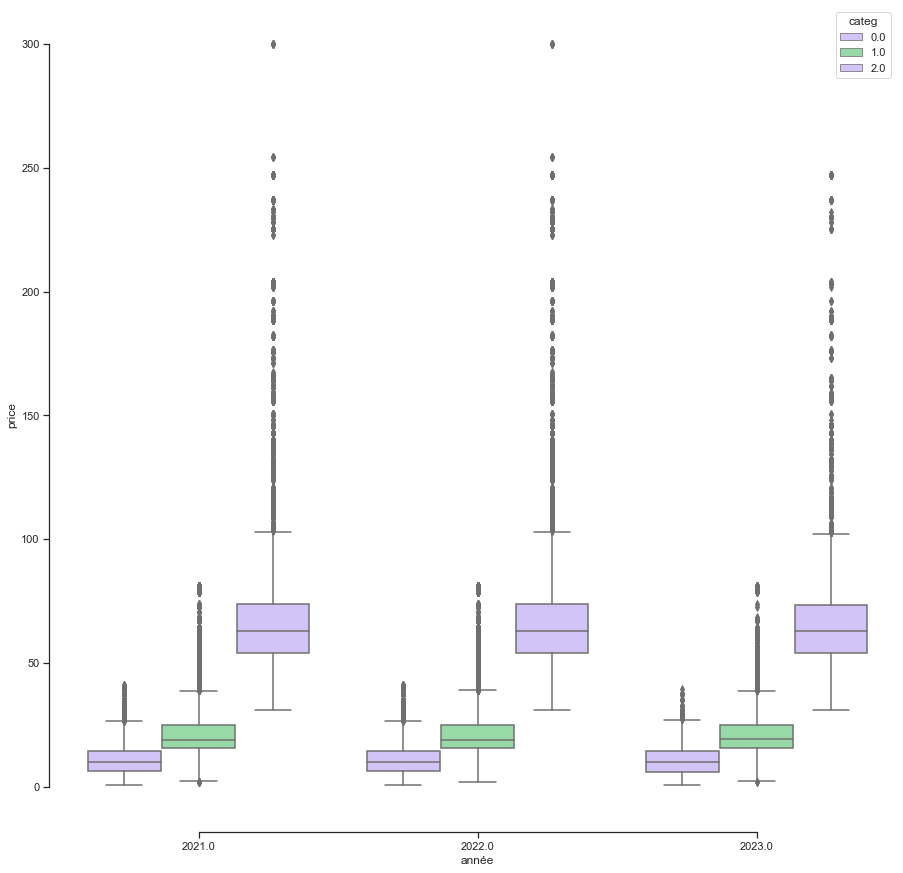

In [64]:
sns.set_theme(style="ticks", palette="pastel")

# Load the example tips dataset

# Draw a nested boxplot to show bills by day and time
plt.figure(figsize=(15,15))
sns.boxplot(x="année", y="price",
            hue="categ", palette=["m", "g"],
            data=df_transactions_products_customers)
sns.despine(offset=10, trim=True)

---

# - Séquençage selon l'age et les prix d'achats

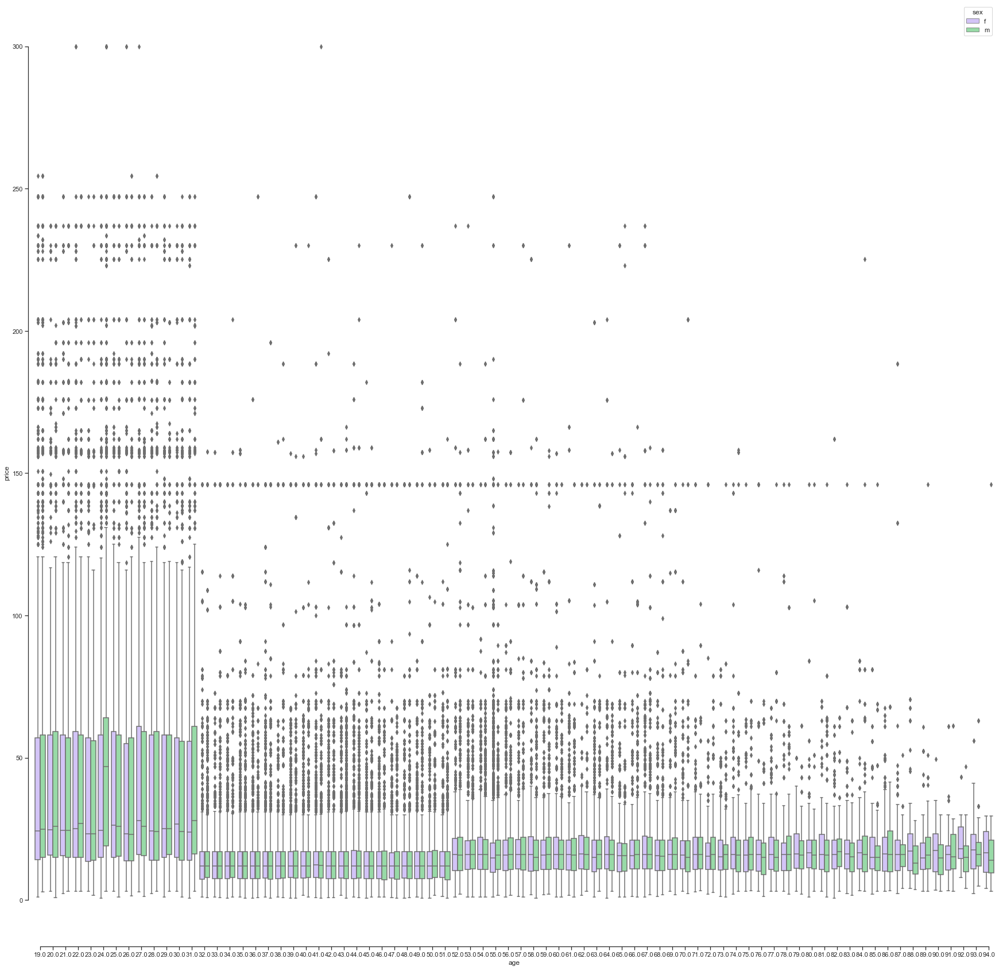

In [94]:
sns.set_theme(style="ticks", palette="pastel")

# Load the example tips dataset

# Draw a nested boxplot to show bills by day and time
plt.figure(figsize=(30,30))
sns.boxplot(x="age", y="price",
            hue="sex", palette=["m", "g"],
            data=df_transactions_products_customers)
sns.despine(offset=10, trim=True)

# - 3 catégories de dépenses :
## --- Entre 18 et 30 ans le panier moyen le plus élevé
## --- Entre 30 et 50 ans où le panier moyen dépensé est le plus faible
## --- Entre 50 et 93 ans où il remonte légèrement
####  🚀 Un pic intéressant de panier moyen chez les hommes de 23 ans qui monte à presque 50 Dollars de panier moyen par achat ! A développer !!!

#### 🎁 Idée marketing :
#### Aux alentours des 148$ un produit se vend à tous les âges de clients, il est exploitable en combinateur marketing et pourrait donner une bonne image de l'entreprise comme ce produit est apprécié de la clientèle.

---

In [95]:
# Extraction des colonnes appairées pour seaborn :
appair_plot = df_transactions_products_customers.drop(columns=[
                                                                'id_prod',
                                                                'date',
                                                                'session_id',
                                                                'client_id',
                                                                'année',
                                                                'mois',
                                                                'jour',
                                                                'heure',
                                                                'minute',
                                                                'jour_semaine',
                                                                'birth'])

---

# Répartition des différents produits par catégorie et prix :

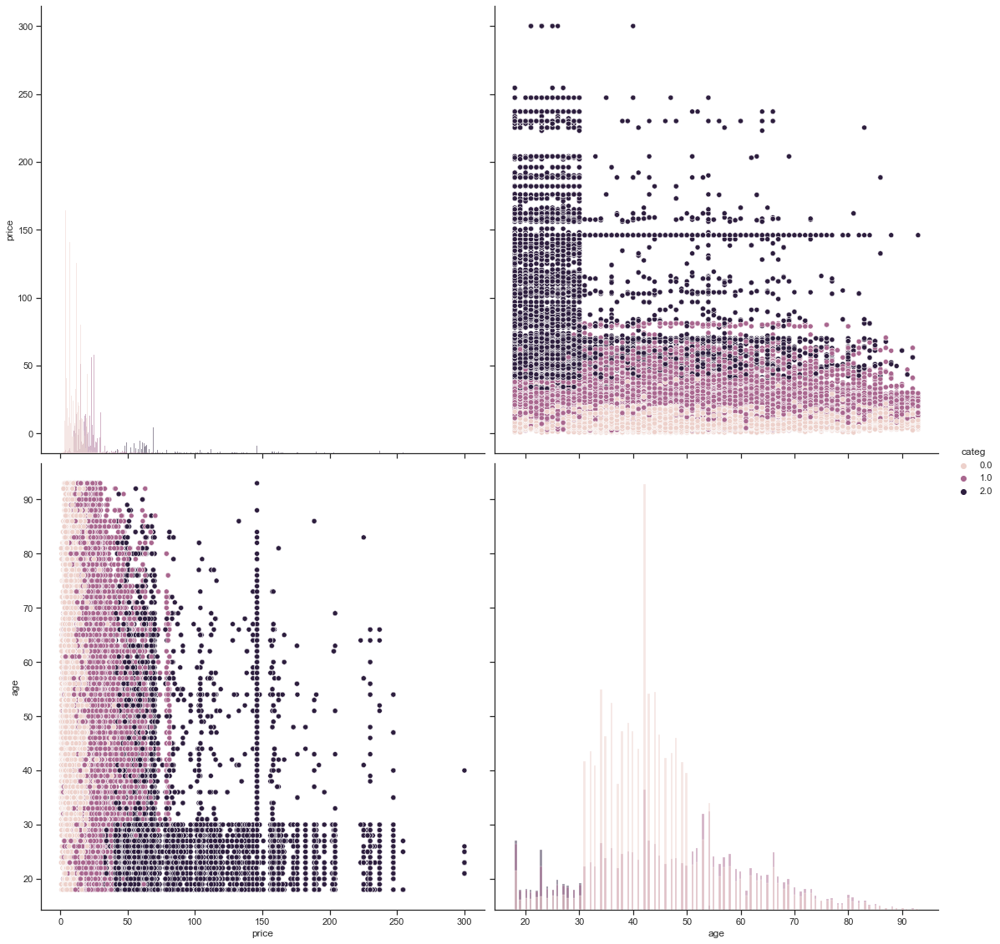

In [67]:
sns.pairplot(appair_plot, hue="categ", diag_kind="hist",height=8)

### Les produits categ 0 se vendent :
#### ............... à bas prix,
#### ............... à tout age,
#### ............... essentiellement au 30 <=> 50 ans avec un pic de demande à 42 ans,

### Les produits categ 1 se vendent :
#### ............... entre 10 et 80 dollars,
#### ............... à tous les âges,

### Les produits categ 2 se vendent : 
#### ............... panier moyen 40-75 dollars à tous les âges,
#### ............... paniers moyens entre 40-250 dollars 18 à 30 ans,

####  Après 150 dollars de panier moyen aucun produit ne dispose d'une bonne propagation de vente dans les âges

# Évolution du prix moyen pour une vente par année et par mois :

<AxesSubplot:xlabel='mois', ylabel='price'>

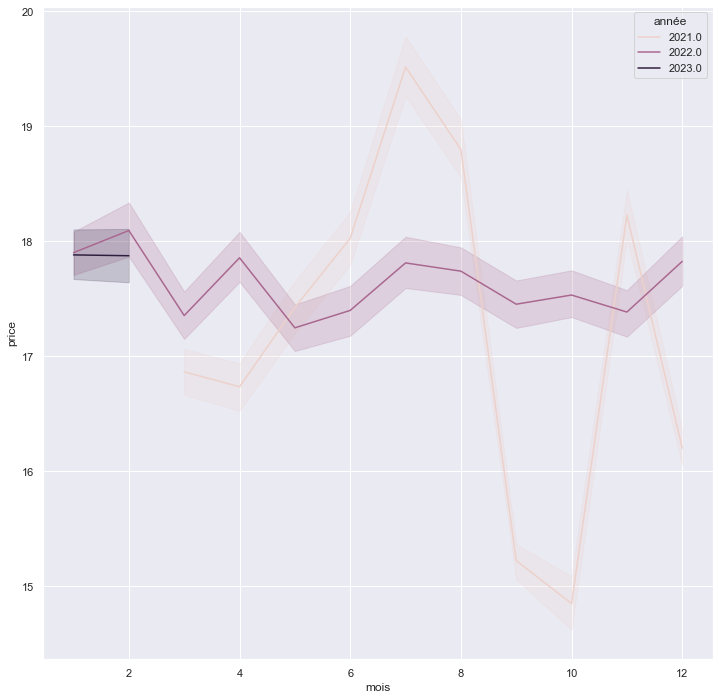

In [68]:
sns.set_theme(style="darkgrid")

# Plot the responses for different events and regions
plt.figure(figsize=(12,12))
sns.lineplot(x=df_transactions_products_customers["mois"], y="price",
             hue="année",
             data=df_transactions_products_customers)

#### 06/2020 => 07/2020 : Augmentation très rapide du montant du panier moyen
#### 08/2020 => 10/2020 : Descente brutale du panier moyen
#### 10/2020 => 11/2020 : Remontée rapide du panier moyen
#### 11/2020 => 12/2020 : Nouvelle baisse rapide mais moins importante.
#### 01/2021 => 02/2022 : Remontée début 2021 puis stabilisation du panier moyen.

#  - Vérification des raisons de la chute du CA en 2020 -

In [65]:
# 🚀 - Analyse du problème rencontré - 🚀

# Parallélisation de l'Age des clients aux catégories de produits et au mois de l'année 2021 :

In [64]:
analyse_pb = df_transactions_products_customers.loc[df_transactions_products_customers.année == 2021,:]

df_transactions_products_customers.categ = df_transactions_products_customers.categ.astype(int)
df_transactions_products_customers.jour = df_transactions_products_customers.jour.astype(int)
df_transactions_products_customers.mois = df_transactions_products_customers.mois.astype(int)
df_transactions_products_customers.age = df_transactions_products_customers.age.astype(int).round(0)

<AxesSubplot:xlabel='categ-mois', ylabel='age'>

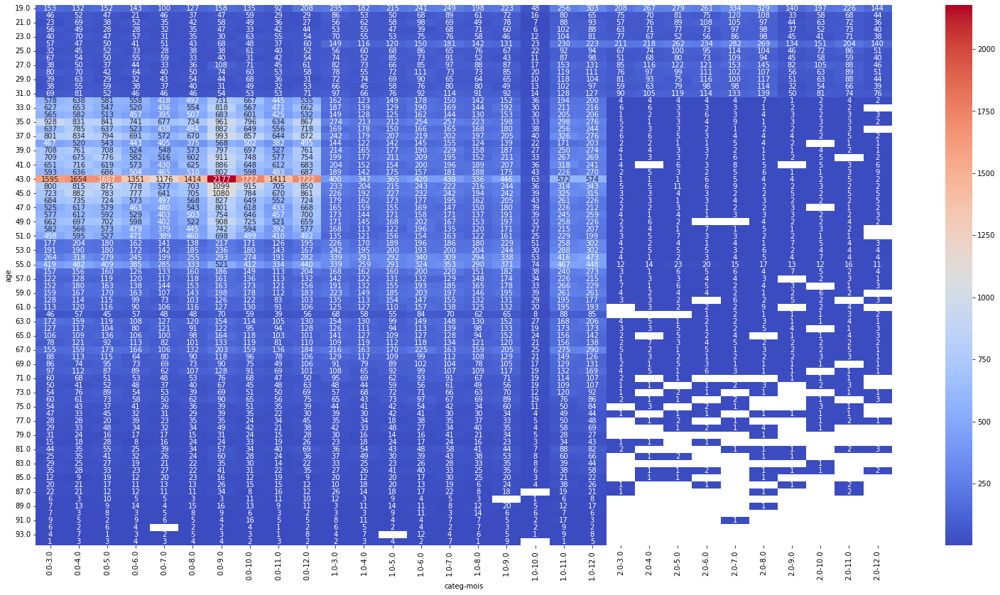

In [65]:
import seaborn as sns
import matplotlib.pyplot as plt

Polynom_analyse_pb = analyse_pb.groupby(['categ', 'mois', 'age']).size().unstack()
                                                          
  # - Heatmap -
plt.figure(figsize=(27,14))
sns.heatmap(Polynom_analyse_pb.T,annot = True, fmt = 'g', cmap = 'coolwarm')

In [66]:
# Problème détecté : Baisse énorme du nombre de ventes en Octobre 2020, Approfondissons ==============>

In [67]:
# - Réglage du ciblage temporel et catégoriel de notre analyse -

analyse_pb = df_transactions_products_customers.loc[(
     ((df_transactions_products_customers.mois == 8) | (df_transactions_products_customers.mois == 9) |
     (df_transactions_products_customers.mois == 10) | (df_transactions_products_customers.mois == 11)) &
    (df_transactions_products_customers.année == 2021) & (df_transactions_products_customers.categ == 1)),:]

<AxesSubplot:xlabel='categ-jour', ylabel='mois'>

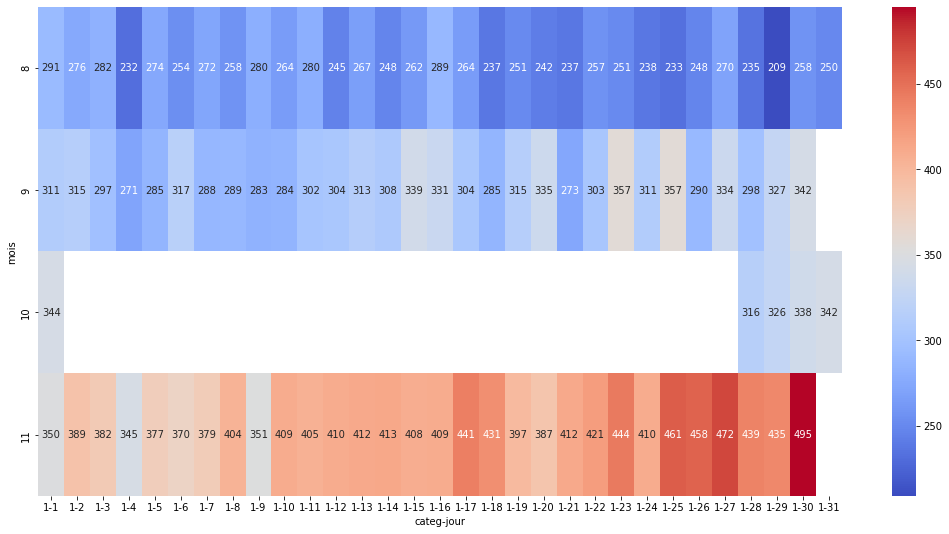

In [68]:
import seaborn as sns
import matplotlib.pyplot as plt

Polynom_analyse_pb = analyse_pb.groupby(['categ','jour','mois']).size().unstack()
                                                          
  # - Heatmap -
plt.figure(figsize=(18,9))
sns.heatmap(Polynom_analyse_pb.T,annot = True, fmt = 'g', cmap = 'coolwarm')

## - Anomalie repérée - 
## Du 02/10/2020 au 27/10/2020 pas de ventes sur les produits de categ 1 ...

In [69]:
# - Ciblage de la plage de recherche concernant notre problème -

analyse_pb = df_transactions_products_customers.loc[(
     ((df_transactions_products_customers.mois == 8) | (df_transactions_products_customers.mois == 9) |
     (df_transactions_products_customers.mois == 10) | (df_transactions_products_customers.mois == 11)) &
    (df_transactions_products_customers.année == 2021)),:]

<AxesSubplot:xlabel='categ-jour', ylabel='mois'>

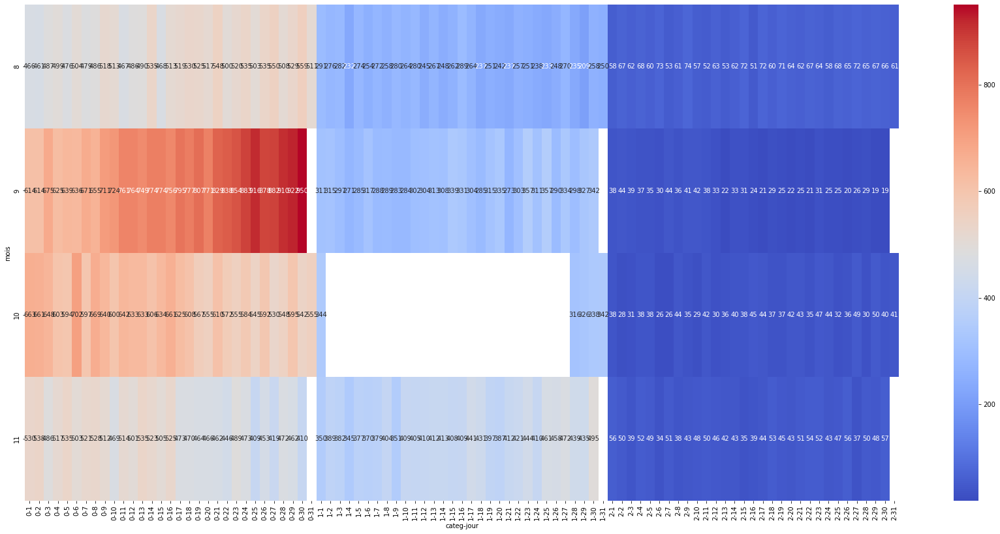

In [70]:
import seaborn as sns
import matplotlib.pyplot as plt

Polynom_analyse_pb = analyse_pb.groupby(['categ','jour','mois']).size().unstack()
                                                          
  # - Heatmap -
plt.figure(figsize=(30,14))
sns.heatmap(Polynom_analyse_pb.T,annot = True, fmt = 'g', cmap = 'coolwarm')

## --- Bilan de Contrôle  : ---
### Sur autres catégories de produits, rien à signaler, seuls les produits de categ 1 sont concernés.

---

# - Distribution du CA total généré par panier moyen

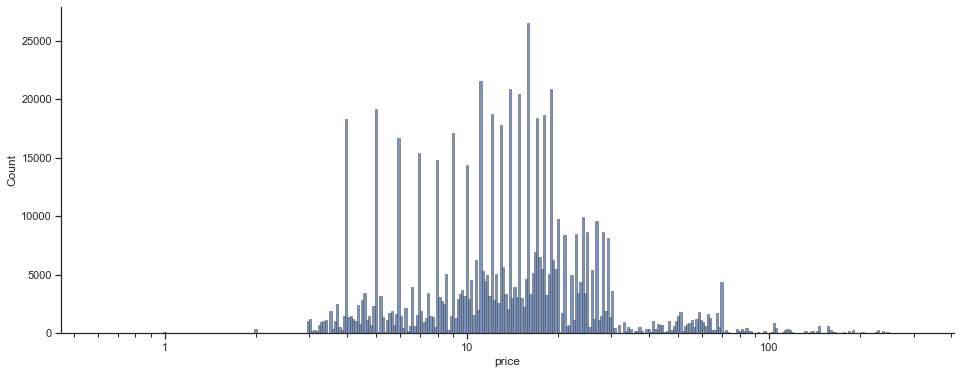

In [69]:
import matplotlib as mpl

sns.set_theme(style="ticks")


f, ax = plt.subplots(figsize=(16, 6))
sns.despine(f)

sns.histplot(
    df_transactions_products_customers,
    x="price",
    palette="light:m_r",
    edgecolor=".3",
    linewidth=.5,
    log_scale=True,
)
ax.xaxis.set_major_formatter(mpl.ticker.ScalarFormatter())

# - Appairement des variables

In [64]:
%%time

appair_plot = df_transactions_products_customers.drop(columns=['id_prod', 'date', 'session_id', 'client_id', 'heure',
                                                               'minute','birth'])

sns.pairplot(appair_plot, hue = "categ", diag_kind = "kde", height = 8)

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x0000029400192550> (for post_execute):



KeyboardInterrupt



# - Consolidation du CA total par prix des articles vendus

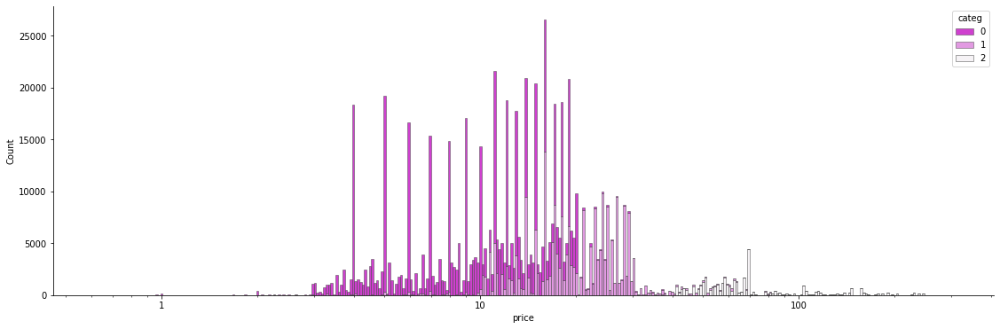

In [71]:
import matplotlib as mpl

f, ax = plt.subplots(figsize=(19, 6))
sns.despine(f)

sns.histplot(
    df_transactions_products_customers,
    x="price", hue="categ",
    multiple="stack",
    palette="light:m_r",
    edgecolor=".3",
    linewidth=.5,
    log_scale=True,
)
ax.xaxis.set_major_formatter(mpl.ticker.ScalarFormatter())


# - Moyennes des prix de vente par mois et par années

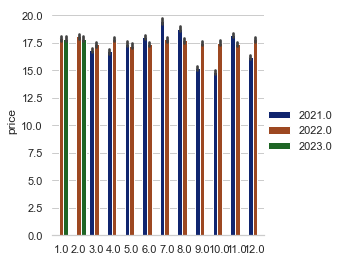

In [68]:
sns.set_theme(style="whitegrid")

g = sns.catplot(data=df_transactions_products_customers, kind="bar",
                x="mois", y="price", hue="année", palette="dark", height=4)

g.despine(left=True)
g.set_axis_labels("", "price")
g.legend.set_title("")

# - Moyennes des prix de vente par catégorie de produits et par mois :

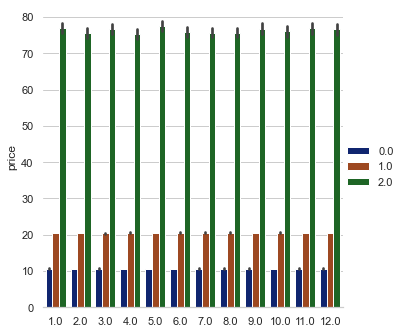

In [69]:
import seaborn as sns
sns.set_theme(style="whitegrid")

g = sns.catplot(
    data=df_transactions_products_customers, kind="bar",
    x="mois", y="price", hue="categ", palette="dark", height=5
)
g.despine(left=True)
g.set_axis_labels("", "price")
g.legend.set_title("")

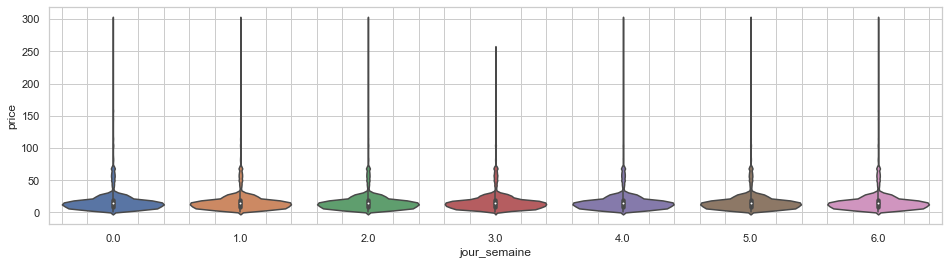

In [70]:
plt.figure(figsize=(16,4))
ax1 = sns.violinplot("jour_semaine", "price", data=df_transactions_products_customers)
ax1.minorticks_on()
ax1.grid(which='minor', axis='x', linewidth=1)

#### --- Observation ---
#### Le jeudi plafond des ventes à 250 dollars.

---

# - Visualisation du prix moyen des ventes par jour

In [65]:
#plt.figure(figsize=(16,16))

#sns.boxplot(x=df_transactions_products_customers["jour_semaine"], y=df_transactions_products_customers["price"])

In [66]:
## Représentation de la densité moyenne

<AxesSubplot:xlabel='jour', ylabel='mois'>

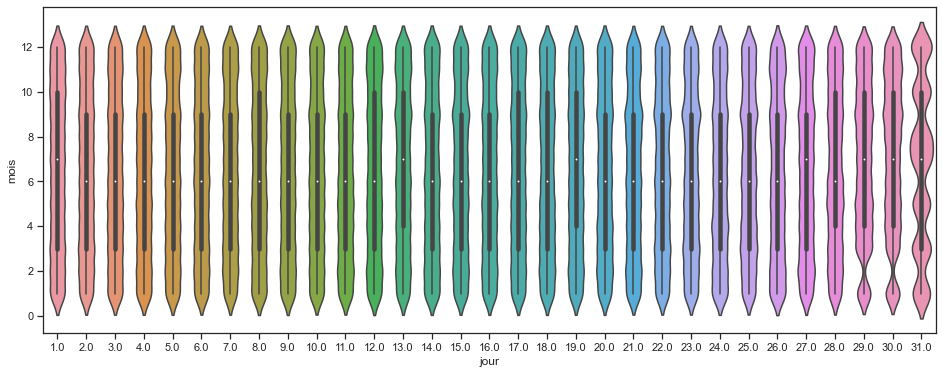

In [67]:
plt.figure(figsize=(16,6))
sns.violinplot(df_transactions_products_customers['jour'],df_transactions_products_customers['mois'],height=12)

#### --- Observations cycliques ---
#### Augmentation de panier d'achat les jours suivants : 1, 13, 19, 27, 29, 30, 31.
#### Ils achètent des produits un peu plus cher le 8 et le 18.

---

## - Analyse rapide des densitées mensuelles de commandes :

<AxesSubplot:xlabel='mois', ylabel='Density'>

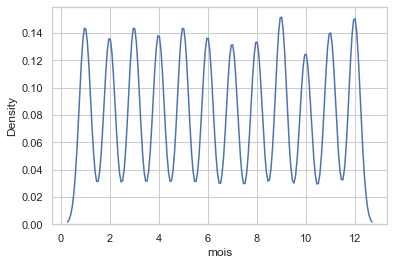

In [74]:
sns.kdeplot(df_transactions_products_customers['mois'])

#### --- Observations ---
#### Pics de densité des ventes : Septembre et Décembre.
#### Cibles secondaires : Janvier, Mars, Mai, Novembre. 

---
---

# 2/ - Évolution dans le temps -
## Analyse TIME SERIES - Décomposition en moyenne mobile

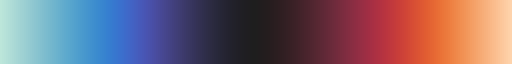

In [72]:
import datetime
sns.set_style("whitegrid")
sns.color_palette("tab10")
sns.color_palette("icefire", as_cmap=True)

In [66]:
data = pd.DataFrame({'year': df_transactions_products_customers["année"],
                   'month': df_transactions_products_customers["mois"],
                   'day': df_transactions_products_customers["jour"]})

data = pd.to_datetime(data)

data = pd.DataFrame({'date': data, 'price': df_transactions_products_customers["price"]})

data = data.set_index("date")

In [67]:
data['CA_cumulé'] = 0

for i in data.index.unique(): 
     data['CA_cumulé'][i] += data['price'][i].sum()

## - CA par jour sur 3 ans

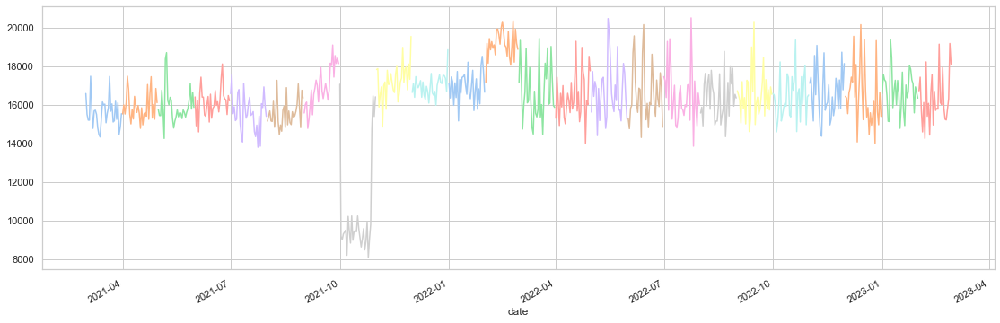

In [68]:
data['CA_cumulé'].resample('M').plot(figsize=(19, 6))
plt.show()

## 2020 - CA par jour

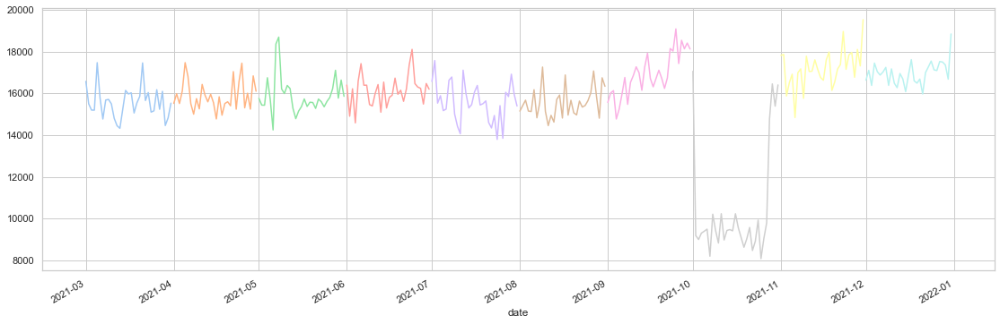

In [69]:
plt.figure(figsize=(19,6))
data.loc['2021', 'CA_cumulé'].resample('M').plot()
plt.show()

## 2021 - CA par jour

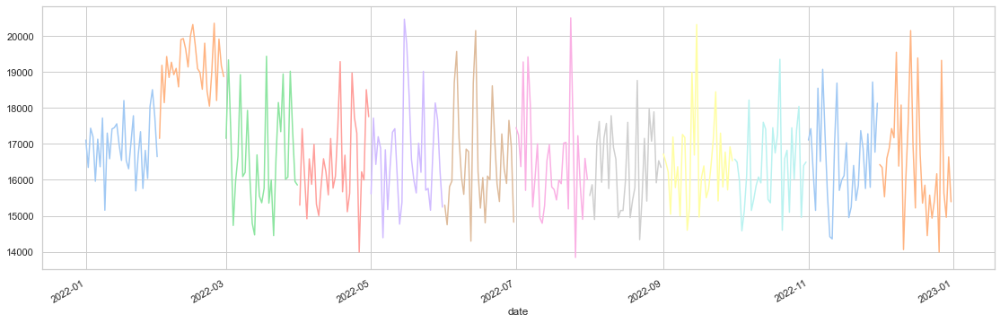

In [70]:
plt.figure(figsize=(19,6))
data.loc['2022', 'CA_cumulé'].resample('M').plot()
plt.show()

## 2022 - CA par jour

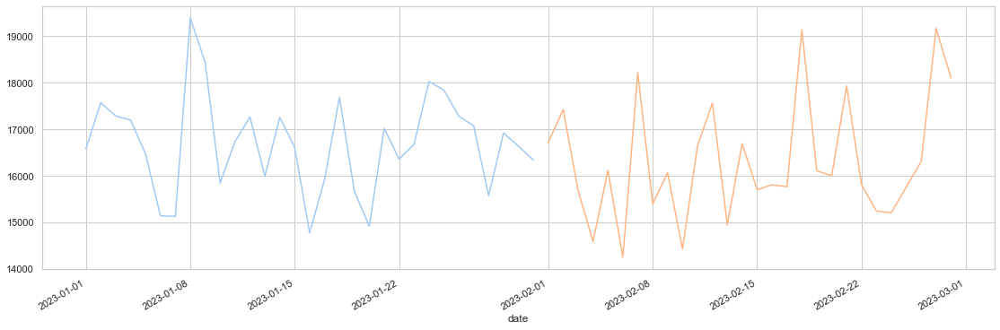

In [71]:
plt.figure(figsize=(19,6))
data.loc['2023', 'CA_cumulé'].resample('M').plot()
plt.show()

# - Moyenne de CA journalier sur 3 dernières années

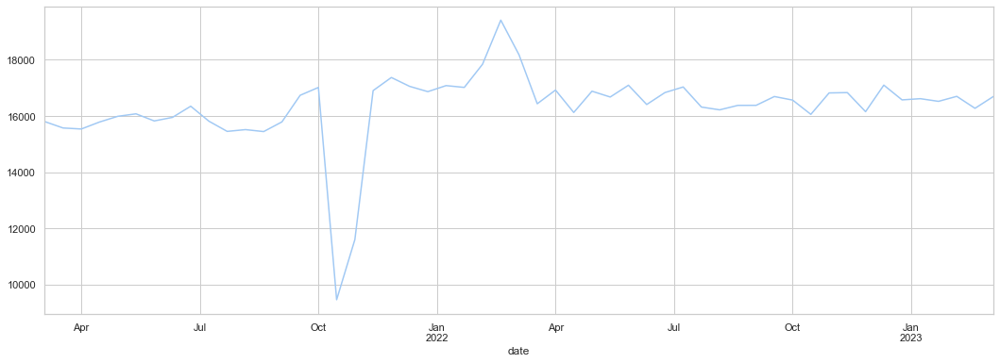

In [72]:
plt.figure(figsize=(18,6))
data.loc['2021':'2023', 'CA_cumulé'].resample('2W').mean().plot()
plt.show()

# - Variations de CA sur les 3 dernières années

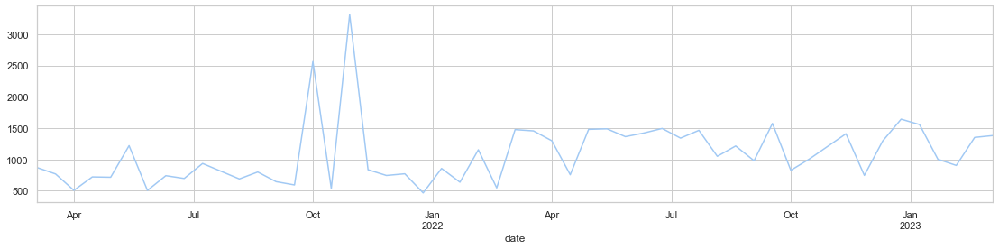

In [73]:
plt.figure(figsize=(19,4))
data.loc['2021':'2023', 'CA_cumulé'].resample('2W').std().plot()
plt.show()

## 2020 - affichage moyennes mobiles mois et semaine

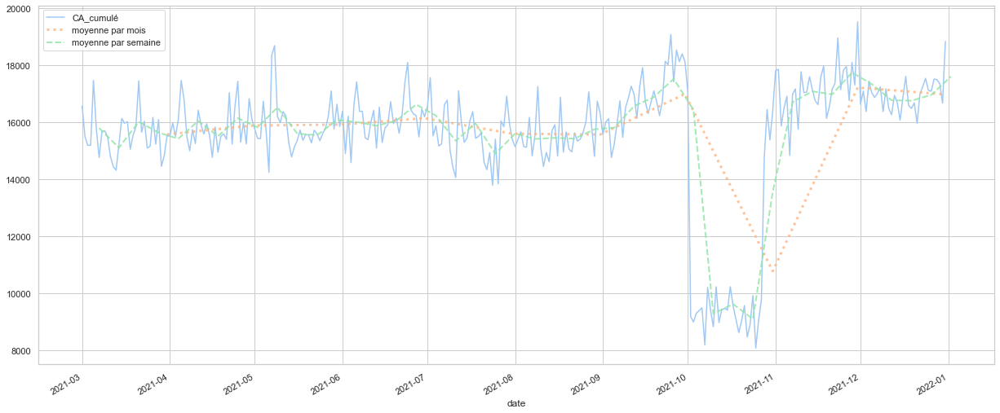

In [74]:
plt.figure(figsize=(21,9))
data.loc['2021', 'CA_cumulé'].plot()
data.loc['2021', 'CA_cumulé'].resample('M').mean().plot(label='moyenne par mois', lw=3, ls=':', alpha=0.8)
data.loc['2021', 'CA_cumulé'].resample('W').mean().plot(label='moyenne par semaine', lw=2, ls='--', alpha=0.8)
plt.legend()
plt.show()

## 2021 - affichage des moyennes mobiles mois et semaine

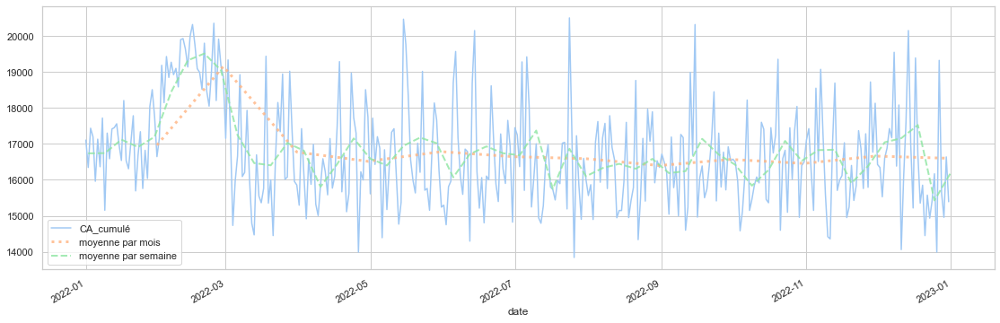

In [75]:
plt.figure(figsize=(19, 6))
data.loc['2022', 'CA_cumulé'].plot()
data.loc['2022', 'CA_cumulé'].resample('M').mean().plot(label='moyenne par mois', lw=3, ls=':', alpha=0.8)
data.loc['2022', 'CA_cumulé'].resample('W').mean().plot(label='moyenne par semaine', lw=2, ls='--', alpha=0.8)
plt.legend()
plt.show()

## Début 2022 - affichage des moyennes mobiles mois et semaine

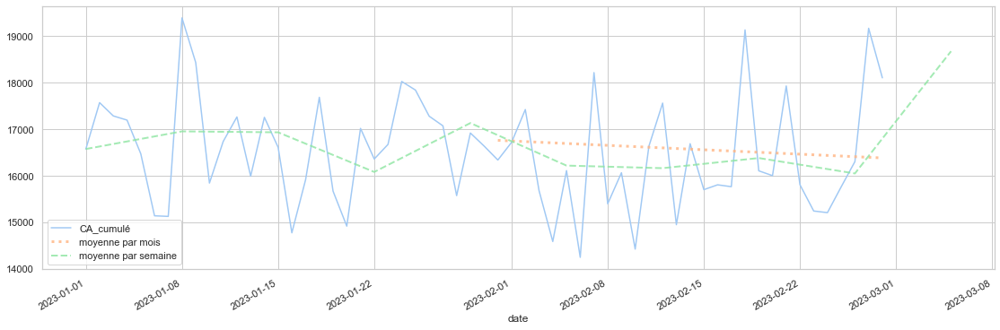

In [76]:
plt.figure(figsize=(19, 6))
data.loc['2023', 'CA_cumulé'].plot()
data.loc['2023', 'CA_cumulé'].resample('M').mean().plot(label='moyenne par mois', lw=3, ls=':', alpha=0.8)
data.loc['2023', 'CA_cumulé'].resample('W').mean().plot(label='moyenne par semaine', lw=2, ls='--', alpha=0.8)
plt.legend()
plt.show()

## 2020 - Analyse dynamique min/max par semaine sur moyenne mobile

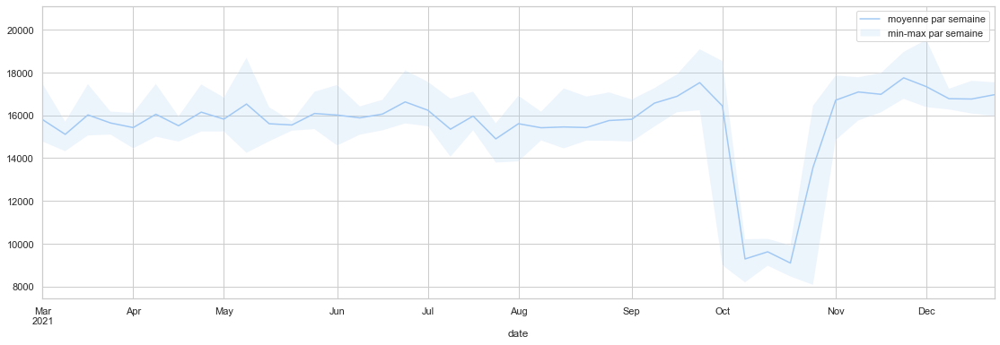

In [77]:
m = data['CA_cumulé'].resample('W').agg(['mean', 'std', 'min', 'max'])

plt.figure(figsize=(19, 6))
m['mean']['2021'].plot(label='moyenne par semaine')
plt.fill_between(m.index, m['max'], m['min'], alpha=0.2, label='min-max par semaine')

plt.legend()
plt.show()

## 2020 - moyenne mobile, dérivation, min , max

<AxesSubplot:xlabel='date'>

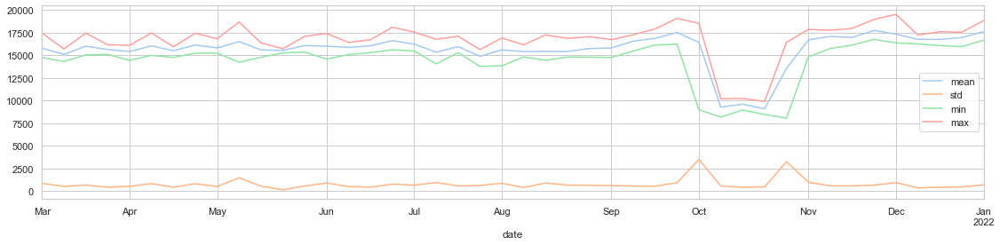

In [78]:
data.loc['2021', 'CA_cumulé'].resample('W').agg(['mean', 'std', 'min', 'max']).plot(figsize=(19, 4))

## 2021 - moyenne mobile, dérivation, min , max

<AxesSubplot:xlabel='date'>

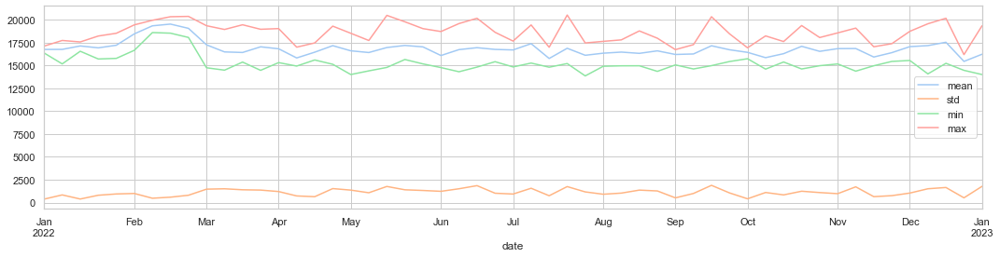

In [79]:
data.loc['2022', 'CA_cumulé'].resample('W').agg(['mean', 'std', 'min', 'max']).plot(figsize=(18, 4))

## 2022 - moyenne mobile, dérivation, min , max

<AxesSubplot:xlabel='date'>

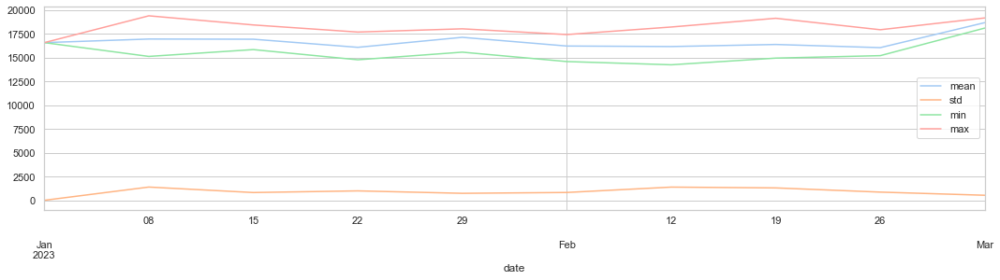

In [80]:
data.loc['2023', 'CA_cumulé'].resample('W').agg(['mean', 'std', 'min', 'max']).plot(figsize=(18, 4))

## 2022 - moyennes exponentielles

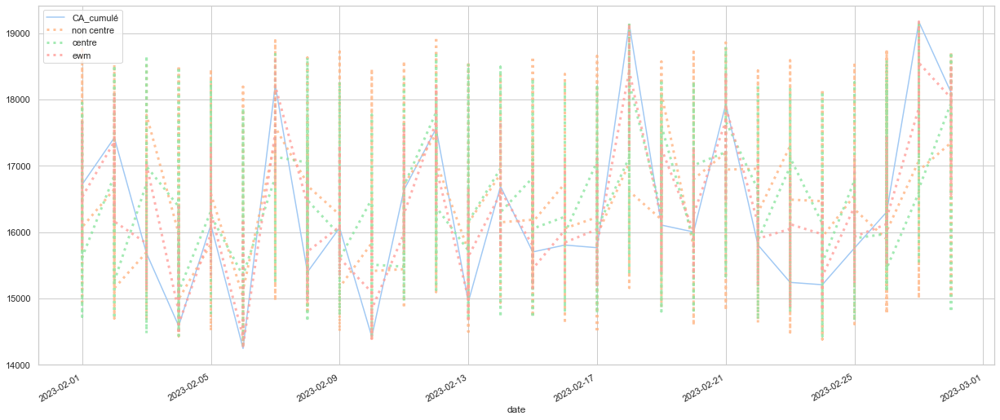

In [81]:
plt.figure(figsize=(21, 9))
data.loc['2023-2', 'CA_cumulé'].plot()
data.loc['2023-2', 'CA_cumulé'].rolling(window=7).mean().plot(label='non centre', lw=3, ls=':', alpha=0.8)
data.loc['2023-2', 'CA_cumulé'].rolling(window=7, center=True).mean().plot(label='centre', lw=3, ls=':', alpha=0.8)
data.loc['2023-2', 'CA_cumulé'].ewm(alpha=0.6).mean().plot(label='ewm', lw=3, ls=':', alpha=0.8)
plt.legend()
plt.show()

## - Calculs de variance et de moyennes

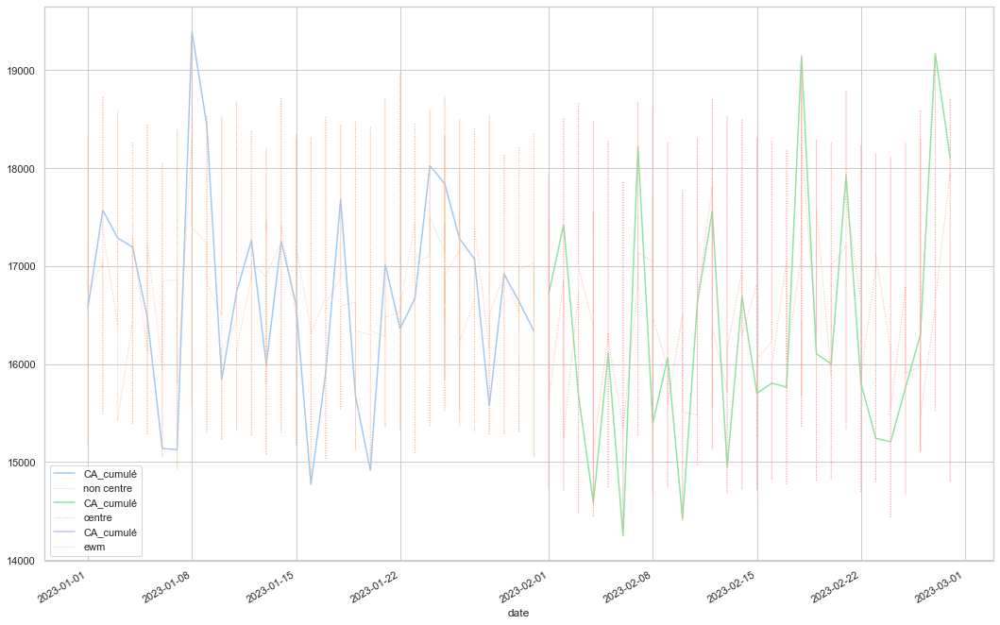

In [82]:
plt.figure(figsize=(18, 12))
data.loc['2023-1', 'CA_cumulé'].plot()
data.loc['2023-1', 'CA_cumulé'].rolling(window=7).mean().plot(label='non centre', lw=1, ls=':', alpha=0.8)
data.loc['2023-2', 'CA_cumulé'].plot()
data.loc['2023-2', 'CA_cumulé'].rolling(window=7, center=True).mean().plot(label='centre', lw=1, ls=':', alpha=0.8)
data.loc['2023-3', 'CA_cumulé'].plot()
data.loc['2023-3', 'CA_cumulé'].ewm(alpha=0.6).mean().plot(label='ewm', lw=1, ls=':', alpha=0.8)
plt.legend()
plt.show()

# - Dynamique temporelle par variance statistique progressive

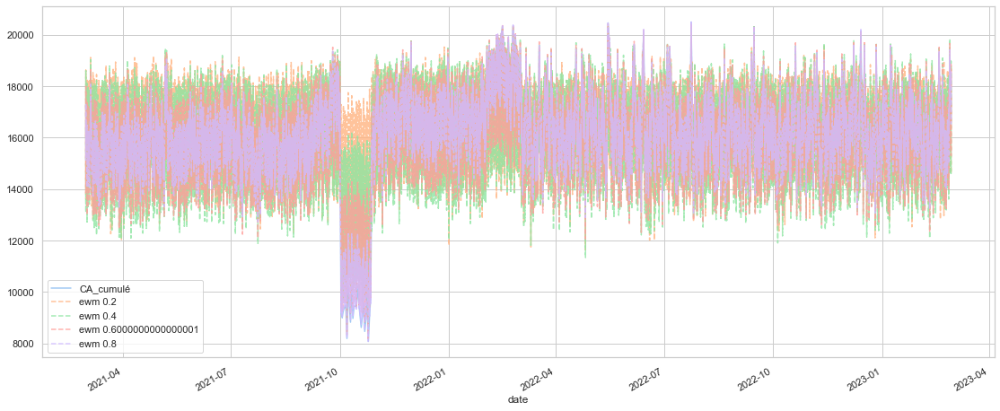

In [83]:
plt.figure(figsize=(19, 8))
data.loc['2020':'2023', 'CA_cumulé'].plot()
for i in np.arange(0.2, 1, 0.2):
    data.loc['2020':'2023', 'CA_cumulé'].ewm(alpha=i).mean().plot(label=f'ewm {i}', ls='--', alpha=0.8)
plt.legend()
plt.show()

#### Observations :
#### Malgré l'instabilité de la période d'Octobre 2020 on constate une stabilisation quasi totale du CA.
#### Le ⚡🕵️‍♂️ profilage client 🕵️‍♂️⚡ et l'affinement des 🥋🕒stratégies de communication💞 devraient conduire les résultats vers l'amélioration 💖🚀

#### Observations :

#### Possibilité de vous assistez dans le développement de meilleurs patterns d'identifications des besoins, envies, dans l'imaginaire gravitationnel du client.
#### Par l'approfondissement de vos Persona Client et la mise en place par exemple avec le Natural Langage Processing de visualisations permettant de synthétiser la lexicographie imaginaire ainsi que les récurrences de langage présentent dans les livres qu'achètent les clients.
#### Cela afin de décomplexifier l'imaginaire de vos clients pour toujours mieux pouvoir les comprendre et leurs proposer le produit adéquat.
#### En statistique on peut contrôler ce qu'on peut mesurer, nos livres sont une ressources brillantes...

# 🧙‍♂️🧙‍♂️🧙‍♂️👩‍💻👩‍💻👩‍💻🚀🚀🚀

---

# Comparaison de séries temporelles :

array([<AxesSubplot:xlabel='date'>], dtype=object)

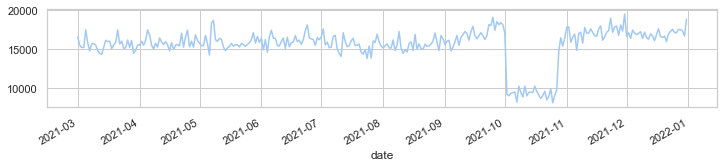

In [84]:
data['CA_cumulé']['2021'].plot(subplots=True, figsize=(12, 2))

array([<AxesSubplot:xlabel='date'>], dtype=object)

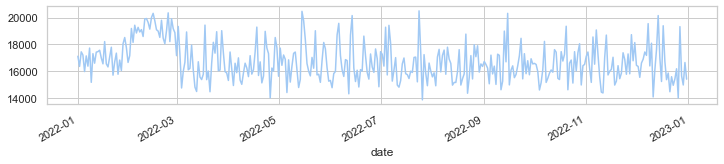

In [85]:
data['CA_cumulé']['2022'].plot(subplots=True, figsize=(12, 2))

array([<AxesSubplot:xlabel='date'>], dtype=object)

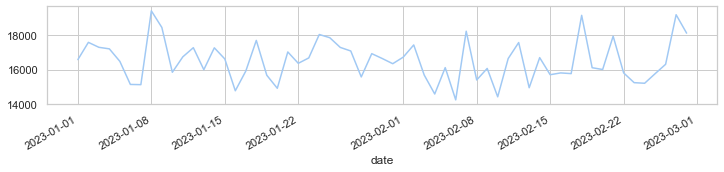

In [86]:
data['CA_cumulé']['2023'].plot(subplots=True, figsize=(12, 2))

---

# Age moyen des clients :

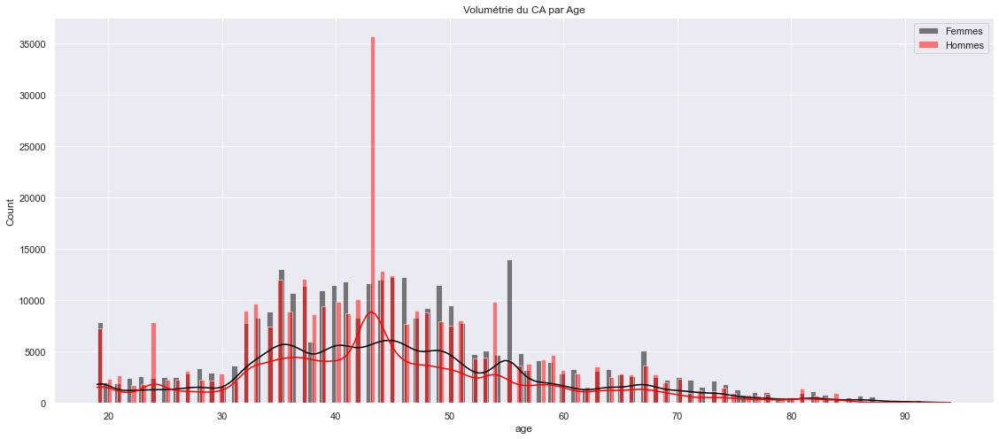

In [87]:
df_transactions_products_customers.sort_values("date")

sns.set(style="darkgrid")
plt.figure(figsize=(19,8))
sns.histplot(data=df_transactions_products_customers.loc[df_transactions_products_customers['sex']=="f",:], x="age", color="black", label="Femmes", kde=True)
sns.histplot(data=df_transactions_products_customers.loc[df_transactions_products_customers['sex']=="m",:], x="age", color="red", label="Hommes", kde=True)
plt.title("Volumétrie du CA par Age")
plt.legend() 
plt.show()

#### Observations :
#### Les hommes - consommation augmentée : de 31 à 53 ans, pics : de 40 à 43 ans, à 23 et à 53 ans.
#### De 40 à 43 ans l'homme se pose peut-être beaucoup de questions : crise de la quarantaine?  pic extrême...
#### Femmes -  consommation augmentée : de 32 à 42 ans, 45, 48, 49, 54, 66 ans.
#### Des moments importants dans leurs vies?
#### Recommandations : Réaliser des campagnes de marketing ciblées, se renseignées sur les récurrences perceptuelles de pensées sur la clientèle de tes tranches d'age, objectif : mieux comprendre le contexte mental des individus.

---

## - Analyse de représentativité en age et price

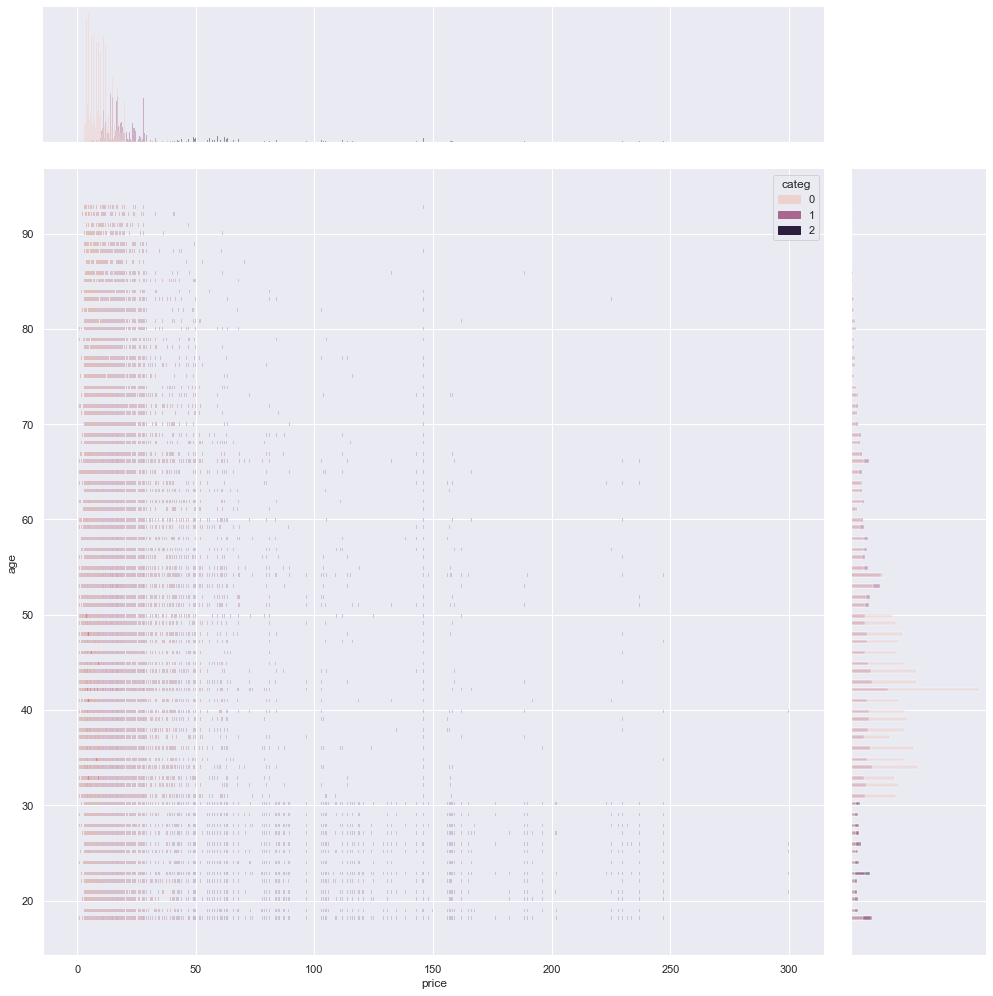

In [135]:
sns.jointplot(data=df_transactions_products_customers, x=df_transactions_products_customers["price"], y=df_transactions_products_customers["age"], kind="hist",hue='categ',height=14)

## - Analyse de représentativité en age et categ

<Figure size 1368x1368 with 0 Axes>

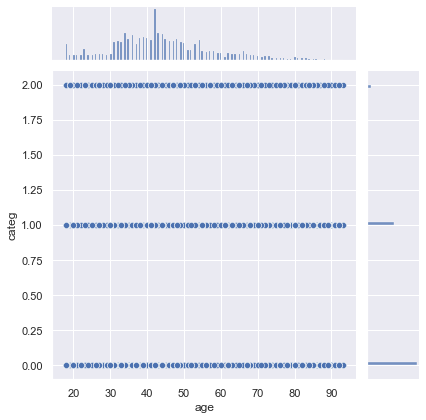

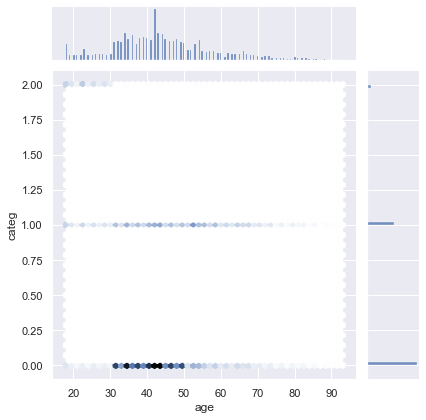

In [137]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(19,19))

# Custom the inside plot: options are: “scatter” | “reg” | “resid” | “kde” | “hex”

sns.jointplot(x=df_transactions_products_customers["age"], y=df_transactions_products_customers["categ"], kind='scatter')

sns.jointplot(x=df_transactions_products_customers["age"], y=df_transactions_products_customers["categ"], kind='hex')

plt.show()

# 2a/ Lien Age & categ avec filtre femme/homme :

<Figure size 2160x2160 with 0 Axes>

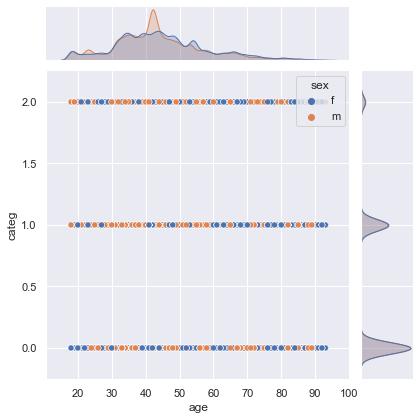

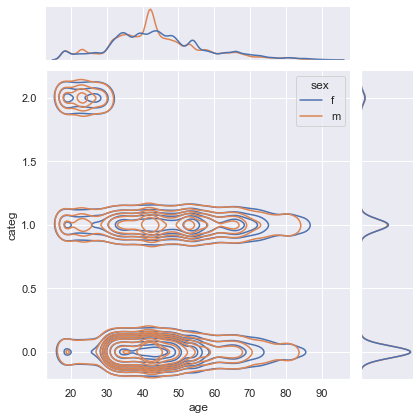

In [138]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(30,30))

# Custom the inside plot: options are: “scatter” | “reg” | “resid” | “kde” | “hex”

sns.jointplot(x=df_transactions_products_customers["age"], y=df_transactions_products_customers["categ"], kind='scatter', hue=df_transactions_products_customers["sex"])

sns.jointplot(x=df_transactions_products_customers["age"], y=df_transactions_products_customers["categ"], kind='kde',hue=df_transactions_products_customers["sex"])

plt.show()

## Taux de représentativité de chaque catégorie :

<AxesSubplot:ylabel='categ'>

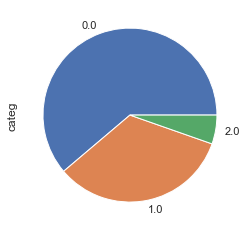

In [91]:
df_transactions_products_customers.categ.value_counts().plot.pie()

---

# - Calcul de fréquence d'achat moyenne

In [65]:
# nbre de clients différents / Temps d'activité :
df_transactions_products_customers.client_id.unique().shape, df_transactions_products_customers['date'].max()-df_transactions_products_customers['date'].min()
# nbre de ventes :
print("nbVentes : ",df_transactions_products_customers.price.count(), " nbVentesJour : ", 679332/729, "nbVentesMoyensParClient :",8600 / 931.8683127572017) 

nbVentes :  679332  nbVentesJour :  931.8683127572017 nbVentesMoyensParClient : 9.2287717934677


In [66]:
# Nbre de ventes par jours :
679332/729

931.8683127572017

In [67]:
8600 / 931.8683127572017

9.2287717934677

#### La fréquence moyenne d'achat est d'un achat pour un client tous les 9.23 jours.

### 🚀🚀🚀 ? Plus de fréquences ? 🚀🚀🚀

### Mettons un peu d'ordre avant et supprimons le mois d'Octobre où nous avions rencontré des problèmes afin de ne pas fausser nos résulats d'étude : 

In [68]:
df_transactions_products_customers.shape

(679332, 15)

In [69]:
df_transactions_products_customers_exclusion = df_transactions_products_customers.loc[df_transactions_products_customers['année']==2021,:]
df_transactions_products_customers_exclusion = df_transactions_products_customers_exclusion.loc[df_transactions_products_customers_exclusion['mois']==10.0,:]
df_transactions_products_customers_exclusion.shape

(21606, 15)

In [70]:
df_transactions_products_customers = df_transactions_products_customers.drop(index=df_transactions_products_customers_exclusion.index,axis=0)

In [71]:
df_transactions_products_customers.shape

(657726, 15)

---

# - Indicateur d'Analyse Marketing RFM -
#### Récense = Ancienneté client
#### Fréquence = Fréq_achat_nb_jours_pour_un_achat
#### Montant = CA Total généré par client

In [72]:
m = df_transactions_products_customers.groupby('client_id')['price'].sum()
m = pd.DataFrame(m).reset_index()
m.head(1)

,client_id,price
0,c_1,550.19


In [73]:
freq = df_transactions_products_customers.groupby('client_id')['date'].count()
f = pd.DataFrame(freq).reset_index()
f.head(1)

,client_id,date
0,c_1,38


In [74]:
df_transactions_products_customers['Date']= pd.to_datetime(df_transactions_products_customers['date'])
df_transactions_products_customers['rank'] = df_transactions_products_customers.sort_values(['client_id','Date']).groupby(['client_id'])['Date'].rank(method='min').astype(int)
recent = df_transactions_products_customers[df_transactions_products_customers['rank']==1]
recent['recency'] = recent['Date'] - pd.to_datetime('2023-04-01 08:26:00')
recent = recent[['client_id','recency']]
recent = recent.drop_duplicates()
finaldf = f.merge(m,on='client_id').merge(recent,on='client_id')
finaldf['fréq_achat_nb_jours_pour_un_achat'] = finaldf['recency']/finaldf['date']
finaldf.rename(columns={'price': 'CA Total généré par client','recency':'Ancienneté client'}, inplace=True)
finaldf["panier_moyen_des_commandes"]=finaldf["CA Total généré par client"]/finaldf["date"]
finaldf['rank'] = finaldf.sort_values(['client_id','fréq_achat_nb_jours_pour_un_achat']).groupby(['client_id'])['fréq_achat_nb_jours_pour_un_achat'].rank(method='min').astype(int)
finaldf

,client_id,date,CA Total généré par client,Ancienneté client,fréq_achat_nb_jours_pour_un_achat,panier_moyen_des_commandes,rank
0,c_1,38,550.19,-659 days +12:36:39.382765,-18 days +16:07:16.825862237,14.478684,1
1,c_10,58,1353.60,-742 days +18:24:16.551727,-13 days +05:16:58.216409087,23.337931,1
2,c_100,8,254.85,-712 days +21:00:43.133053,-89 days +02:37:35.391631625,31.856250,1
3,c_1000,122,2209.92,-749 days +05:08:14.618755,-7 days +20:41:52.250973402,18.114098,1
4,c_1001,96,1720.08,-755 days +04:35:15.964197,-8 days +03:17:52.041293719,17.917500,1
...,...,...,...,...,...,...,...
8593,c_995,14,189.41,-724 days +18:24:33.499557,-52 days +08:10:19.535682643,13.529286,1
8594,c_996,94,1611.59,-761 days +06:40:18.594244,-9 days +21:46:23.176534511,17.144574,1
8595,c_997,58,1432.02,-701 days +11:15:32.340325,-13 days +22:07:30.557591811,24.690000,1
8596,c_998,53,2779.88,-745 days +17:06:33.677785,-15 days +22:57:51.578826133,52.450566,1


---

### Extraction d'un fichier Excel pour usage sous Tableur : - Analyse_RFM.xlsx -

In [75]:
Analyse_RFM = finaldf

datatoexcel = Analyse_RFM

datatoexcel = pd.ExcelWriter('Analyse_RFM.xlsx')

Analyse_RFM.to_excel(datatoexcel)

datatoexcel.save()
print('DataFrame is written to Excel File successfully.')

DataFrame is written to Excel File successfully.


---
# -----------------------------------------------------------------------------------------------------------
---

# ... Préparation des données ...
### Modifications & Transformations sur les données :

In [76]:
# Acte 1 : Création de classes catégorielles utilisées dans le marketing :

# - Simplification du nom des colonnes -

finaldf = finaldf.rename(columns = {"date":"nbr_achats"})
finaldf = finaldf.rename(columns = {"CA Total généré par client":"CA_tot_client"})
finaldf = finaldf.rename(columns = {"Ancienneté client":"Ancienneté"})
finaldf = finaldf.rename(columns = {"fréq_achat_nb_jours_pour_un_achat":"fréq_achat"})
finaldf = finaldf.rename(columns = {"panier_moyen_des_commandes":"panier_moyen"})
finaldf

# finaldf : ------------------------------- Discrétization du CA total par client -------------------------------

finaldf['tranche_CA_Total_Client_0000_0099'] = np.where((finaldf.CA_tot_client > 0) & (finaldf.CA_tot_client < 100), 1, 0).astype(np.int8);
finaldf['tranche_CA_Total_Client_0100_0499'] = np.where((finaldf.CA_tot_client >= 100) & (finaldf.CA_tot_client < 500), 2, 0).astype(np.int8);
finaldf['tranche_CA_Total_Client_0500_0999'] = np.where((finaldf.CA_tot_client >= 500) & (finaldf.CA_tot_client < 1000), 3, 0).astype(np.int8);
finaldf['tranche_CA_Total_Client_1000_1999'] = np.where((finaldf.CA_tot_client >= 1000) & (finaldf.CA_tot_client < 2000), 4, 0).astype(np.int8);
finaldf['tranche_CA_Total_Client_2000_3999'] = np.where((finaldf.CA_tot_client >= 2000) & (finaldf.CA_tot_client < 4000), 5, 0).astype(np.int8);
finaldf['tranche_CA_Total_Client_4000+'] = np.where((finaldf.CA_tot_client >= 4000),6, 0).astype(np.int8);

finaldf['tranche_CA_Total_Client'] = finaldf['tranche_CA_Total_Client_0000_0099'] + finaldf['tranche_CA_Total_Client_0100_0499'] + finaldf['tranche_CA_Total_Client_0500_0999'] + finaldf['tranche_CA_Total_Client_1000_1999'] + finaldf['tranche_CA_Total_Client_2000_3999'] + finaldf['tranche_CA_Total_Client_4000+'] 
finaldf = finaldf.drop(columns=['tranche_CA_Total_Client_0000_0099','tranche_CA_Total_Client_0100_0499','tranche_CA_Total_Client_0500_0999','tranche_CA_Total_Client_1000_1999','tranche_CA_Total_Client_2000_3999','tranche_CA_Total_Client_4000+'])

# finaldf : ------------------------------- Discrétization du CA total par client -------------------------------

finaldf['tranche_CA_Total_Client_0000_0099'] = np.where((finaldf.CA_tot_client > 0) & (finaldf.CA_tot_client < 100), 1, 0).astype(np.int8);
finaldf['tranche_CA_Total_Client_0100_0499'] = np.where((finaldf.CA_tot_client >= 100) & (finaldf.CA_tot_client < 500), 2, 0).astype(np.int8);
finaldf['tranche_CA_Total_Client_0500_0999'] = np.where((finaldf.CA_tot_client >= 500) & (finaldf.CA_tot_client < 1000), 3, 0).astype(np.int8);
finaldf['tranche_CA_Total_Client_1000_1999'] = np.where((finaldf.CA_tot_client >= 1000) & (finaldf.CA_tot_client < 2000), 4, 0).astype(np.int8);
finaldf['tranche_CA_Total_Client_2000_3999'] = np.where((finaldf.CA_tot_client >= 2000) & (finaldf.CA_tot_client < 4000), 5, 0).astype(np.int8);
finaldf['tranche_CA_Total_Client_4000+'] = np.where((finaldf.CA_tot_client >= 4000), 6, 0).astype(np.int8);

finaldf['tranche_CA_Total_Client'] = finaldf['tranche_CA_Total_Client_0000_0099'] + finaldf['tranche_CA_Total_Client_0100_0499'] + finaldf['tranche_CA_Total_Client_0500_0999'] + finaldf['tranche_CA_Total_Client_1000_1999'] + finaldf['tranche_CA_Total_Client_2000_3999'] + finaldf['tranche_CA_Total_Client_4000+'] 
finaldf = finaldf.drop(columns=['tranche_CA_Total_Client_0000_0099','tranche_CA_Total_Client_0100_0499','tranche_CA_Total_Client_0500_0999','tranche_CA_Total_Client_1000_1999','tranche_CA_Total_Client_2000_3999','tranche_CA_Total_Client_4000+'])

# df_transactions_products_customers : ---------------- Discrétization Marketing des âges ---------------------------

df_transactions_products_customers['age_18_25'] = np.where((df_transactions_products_customers.age > 17) & (df_transactions_products_customers.age < 25), 1, 0).astype(np.int8);
df_transactions_products_customers['age_25_35'] = np.where((df_transactions_products_customers.age >= 25) & (df_transactions_products_customers.age < 35), 2, 0).astype(np.int8);
df_transactions_products_customers['age_35_45'] = np.where((df_transactions_products_customers.age >= 35) & (df_transactions_products_customers.age < 45), 3, 0).astype(np.int8);
df_transactions_products_customers['age_45_55'] = np.where((df_transactions_products_customers.age >= 45) & (df_transactions_products_customers.age < 55), 4, 0).astype(np.int8);
df_transactions_products_customers['age_55_65'] = np.where((df_transactions_products_customers.age >= 55) & (df_transactions_products_customers.age < 65), 5, 0).astype(np.int8);
df_transactions_products_customers['age_65_+'] = np.where((df_transactions_products_customers.age >= 65) & (df_transactions_products_customers.age <= 120), 6, 0).astype(np.int8);

df_transactions_products_customers['classe_age'] = df_transactions_products_customers['age_18_25'] + df_transactions_products_customers['age_25_35'] + df_transactions_products_customers['age_35_45'] + df_transactions_products_customers['age_45_55'] + df_transactions_products_customers['age_55_65'] + df_transactions_products_customers['age_65_+'] 
df_transactions_products_customers = df_transactions_products_customers.drop(columns=['age_18_25','age_25_35','age_35_45','age_45_55','age_55_65','age_65_+'])


In [77]:
# - Intégration de l'age sur l'analyse RFM -

from scipy import stats

def CreateFeatures_categ_affiliates(df):

    categ_affiliates = (df.groupby('client_id', as_index = False)
          .agg({ # 'id_prod': 'nunique',
                'jour_semaine':lambda x:stats.mode(x)[0],
                'categ': lambda x:stats.mode(x)[0],
                'age' : 'median',
               }) 
                              
          .rename(columns = {
              # 'id_prod':'nbr_id_prod_différentes_achetées',
              'jour_semaine':'jour_max_commandes',
              'categ':'categ_max_achat',
              'age' : 'age_moyen',
            }))
    
    df = df.merge(categ_affiliates, on ="client_id", how="inner")
    return(df)

# finaldf['age_moyen'] = finaldf.merge(df_transactions_products_customers, client.groupby('client_id')['age'].transform('mean') #.sort_values()
# finaldf

In [78]:
df_transactions_products_customers.columns
df_fusion = df_transactions_products_customers.drop(columns=['id_prod','date','session_id','année','heure','mois','jour','minute','price','birth','Date','rank'])
df_fusion = CreateFeatures_categ_affiliates(df_fusion)

In [79]:
# Pour le confort graphique implémentation des unité au lieu des encodages :

df_fusion.loc[df_fusion['classe_age']==1,{"Classe_Age"}] = "18_25"
df_fusion.loc[df_fusion['classe_age']==2,{"Classe_Age"}] = "25_35"
df_fusion.loc[df_fusion['classe_age']==3,{"Classe_Age"}] = "35_45"
df_fusion.loc[df_fusion['classe_age']==4,{"Classe_Age"}] = "45_55"
df_fusion.loc[df_fusion['classe_age']==5,{"Classe_Age"}] = "55_65"
df_fusion.loc[df_fusion['classe_age']==6,{"Classe_Age"}] = "65_+"

df_fusion.loc[df_fusion['jour_max_commandes']==0,{"Jour_Max_Achats"}] = "Lundi"
df_fusion.loc[df_fusion['jour_max_commandes']==1,{"Jour_Max_Achats"}] = "Mardi"
df_fusion.loc[df_fusion['jour_max_commandes']==2,{"Jour_Max_Achats"}] = "Mercredi"
df_fusion.loc[df_fusion['jour_max_commandes']==3,{"Jour_Max_Achats"}] = "Jeudi"
df_fusion.loc[df_fusion['jour_max_commandes']==4,{"Jour_Max_Achats"}] = "Vendredi"
df_fusion.loc[df_fusion['jour_max_commandes']==5,{"Jour_Max_Achats"}] = "Samedi"
df_fusion.loc[df_fusion['jour_max_commandes']==6,{"Jour_Max_Achats"}] = "Dimanche"

finaldf.loc[finaldf['tranche_CA_Total_Client']==1,{"Tranche_CA_Tot"}] = "0000_0099"
finaldf.loc[finaldf['tranche_CA_Total_Client']==2,{"Tranche_CA_Tot"}] = "0100_0499"
finaldf.loc[finaldf['tranche_CA_Total_Client']==3,{"Tranche_CA_Tot"}] = "0500_0999"
finaldf.loc[finaldf['tranche_CA_Total_Client']==4,{"Tranche_CA_Tot"}] = "1000_1999"
finaldf.loc[finaldf['tranche_CA_Total_Client']==5,{"Tranche_CA_Tot"}] = "2000_3999"
finaldf.loc[finaldf['tranche_CA_Total_Client']==6,{"Tranche_CA_Tot"}] = "4000_+"

df_fusion = df_fusion.drop(columns=['jour_max_commandes','classe_age','categ','jour_semaine','age'])
finaldf = finaldf.drop(columns=['tranche_CA_Total_Client'])
df_fusion = df_fusion.drop_duplicates()

df_fusion = df_fusion.merge(finaldf, on = 'client_id', how = 'inner')

In [80]:
df_fusion.columns

Index(['client_id', 'sex', 'categ_max_achat', 'age_moyen', 'Classe_Age',
       'Jour_Max_Achats', 'nbr_achats', 'CA_tot_client', 'Ancienneté',
       'fréq_achat', 'panier_moyen', 'rank', 'Tranche_CA_Tot'],
      dtype='object')

<AxesSubplot:xlabel='Tranche_CA_Tot', ylabel='Classe_Age'>

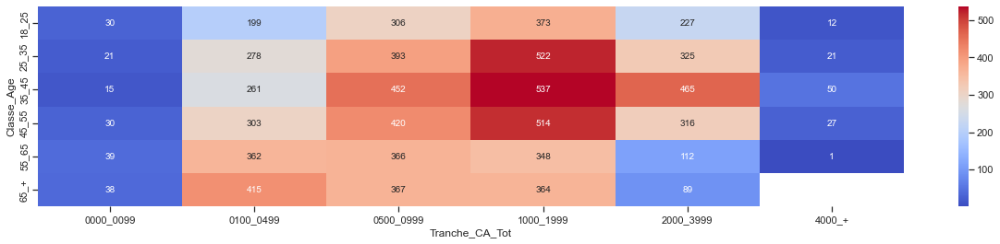

In [81]:
Polynom_analyse_CA_TotalGénéréParClient_classe_age = df_fusion.groupby(['Tranche_CA_Tot','Classe_Age']).size().unstack()
  
plt.figure(figsize=(21,4))
sns.heatmap(Polynom_analyse_CA_TotalGénéréParClient_classe_age.T,annot = True, fmt = 'g', cmap = 'coolwarm')

<AxesSubplot:xlabel='sex-Tranche_CA_Tot', ylabel='Classe_Age'>

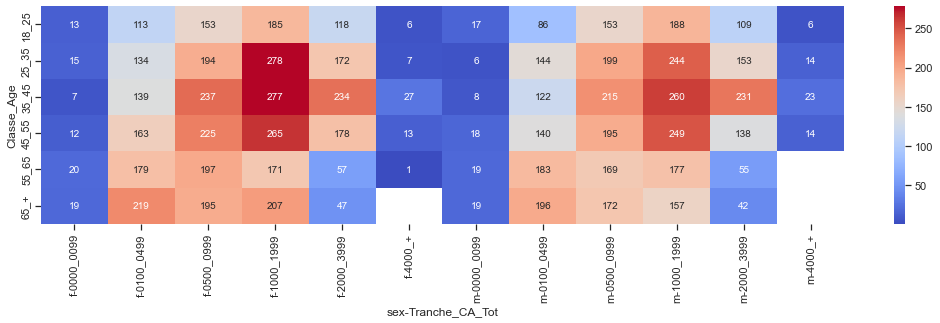

In [82]:
Polynom_analyse_CA_TotalGénéréParClient_classe_age = df_fusion.groupby(['sex','Tranche_CA_Tot','Classe_Age']).size().unstack()
  
plt.figure(figsize=(18,4))
sns.heatmap(Polynom_analyse_CA_TotalGénéréParClient_classe_age.T,annot = True, fmt = 'g', cmap = 'coolwarm')

<AxesSubplot:xlabel='Jour_Max_Achats', ylabel='Classe_Age'>

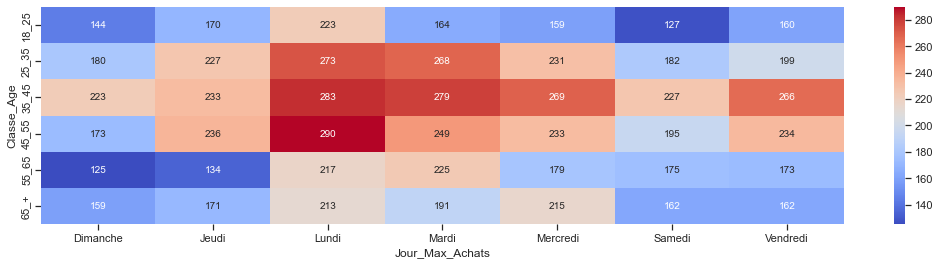

In [83]:
Polynom_analyse_CA_TotalGénéréParClient_classe_age = df_fusion.groupby(['Jour_Max_Achats','Classe_Age']).size().unstack()
  
plt.figure(figsize=(18,4))
sns.heatmap(Polynom_analyse_CA_TotalGénéréParClient_classe_age.T,annot = True, fmt = 'g', cmap = 'coolwarm')

# --- PARTIE 2 --- 

# - Demandes de 🛰 Julie 🛰 -
## Besoin de vérifier les corrélations / tests statistiques

# 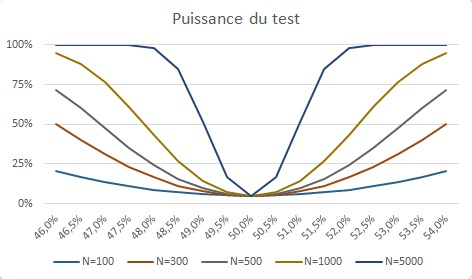
#### source : https://www.slpv-analytics.com/statpedia/tests-statistiques/

# 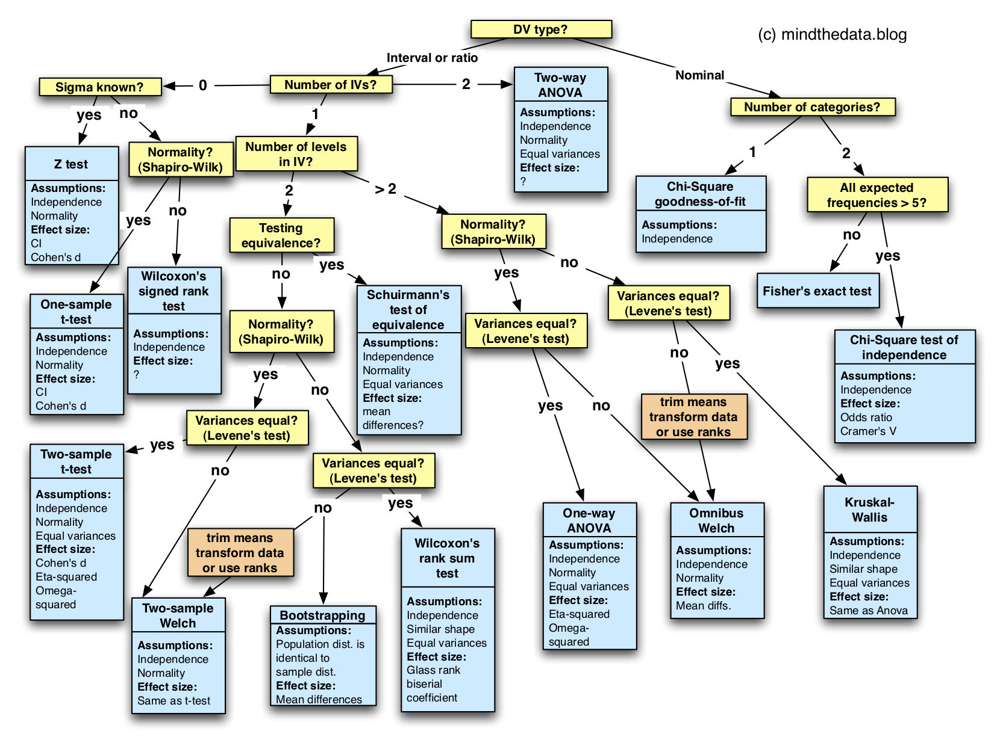

---

# 1 - Genre du client (sex) et catégorie de produits achetés (categ)

## Liens entre sexe  et catégories : quali / quali

#### H0 : variable sex et variable categ sont indépendantes
#### H1 : variable sex et variable categ sont dépendantes

---

### 1-1 - Visualisation Matrice de contingence :

<AxesSubplot:xlabel='sex', ylabel='categ'>

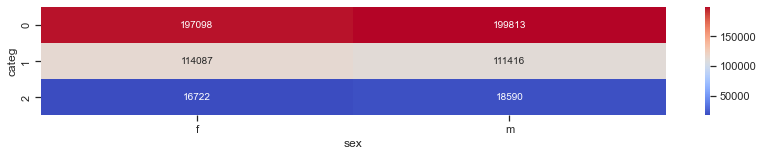

In [180]:
Polynom_analyse_sexe_categ = df_transactions_products_customers.groupby(['sex','categ']).size().unstack()

plt.figure(figsize=(14,2))
sns.heatmap(Polynom_analyse_sexe_categ.T,annot = True, fmt = 'g', cmap = 'coolwarm')

### 1-2 - Le test nécessite une matrice de contingence numérique :

In [181]:
df_transactions_products_customers.categ = df_transactions_products_customers.categ.astype(int)

cont = df_transactions_products_customers[["sex","categ"]].pivot_table(index = "sex",
                                                                       columns = "categ",
                                                                       aggfunc = len,
                                                                       #margins = True,
                                                                       #margins_name = "Total"
                                                                      )
cont

categ,0,1,2
sex,,,
f,197098,114087,16722
m,199813,111416,18590


### 1-3 - Réalisation test chi2 sur les contingences :

In [182]:
from scipy.stats import chi2_contingency

In [183]:
chi2, p, dof, ex = chi2_contingency(cont, correction=False)

In [184]:
# Test statistique
chi2

143.4684942757229

In [185]:
# P-value du test
p 

7.017982881623974e-32

In [186]:
# Fréquences, basées sur les sommes marginales des tables
ex

array([[197878.5927225 , 112423.73301496,  17604.67426253],
       [199032.4072775 , 113079.26698504,  17707.32573747]])

In [187]:
# Degrés de liberté
dof

2

#### H0 : variable sex et variable categ sont indépendantes
#### H1 : variable sex et variable categ sont dépendantes

### On rejette donc H0, l'indépendance des variables, il y a dépendance entre sex et categ.

---
---
---

# 2 - Classe_Age et CA_tot_client

## Liens entre Classe_Age et CA_tot_client : quali / quanti

### - Visualisation rapide (catégorisation en tranche du CA_total) :

<AxesSubplot:xlabel='Classe_Age', ylabel='Tranche_CA_Tot'>

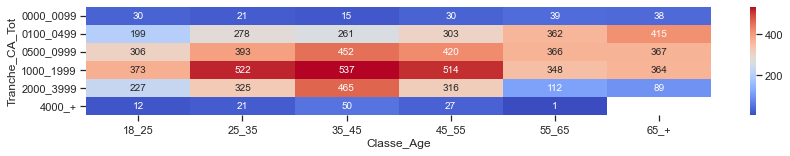

In [188]:
Polynom_analyse_sexe_categ = df_fusion.groupby(['Classe_Age','Tranche_CA_Tot']).size().unstack()

plt.figure(figsize=(14,2))
sns.heatmap(Polynom_analyse_sexe_categ.T,annot = True, fmt = 'g', cmap = 'coolwarm')

In [189]:
# --- Conditions statistiques à vérifier pour réalisation tu test paramétrique ANOVA --- 

# 1 - Les mesures sont indépendantes
# 3 - Les échantillons ont des variances égales
# 4 - Les résidus suivent une distribution normale (supposée ou vérifiée)
# 6 - Au moins 20 individus dans le dispositif, ou normalité des résidus supposée ou vérifiée

# sinon, équivalent non paramétrique --- Test Kruskal-Wallis ---

In [190]:
# Une variable de type intervalle avec une quanti, nombre de levels dans la variable intervalle > 2,

# ==> Test de normalité de Shapiro-Wilk.

In [191]:
df_fusion.groupby('Classe_Age')['CA_tot_client'].describe()

,count,mean,std,min,25%,50%,75%,max
Classe_Age,,,,,,,,
18_25,1147.0,1529.994561,8357.530393,11.20,597.0150,1078.620,1800.6600,282654.610000
25_35,1560.0,1349.480219,959.766185,11.06,612.4825,1130.005,1890.9625,5214.050000
35_45,1780.0,1695.600596,7453.286611,32.93,682.8850,1236.545,2185.7350,312755.080000
45_55,1610.0,1390.190146,2919.674084,8.30,573.8100,1086.950,1847.0100,111798.624989
55_65,1228.0,1053.240362,4304.902982,9.98,405.1250,743.285,1327.5925,149847.579978
65_+,1273.0,884.021428,628.408145,12.99,375.5800,731.200,1269.8800,3446.480000


### Suite à l'analyse de l'écart type des variances nous pouvons affirmer que les classe_age 18_25 et 35_45 ont les plus grandes variances en CA total généré par le client.
### Les classes 65_+ et 25_35 possèdent des clients aux caractéristiques plus similaire, moins d'écarts de variances.

In [192]:
from scipy import stats

# H0 = population est normalement distribuée
# H1 = population n'est pas normalement distribuée

shapiro_test = stats.shapiro(df_fusion['CA_tot_client'])
shapiro_test

ShapiroResult(statistic=0.0613633394241333, pvalue=0.0)

### H0 = population est normalement distribuée
### H1 = population n'est pas normalement distribuée

#### P < 0.05, Rejet de H0 la poupulation n'est pas normalement distribuée

## Au niveau de test 5% on rejette l'hypothèse de la normalité de la distribution.

## Continuons donc avec l'égalité des variances : - Test de Levene -

In [193]:
from scipy.stats import levene

In [194]:
# Mise en forme des données aux formats exploités en marketing :
a = df_fusion.loc[df_fusion['Classe_Age'] == "18_25",['CA_tot_client']].CA_tot_client.to_numpy().astype(int)
b = df_fusion.loc[df_fusion['Classe_Age'] == "25_35",['CA_tot_client']].CA_tot_client.to_numpy().astype(int)
c = df_fusion.loc[df_fusion['Classe_Age'] == "35_45",['CA_tot_client']].CA_tot_client.to_numpy().astype(int)
d = df_fusion.loc[df_fusion['Classe_Age'] == "45_55",['CA_tot_client']].CA_tot_client.to_numpy().astype(int)
e = df_fusion.loc[df_fusion['Classe_Age'] == "55_65",['CA_tot_client']].CA_tot_client.to_numpy().astype(int)
f = df_fusion.loc[df_fusion['Classe_Age'] == "65_+",['CA_tot_client']].CA_tot_client.to_numpy().astype(int)

In [195]:
# Inspectons maintenant les relations inter-variables de nos classe d'age :

In [196]:
stat, p = levene(a,b) # 18_25 & 25_35
p

0.34388847792228294

In [197]:
stat, p = levene(a,c) # 18_25 & 35_45
p

0.828050229746574

In [198]:
stat, p = levene(a,d) # 18_25 & 45_55
p

0.5342219823557453

In [199]:
stat, p = levene(a,e) # 18_25 & 55_65
p

0.27023682240402486

In [200]:
stat, p = levene(a,f) # 18_25 & 65_+
p

0.05470300646157205

In [105]:
stat, p = levene(b,c) # 25_35 & 35_45
p

0.1601619271707268

In [106]:
stat, p = levene(b,d) # 25_35 & 45_55
p

0.4026540441868426

In [107]:
stat, p = levene(b,e) # 25_35 & 55_65
p

0.3800199891212176

In [130]:
stat, p = levene(b,f) # 25_35 & 65_+
p

1.8046323900820144e-32

In [131]:
stat, p = levene(c,d) # 35_45 & 45_55
p

0.3013257232734035

In [132]:
stat, p = levene(c,e) # 35_45 & 55_65
p

0.12400407401956151

In [133]:
stat, p = levene(c,f) # 35_45 & 65_+
p

0.013613007123143239

In [134]:
stat, p = levene(d,e) # 45_55 & 55_65
p

0.23792783775755696

In [135]:
stat, p = levene(d,f) # 45_55 & 65_+
p

0.00010468907854022368

In [136]:
stat, p = levene(e,f) # 55_65 & 65_+
p

0.20500460676586446

In [139]:
stat, p = levene(a,b,c,d,e,f) # 25_35, 35_45, 45_55, 55_65, et 65_+
p

0.07180513253968981

#### H0 : Les variables ont des variances égales
#### H1 : Les variables n'ont pas des variances égales

## Les petites valeurs de p suggèrent que les populations n'ont pas des variances égales.

### On rejette l'hypothèse des variances égales sur les classes :
#### 25_35 & 65_+
#### 35_45 & 65_+
#### 45_55 & 65_+

### Les autres paires de Classe_Age ont des variances égales à un niveau de 5%.

### La classe d'age 65_+ s'apparente avec la classe 55_65 mais pas avec les autres en égalité des variances.

## - Explorons maintenant les variables intéressantes avec le test de Kruskal-Wallis -

In [140]:
### H0 : La médiane de la population de tous les groupes est égale
### H1 : La médiane de la population de tous les groupes n'est pas égale

### Échantillon :

# 18_25 & 25_35
# 18_25 & 35_45
# 18_25 & 45_55
# 18_25 & 55_65
# 18_25 & 65_+
# 25_35 & 35_45
# 25_35 & 45_55
# 25_35 & 55_65
# 35_45 & 45_55
# 35_45 & 55_65
# 45_55 & 55_65
# 55_65 & 65_+

In [201]:
stats.kruskal(a, b) # 18_25 & 25_35
# L'hypothèse nulle n'est pas rejetée au seuil de signification de 5 %, car la valeur de p renvoyée est supérieure
# à la valeur critique de 5 %.

KruskalResult(statistic=1.8251749349952768, pvalue=0.17669852284349244)

In [202]:
stats.kruskal(a, c) # 18_25 & 35_45
# L'hypothèse nulle est rejetée au seuil de signification de 5 %, car la valeur de p renvoyée est inférieure à la valeur
# critique de 5 %.

KruskalResult(statistic=28.037826300978473, pvalue=1.1896714005669132e-07)

In [203]:
stats.kruskal(a, d) # 18_25 & 45_55
# L'hypothèse nulle n'est pas rejetée au seuil de signification de 5 %, car la valeur de p renvoyée est supérieure
# à la valeur critique de 5 %.

KruskalResult(statistic=0.11444615011827347, pvalue=0.7351379477030136)

In [204]:
stats.kruskal(a, e) # 18_25 & 55_65
# L'hypothèse nulle est rejetée au seuil de signification de 5 %, car la valeur de p renvoyée est inférieure à la valeur
# critique de 5 %.

KruskalResult(statistic=94.35583570444525, pvalue=2.6360859943347246e-22)

In [205]:
stats.kruskal(a, f) # 18_25 & 65_+
# L'hypothèse nulle est rejetée au seuil de signification de 5 %, car la valeur de p renvoyée est inférieure à la valeur
# critique de 5 %.

KruskalResult(statistic=121.63461988541053, pvalue=2.7751690014416998e-28)

In [206]:
stats.kruskal(b, c) # 25_35 & 35_45
# L'hypothèse nulle est rejetée au seuil de signification de 5 %, car la valeur de p renvoyée est inférieure à la valeur
# critique de 5 %.

KruskalResult(statistic=18.389721859780938, pvalue=1.8002644580470408e-05)

In [147]:
stats.kruskal(b, d) # 25_35 & 45_55
# L'hypothèse nulle n'est pas rejetée au seuil de signification de 5 %, car la valeur de p renvoyée est supérieure
# à la valeur critique de 5 %.

KruskalResult(statistic=1.1267777214343404, pvalue=0.28846370180265735)

In [148]:
stats.kruskal(b, e) # 25_35 & 55_65
# L'hypothèse nulle est rejetée au seuil de signification de 5 %, car la valeur de p renvoyée est inférieure à la valeur
# critique de 5 %.

KruskalResult(statistic=136.97028945915764, pvalue=1.2240286863274243e-31)

In [149]:
stats.kruskal(c, d) # 35_45 & 45_55
# L'hypothèse nulle est rejetée au seuil de signification de 5 %, car la valeur de p renvoyée est inférieure à la valeur
# critique de 5 %.

KruskalResult(statistic=28.832540563272982, pvalue=7.891406219776434e-08)

In [150]:
stats.kruskal(c, e) # 35_45 & 55_65
# L'hypothèse nulle est rejetée au seuil de signification de 5 %, car la valeur de p renvoyée est inférieure à la valeur
# critique de 5 %.

KruskalResult(statistic=248.56277698915395, pvalue=5.342823167637361e-56)

In [151]:
stats.kruskal(d, e) # 45_55 & 55_65
# L'hypothèse nulle est rejetée au seuil de signification de 5 %, car la valeur de p renvoyée est inférieure à la valeur
# critique de 5 %.

KruskalResult(statistic=115.3191657510183, pvalue=6.699817513490683e-27)

In [152]:
stats.kruskal(e, f) # 55_65 & 65_+
# L'hypothèse nulle n'est pas rejetée au seuil de signification de 5 %, car la valeur de p renvoyée est supérieure
# à la valeur critique de 5 %.

KruskalResult(statistic=1.508195880026743, pvalue=0.21941458558827542)

### H0 : La médiane de la population de tous les groupes est égale  :

#### 18_25 & 25_35
#### 18_25 & 45_55
#### 25_35 & 45_55
#### 55_65 & 65_+

### H1 : La médiane de la population de tous les groupes n'est pas égale :

#### 18_25 & 35_45
#### 18_25 & 55_65
#### 18_25 & 65_+
#### 25_35 & 35_45
#### 25_35 & 55_65
#### 35_45 & 45_55
#### 35_45 & 55_65
#### 45_55 & 55_65

---
---

### =================== Poursuivons avec le panier moyen =====================>

---
---
---

# 3 - Classe_Age et panier_moyen

## Liens entre Classe_Age et panier_moyen : quali / quanti

In [153]:
df_fusion.columns

Index(['client_id', 'sex', 'categ_max_achat', 'age_moyen', 'Classe_Age',
       'Jour_Max_Achats', 'nbr_achats', 'CA_tot_client', 'Ancienneté',
       'fréq_achat', 'panier_moyen', 'rank', 'Tranche_CA_Tot'],
      dtype='object')

### Visualisation rapide des paniers moyens :

<AxesSubplot:>

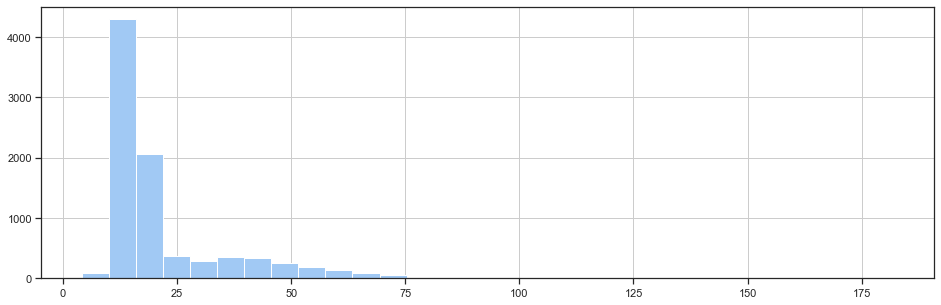

In [154]:
n_bins = 30

plt.figure(figsize = (16,5))
# We can set the number of bins with the *bins* keyword argument.

df_fusion.panier_moyen.hist(bins=n_bins)

In [155]:
from scipy import stats

# H0 = population est normalement distribuée
# H1 = population n'est pas normalement distribuée

shapiro_test = stats.shapiro(df_fusion['panier_moyen'])
shapiro_test

ShapiroResult(statistic=0.6841461062431335, pvalue=0.0)

In [156]:
# H0 = population est normalement distribuée
# H1 = population n'est pas normalement distribuée

# Rejet de H0 la poupulation n'est pas normalement distribuée

### Nous devons donc maintenant réaliser un test d'égalité des variances de Levene :

In [157]:
from scipy.stats import levene

In [158]:
# Mise en forme des données aux formats exploités en marketing :
a = df_fusion.loc[df_fusion['Classe_Age'] == "18_25",['panier_moyen']].panier_moyen.to_numpy().astype(int)
b = df_fusion.loc[df_fusion['Classe_Age'] == "25_35",['panier_moyen']].panier_moyen.to_numpy().astype(int)
c = df_fusion.loc[df_fusion['Classe_Age'] == "35_45",['panier_moyen']].panier_moyen.to_numpy().astype(int)
d = df_fusion.loc[df_fusion['Classe_Age'] == "45_55",['panier_moyen']].panier_moyen.to_numpy().astype(int)
e = df_fusion.loc[df_fusion['Classe_Age'] == "55_65",['panier_moyen']].panier_moyen.to_numpy().astype(int)
f = df_fusion.loc[df_fusion['Classe_Age'] == "65_+",['panier_moyen']].panier_moyen.to_numpy().astype(int)

In [159]:
# Inspectons maintenant les relations inter-variables de nos classe d'age :

In [160]:
stat, p = levene(a,b)
p

2.640837776706455e-09

In [161]:
stat, p = levene(a,c)
p

2.0450160649162576e-279

In [162]:
stat, p = levene(a,d)
p

1.820177638722211e-228

In [163]:
stat, p = levene(a,e)
p

1.074449009802653e-177

In [164]:
stat, p = levene(a,f)
p

4.0056365065825666e-178

In [165]:
stat, p = levene(b,c)
p

0.0

In [166]:
stat, p = levene(b,d)
p

0.0

In [167]:
stat, p = levene(b,e)
p

1.0609721293213216e-296

In [168]:
stat, p = levene(b,f)
p

4.119659225969147e-299

In [169]:
stat, p = levene(c,d)
p

2.147837019950272e-30

In [170]:
stat, p = levene(c,e)
p

1.3530338419239626e-26

In [171]:
stat, p = levene(c,f)
p

4.603013786217665e-31

In [172]:
stat, p = levene(d,e) # 45_55 & 55_65
p

0.7119502043698098

In [173]:
stat, p = levene(d,f) # 45_55 & 65_+ ====> Bascule
p

0.05308055387821574

In [210]:
stat, p = levene(e,f) # 55_65 & 65_+
p

0.20500460676586446

In [212]:
stat, p = levene(a,b,c,d,e,f)
p

0.07180513253968981

### Suite à de multiples tests rapides d'égalité des variances intra-catégoriques, nous pouvons dénoter que :
#### 📈📌 Les classe_age 45_55 et 55_65 ans sont les plus corrélées en égalité des variances.
#### 📈📌 Les classe_age 55_65 et 65_+ ans possédent la seconde plus forte corrélation en égalité des variances.
#### 📈📌 Les classes 45_55, 55_65, 65_+ disposent ont aussi d'une variance égale au niveau de test de 5% mais moins soulignée.

#### H0 : Les variables ont des variances égales
#### H1 : Les variables n'ont pas des variances égales

## Les petites valeurs de p suggèrent que les populations n'ont pas des variances égales sauf  pour les tranches :

#### 45_55 et 55_65
#### 45_55 & 65_+
#### 55_65 & 65_+

## Égalité des variances à un niveau de test de 5% lorsque nous prenons tous les classe_age en simultannée.

---

## - Explorons maintenant les variables intéressantes avec le test de Kruskal-Wallis -

### H0 : La médiane de la population de tous les groupes est égale
### H1 : La médiane de la population de tous les groupes n'est pas égale

### Échantillon : classe_age = 44_55, 55_65, 65_+

In [213]:
stats.kruskal(d, e)
# L'hypothèse nulle est rejetée au seuil de signification de 5 %, car la valeur de p renvoyée est inférieure à la valeur
# critique de 5 %.

KruskalResult(statistic=115.3191657510183, pvalue=6.699817513490683e-27)

In [214]:
stats.kruskal(d, f)
# L'hypothèse nulle est rejetée au seuil de signification de 5 %, car la valeur de p renvoyée est inférieure à la valeur
# critique de 5 %.

KruskalResult(statistic=147.91650115704857, pvalue=4.947474869742173e-34)

In [215]:
stats.kruskal(e, f)
# L'hypothèse nulle n'est pas rejetée au seuil de signification de 5 %, car la valeur de p renvoyée est supérieure à la valeur
# critique de 5 %.

KruskalResult(statistic=1.508195880026743, pvalue=0.21941458558827542)

### 📈📌 Au niveau de test 5% nous pouvons affirmer que les médianes des groupes 55_65 et 65_+ sont égales sur les paniers_moyens car nous ne pouvons pas rejetter H0.

In [216]:
# => 📈📌 Un regroupement stratégique marketing pourra être étudié.

---
---
---

# 4 - Analyse fréq_achat et panier_moyen
## Liens entre fréq_achat et panier_moyen - Analyse bivariée - quanti / quanti

In [217]:
finaldf.columns

Index(['client_id', 'nbr_achats', 'CA_tot_client', 'Ancienneté', 'fréq_achat',
       'panier_moyen', 'rank', 'Tranche_CA_Tot'],
      dtype='object')

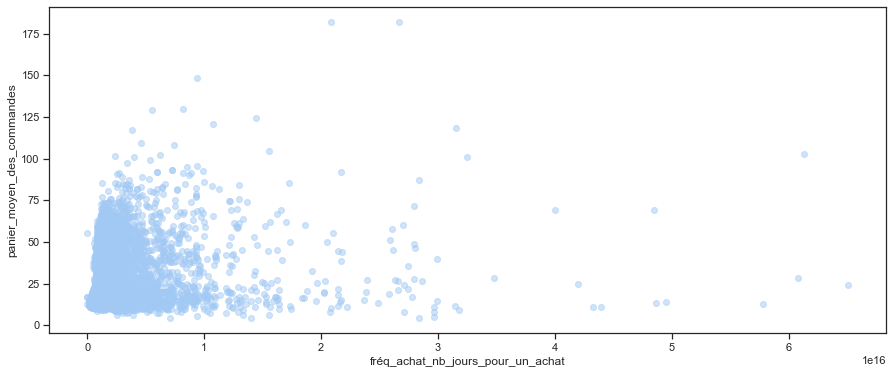

In [218]:
plt.figure(figsize=(15,6))
panier_moyen = finaldf['panier_moyen']
plt.plot(-finaldf["fréq_achat"],finaldf['panier_moyen'],'o',alpha=0.5)
plt.xlabel("fréq_achat_nb_jours_pour_un_achat")
plt.ylabel("panier_moyen_des_commandes")
plt.show()

### Extraction des grossistes, cadences de commandes hors normes, doivent être traités à part :

In [219]:
finaldf["CA_tot_client"].max() # 324 033 dollars de commande pour notre 1er plus gros client

312755.08

In [220]:
finaldf = finaldf.loc[finaldf["CA_tot_client"] != finaldf["CA_tot_client"].max(),:]

In [221]:
finaldf["CA_tot_client"].max() # 289 760 dollars de commande pour notre 2ème plus gros client

282654.61

In [222]:
finaldf = finaldf.loc[finaldf["CA_tot_client"] != finaldf["CA_tot_client"].max(),:]

In [223]:
finaldf["CA_tot_client"].max() # 153 662 dollars de commande pour notre 3ème plus gros client

149847.5799781699

In [224]:
finaldf = finaldf.loc[finaldf["CA_tot_client"] != finaldf["CA_tot_client"].max(),:]

In [225]:
finaldf["CA_tot_client"].max() # 113 669 dollars de commande pour notre 4ème plus gros client

111798.62498908494

In [226]:
finaldf = finaldf.loc[finaldf["CA_tot_client"] != finaldf["CA_tot_client"].max(),:]

In [227]:
finaldf["CA_tot_client"].max() # 5 276 dollars pour le 5ème,
# Nous le garderons ainsi que tout le reste de notre clientèle publique pour le reste de cette analyse.

5214.05

## Nous conservons les clients particuliers pour étudier la plus forte volumétrie de commandes sans perdre en visibilité à cause des pros.

## Analyse fréquence et panier moyen :

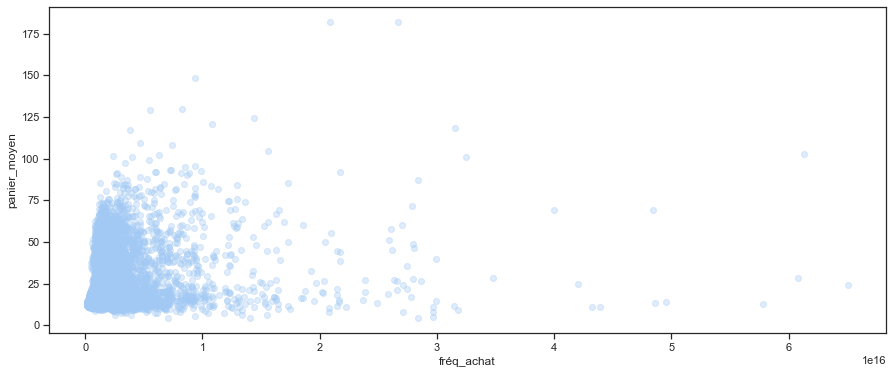

In [228]:
plt.figure(figsize=(15,6))

panier_moyen = finaldf['panier_moyen']
plt.plot(-finaldf["fréq_achat"],finaldf['panier_moyen'],'o',alpha=0.35)
plt.xlabel("fréq_achat")
plt.ylabel("panier_moyen")
plt.show()

In [229]:
finaldf["fréq_achat"] = finaldf["fréq_achat"].dt.days
finaldf["fréq_achat"] = finaldf["fréq_achat"].astype(float)

In [230]:
# Fréquence d'achat = solde avant opération
# panier_moyen_des_commandes = montant

# plt.figure(figsize=(19,9))

taille_classe = 20 # taille des classes pour la discrétisation

groupes = [] # va recevoir les données agrégées à afficher

# on calcule des tranches allant de 0 au solde maximum par paliers de taille taille_classe
tranches = np.arange(0, max(-finaldf["fréq_achat"]-400), taille_classe)

In [231]:
tranches

array([  0.,  20.,  40.,  60.,  80., 100., 120., 140., 160., 180., 200.,
       220., 240., 260., 280., 300., 320., 340.])

In [232]:
tranches += taille_classe/2 # on décale les tranches d'une demi taille de classe

In [233]:
tranches

array([ 10.,  30.,  50.,  70.,  90., 110., 130., 150., 170., 190., 210.,
       230., 250., 270., 290., 310., 330., 350.])

In [234]:
finaldf["fréq_achat"] = -finaldf["fréq_achat"]
finaldf["fréq_achat"]

0       18.0
1       13.0
2       89.0
3        7.0
4        8.0
        ... 
8593    52.0
8594     9.0
8595    13.0
8596    15.0
8597    15.0
Name: fréq_achat, Length: 8594, dtype: float64

In [235]:
indices = np.digitize(finaldf["fréq_achat"], tranches) # associe chaque solde à son numéro de classe

In [236]:
indices

array([1, 1, 4, ..., 1, 1, 1], dtype=int64)

In [237]:
for ind, tr in enumerate(tranches): # pour chaque tranche, ind reçoit le numéro de tranche et tr la tranche en question
    montants = finaldf.loc[indices==ind,"panier_moyen"] # sélection des individus de la tranche ind
    if len(montants) > 0:
        g = {
            'valeurs': montants,
            'centre_classe': tr-(taille_classe/2),
            'taille': len(montants),
            'quartiles': [np.percentile(montants,p) for p in [25,50,75]]
        }
        groupes.append(g)

In [238]:
groupes

[{'valeurs': 3       18.114098
  4       17.917500
  6       11.747423
  9       13.470427
  17      14.959885
            ...    
  8580    14.037778
  8585    16.114124
  8586    14.982967
  8588    12.447978
  8594    17.144574
  Name: panier_moyen, Length: 2514, dtype: float64,
  'centre_classe': 0.0,
  'taille': 2514,
  'quartiles': [12.748896147206528, 13.675779558404559, 15.6415625]},
 {'valeurs': 0       14.478684
  1       23.337931
  5       11.247931
  7       15.674839
  8       14.275517
            ...    
  8589    13.202545
  8592    34.581071
  8595    24.690000
  8596    52.450566
  8597    15.487045
  Name: panier_moyen, Length: 4071, dtype: float64,
  'centre_classe': 20.0,
  'taille': 4071,
  'quartiles': [14.125374487004104, 16.70793103448276, 26.158579022694745]},
 {'valeurs': 10      18.787273
  12      25.691000
  13      21.706667
  16      13.962800
  24      15.100476
            ...    
  8572    15.768333
  8573     9.939444
  8584    19.150000
  8590    1

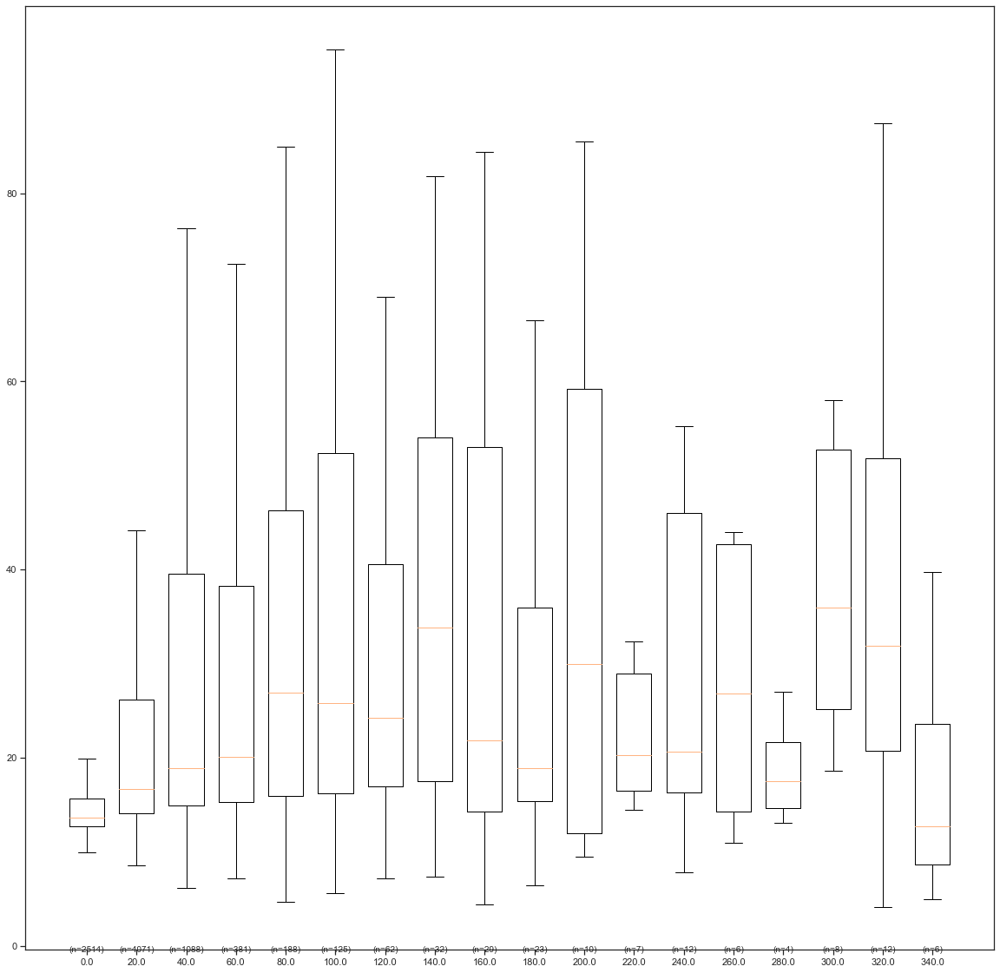

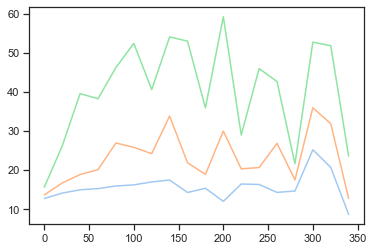

In [239]:
plt.figure(figsize=(20,20))
# affichage des boxplots
plt.boxplot([g["valeurs"] for g in groupes],
            positions= [g["centre_classe"] for g in groupes], # abscisses des boxplots
            showfliers= False, # on ne prend pas en compte les outliers
            widths= taille_classe*0.7, # largeur graphique des boxplots
            )

# affichage des effectifs de chaque classe
for g in groupes:
    plt.text(g["centre_classe"],0,"(n={})".format(g["taille"]),horizontalalignment='center',verticalalignment='top')     
plt.show()

# affichage des quartiles
for n_quartile in range(3):
    plt.plot([g["centre_classe"] for g in groupes],
             [g["quartiles"][n_quartile] for g in groupes])
plt.show()

## Résultat de l'analyse bivariée entre fréquence d'achat et panier moyen :

### Pics de concentration volumétrique sur les ségmentations 0-20, 20-40 et 40-60 avec des nbres de ventes (n) très élevés, 📈📌 beaucoup de clients avec des rythmes d'achat rapide (entre 0 et 40 jours).

### 📈📌 Les formules d'abonnement via la mensualisation peuvent intéressées plus d'un client. Si elles sont déjà actives développer de nouveaux/meilleurs services il faudrait savoir qu'est ce que les clients veulent acheter ou pourraient acheter si ils le trouvaient quelque part.

### 📈📌 Nous pouvons aussi remarquer que de manière générale quand la fréquence d'achat ralentie le panier moyen augmente, nous pourrions tenter de diriger ces clients vers la mensualisation ou l'abonnement voir de comprendre les pourquoi? et pour quoi? de ces gammes de clients afin de leurs proposer les services qu'ils veulent ou recherchent...

---
---
---

## Réalisons maintenant un test de Pearson :
## Chaque variable suit une distribution normale?

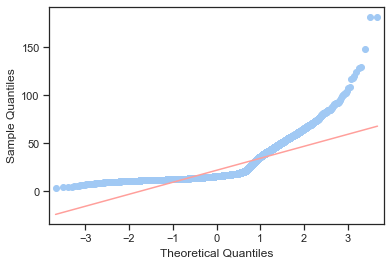

In [240]:
import statsmodels.api as smi
import pylab

smi.qqplot(df_fusion.panier_moyen, line = "r")
pylab.show()

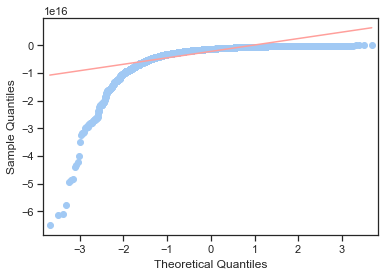

In [241]:
smi.qqplot(df_fusion.fréq_achat, line = "r")
pylab.show()

### Nos qqplot nous indiquent clairement que les variables ne suivent pas une distribution normale.
---
---
## Direction le test non-paramétrique de Spearman :

In [242]:
stats.spearmanr(finaldf["fréq_achat"],finaldf["panier_moyen"])

SpearmanrResult(correlation=0.42403587431957596, pvalue=0.0)

### H0 : Les deux ensembles de données ne sont pas corrélés.
### H1 : Les deux ensembles de données sont corrélés.
    
## Avec une P-value à 0 nous rejettons l'idée que les variables fréq_achat et panier_moyen ne soient pas corrélées.

---
---

## Poursuivons avec un Test de Covariance :

In [243]:
np.cov(finaldf["fréq_achat"],finaldf["panier_moyen"],ddof=0)[1,0]

157.0752656928679

### Le coefficient de covariation est positif : 157.07
## Nous pouvons donc bien affirmer que les deux variables tendent à augmenter ou à diminuer ensemble.

---
---
---

## 4 - Liens entre classe_age & categ_max_achat : quanti / quali

<AxesSubplot:xlabel='Classe_Age', ylabel='categ_max_achat'>

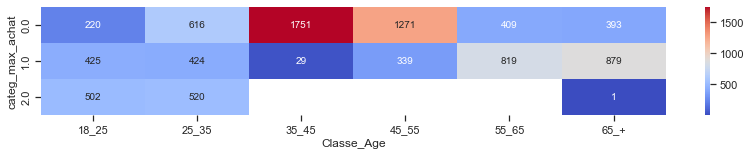

In [244]:
Polynom_analyse_sexe_categ = df_fusion.groupby(['Classe_Age','categ_max_achat']).size().unstack()

plt.figure(figsize=(14,2))
sns.heatmap(Polynom_analyse_sexe_categ.T,annot = True, fmt = 'g', cmap = 'coolwarm')

#### La variable categ_max_achat est la catégorie d'achat la plus achetée par les clients, elle nous permet de préciser la clientèle la plus attitrée de chaque catégorie, nos éclaireurs de marché, pour comprendre ce qui les intéressent et pour guider l'évolution des produits de chaque catégorie grâce à ces "fans". 

## On distingue clairement que :
### la categ 0 est tractée par les 25_45.
### La categ 1 est tractée principalement par les 55_65+, les 18_35 accrochent quand même bien à certains produits.
### La categ 2 est tractée par les 18_35.

---

## 4 - 1 Le test nécessite une matrice de contingence numérique :

In [245]:
df_fusion.categ_max_achat = df_fusion.categ_max_achat.astype(int)

cont = df_fusion[["Classe_Age","categ_max_achat"]].pivot_table(index = "Classe_Age",
                                                                       columns = "categ_max_achat",
                                                                       aggfunc = len,
                                                                       #margins = True,
                                                                       #margins_name = "Total"
                                                                      )

cont = cont.fillna(0)

cont

categ_max_achat,0,1,2
Classe_Age,,,
18_25,220.0,425.0,502.0
25_35,616.0,424.0,520.0
35_45,1751.0,29.0,0.0
45_55,1271.0,339.0,0.0
55_65,409.0,819.0,0.0
65_+,393.0,879.0,1.0


### 4 - 2 - Réalisation test chi2 sur les contingences :

In [246]:
from scipy.stats import chi2_contingency

chi2, p, dof, ex = chi2_contingency(cont, correction=False)

In [247]:
chi2

5154.288723841341

In [248]:
p

0.0

In [249]:
dof

10

In [250]:
ex

array([[621.65852524, 388.87008607, 136.4713887 ],
       [845.49895324, 528.89043964, 185.61060712],
       [964.73598511, 603.47755292, 211.78646197],
       [872.59827867, 545.84205629, 191.55966504],
       [665.55943243, 416.33170505, 146.10886253],
       [689.94882531, 431.58816004, 151.46301465]])

In [251]:
#### H0 : variable sex et variable categ sont indépendantes
#### H1 : variable sex et variable categ sont dépendantes

## p < 0.05, on rejette H0, nos variables sont dépendantes.

---
---
---

## Des librairies automatisées proposent aussi des tests statistiques automatisés :
### Afin que vous puissiez découvrir le concept voici une première librairie - PANDAS_PROFILING -

In [252]:
from pandas_profiling import ProfileReport

profile = ProfileReport(df_fusion, title="Pandas Profiling Report")

In [253]:
profile.to_widgets()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

,client_id,sex,categ_max_achat,age_moyen,Classe_Age,Jour_Max_Achats,nbr_achats,CA_tot_client,Ancienneté,fréq_achat,panier_moyen,rank,Tranche_CA_Tot
0,c_103,f,0,37.0,35_45,Mercredi,181,2118.62,-759 days +21:22:00.482557,-5 days +19:28:37.792721310,11.705083,1,2000_3999
1,c_6197,m,0,38.0,35_45,Dimanche,116,1502.04,-754 days +22:48:31.075921,-7 days +12:11:47.854102768,12.948621,1,1000_1999
2,c_682,f,0,49.0,45_55,Vendredi,301,3706.04,-744 days +01:47:00.040622,-3 days +12:41:01.196148246,12.312425,1,2000_3999
3,c_5932,f,1,61.0,55_65,Samedi,161,2709.81,-750 days +12:22:34.295702,-5 days +08:16:32.262706224,16.831118,1,2000_3999
4,c_7217,f,0,47.0,45_55,Mardi,180,2389.02,-760 days +00:31:57.655228,-5 days +18:40:10.653640156,13.272333,1,2000_3999
5,c_4027,m,0,38.0,35_45,Vendredi,186,2390.92,-760 days +15:43:31.115401,-5 days +22:01:12.102770974,12.854409,1,2000_3999
6,c_2732,f,1,59.0,55_65,Mercredi,149,2410.82,-751 days +21:45:16.655802,-6 days +23:10:46.420508739,16.180000,1,2000_3999
7,c_2507,m,0,42.0,35_45,Dimanche,231,2912.04,-733 days +02:06:23.651493,-4 days +19:51:11.790699104,12.606234,1,2000_3999
8,c_4377,m,0,48.0,45_55,Samedi,198,2452.30,-759 days +17:16:27.136210,-4 days +04:05:14.076445506,12.385354,1,2000_3999
9,c_5602,m,0,34.0,25_35,Samedi,345,4571.93,-757 days +07:25:30.865829,-3 days +19:21:38.350335737,13.251971,1,4000_+


,client_id,sex,categ_max_achat,age_moyen,Classe_Age,Jour_Max_Achats,nbr_achats,CA_tot_client,Ancienneté,fréq_achat,panier_moyen,rank,Tranche_CA_Tot
8588,c_408,f,2,24.0,18_25,Lundi,7,477.15,-675 days +07:53:23.961899,-97 days +14:50:29.137414143,68.164286,1,0100_0499
8589,c_1868,f,2,28.0,25_35,Vendredi,7,907.87,-667 days +19:11:15.223165,-96 days +19:53:02.174737858,129.695714,1,0500_0999
8590,c_1412,f,2,30.0,25_35,Mardi,2,101.98,-599 days +02:47:21.746389,-300 days +13:23:40.873194500,50.990000,1,0100_0499
8591,c_6200,m,1,66.0,65_+,Mercredi,2,53.86,-610 days +10:56:18.280023,-305 days +05:28:09.140011500,26.930000,1,0000_0099
8592,c_4648,m,1,19.0,18_25,Mardi,1,11.20,-501 days +08:49:52.430304,-501 days +08:49:52.430304,11.200000,1,0000_0099
8593,c_4478,f,0,53.0,45_55,Mercredi,1,13.36,-563 days +11:16:08.596375,-563 days +11:16:08.596375,13.360000,1,0000_0099
8594,c_4540,m,2,20.0,18_25,Lundi,2,363.98,-483 days +16:05:15.530765,-242 days +20:02:37.765382500,181.990000,1,0100_0499
8595,c_4391,f,2,22.0,18_25,Vendredi,2,363.98,-618 days +22:35:38.963669,-309 days +11:17:49.481834500,181.990000,1,0100_0499
8596,c_1232,f,0,63.0,55_65,Vendredi,2,39.70,-553 days +09:41:25.880052,-277 days +16:50:42.940026,19.850000,1,0000_0099
8597,c_7534,m,2,31.0,25_35,Lundi,2,201.98,-752 days +15:45:32.016264,-376 days +07:52:46.008132,100.990000,1,0100_0499


In [254]:
profile.to_file("Rapport_Pandas_Profiling.html")

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [255]:
profile = ProfileReport(finaldf, title="Pandas Profiling Report_1")

In [256]:
profile.to_widgets()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

,df_index,client_id,nbr_achats,CA_tot_client,Ancienneté,fréq_achat,panier_moyen,rank,Tranche_CA_Tot
0,0,c_1,38,550.19,-659 days +12:36:39.382765,18.0,14.478684,1,0500_0999
1,1,c_10,58,1353.60,-742 days +18:24:16.551727,13.0,23.337931,1,1000_1999
2,2,c_100,8,254.85,-712 days +21:00:43.133053,89.0,31.856250,1,0100_0499
3,3,c_1000,122,2209.92,-749 days +05:08:14.618755,7.0,18.114098,1,2000_3999
4,4,c_1001,96,1720.08,-755 days +04:35:15.964197,8.0,17.917500,1,1000_1999
5,5,c_1002,29,326.19,-729 days +14:07:56.033965,26.0,11.247931,1,0100_0499
6,6,c_1003,97,1139.50,-755 days +14:45:21.412403,8.0,11.747423,1,1000_1999
7,7,c_1004,62,971.84,-760 days +13:22:09.056146,13.0,15.674839,1,0500_0999
8,8,c_1005,58,827.98,-756 days +17:03:23.941625,14.0,14.275517,1,0500_0999
9,9,c_1006,281,3785.19,-753 days +10:50:13.573155,3.0,13.470427,1,2000_3999


,df_index,client_id,nbr_achats,CA_tot_client,Ancienneté,fréq_achat,panier_moyen,rank,Tranche_CA_Tot
8584,8588,c_990,277,3448.09,-752 days +05:04:48.512035,3.0,12.447978,1,2000_3999
8585,8589,c_991,55,726.14,-668 days +16:24:34.171149,13.0,13.202545,1,0500_0999
8586,8590,c_992,19,302.04,-723 days +18:01:16.349844,39.0,15.896842,1,0100_0499
8587,8591,c_993,24,443.20,-733 days +16:00:42.067595,31.0,18.466667,1,0100_0499
8588,8592,c_994,28,968.27,-707 days +18:36:31.001575,26.0,34.581071,1,0500_0999
8589,8593,c_995,14,189.41,-724 days +18:24:33.499557,52.0,13.529286,1,0100_0499
8590,8594,c_996,94,1611.59,-761 days +06:40:18.594244,9.0,17.144574,1,1000_1999
8591,8595,c_997,58,1432.02,-701 days +11:15:32.340325,13.0,24.690000,1,1000_1999
8592,8596,c_998,53,2779.88,-745 days +17:06:33.677785,15.0,52.450566,1,2000_3999
8593,8597,c_999,44,681.43,-630 days +15:33:59.414026,15.0,15.487045,1,0500_0999


In [257]:
profile = ProfileReport(finaldf, title="Pandas Profiling Report_2")

---

In [258]:
# - Analyse de l'importance des produits dans la contribution au CA -

from scipy import stats

def CreateFeatures_id_prod_affiliates(df):

    categ_affiliates = (df.groupby('id_prod', as_index = False)
          .agg({ # 'id_prod': 'nunique',
                'price': 'sum',
               })) 
    
    df = df.merge(categ_affiliates, on ="id_prod", how="inner")
    return(df)


In [259]:
df_transactions_products_customers = CreateFeatures_id_prod_affiliates(df_transactions_products_customers)

In [260]:
df_transactions_products_customers = df_transactions_products_customers.rename(columns={"price_x" : "price", "price_y": "CA_total_id_prod" })

In [261]:
df_transactions_products_customers

,id_prod,date,session_id,client_id,année,mois,jour,heure,minute,jour_semaine,price,categ,sex,birth,age,Date,rank,classe_age,CA_total_id_prod
0,0_1518,2022-05-20 13:21:29.043970,s_211425,c_103,2022.0,5.0,20.0,13.0,21.0,4.0,4.18,0,f,1986.0,37.0,2022-05-20 13:21:29.043970,120,3,2704.46
1,0_1518,2021-07-20 13:21:29.043970,s_64849,c_103,2021.0,7.0,20.0,13.0,21.0,1.0,4.18,0,f,1986.0,37.0,2021-07-20 13:21:29.043970,37,3,2704.46
2,0_1518,2022-08-20 13:21:29.043970,s_255965,c_103,2022.0,8.0,20.0,13.0,21.0,5.0,4.18,0,f,1986.0,37.0,2022-08-20 13:21:29.043970,147,3,2704.46
3,0_1518,2021-09-26 12:37:29.780414,s_95811,c_6197,2021.0,9.0,26.0,12.0,37.0,6.0,4.18,0,m,1985.0,38.0,2021-09-26 12:37:29.780414,33,3,2704.46
4,0_1518,2023-01-26 12:37:29.780414,s_332651,c_6197,2023.0,1.0,26.0,12.0,37.0,3.0,4.18,0,m,1985.0,38.0,2023-01-26 12:37:29.780414,109,3,2704.46
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
657721,2_93,2022-01-13 07:55:08.588434,s_149109,c_497,2022.0,1.0,13.0,7.0,55.0,3.0,78.99,2,m,1998.0,25.0,2022-01-13 07:55:08.588434,10,2,157.98
657722,2_93,2022-10-13 07:55:08.588434,s_281784,c_497,2022.0,10.0,13.0,7.0,55.0,3.0,78.99,2,m,1998.0,25.0,2022-10-13 07:55:08.588434,17,2,157.98
657723,2_98,2021-03-08 21:10:32.250919,s_3637,c_5967,2021.0,3.0,8.0,21.0,10.0,0.0,149.74,2,f,2003.0,20.0,2021-03-08 21:10:32.250919,1,1,149.74
657724,0_1735,2022-10-09 09:52:48.804343,s_279956,c_7980,2022.0,10.0,9.0,9.0,52.0,6.0,26.99,0,f,1980.0,43.0,2022-10-09 09:52:48.804343,7,3,53.98


In [262]:
df_lorenz = df_transactions_products_customers[["id_prod", "CA_total_id_prod"]]

In [263]:
df_lorenz = df_lorenz.drop_duplicates()
df_lorenz.head(49)

,id_prod,CA_total_id_prod
0,0_1518,2704.46
647,0_1418,8518.58
1641,0_2110,1562.88
1863,0_1083,8545.97
2366,1_381,28254.33
4133,1_370,20228.73
5676,0_1397,13416.05
6571,1_397,33859.17
8354,1_451,25922.65
9589,0_1081,5707.24


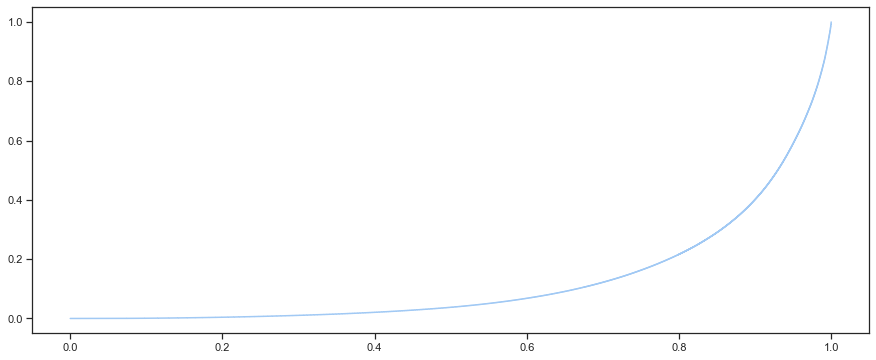

In [264]:
# Objectif : d'abord group by par produit puis sum price par produit

df_transactions_products_customers.groupby("id_prod")

plt.figure(figsize=(15,6))


lorenz = np.cumsum(np.sort(df_lorenz['CA_total_id_prod'].values)) / df_lorenz['CA_total_id_prod'].sum()
lorenz = np.append([0],lorenz) # La courbe de Lorenz commence à 0

plt.plot(np.linspace(0,1,len(lorenz)),lorenz, drawstyle='steps-post')
plt.show()

## Après un regroupement par id_produit et un cumul des sommes que chaque produit nous rapporte nous distinguons clairement unn bel effet de Pareto sur les id_produits :
### 🚀 📌📈 20% des produits nous rapportent concrètement approximativement 80% du CA...
### 🚀 📌📈 Des produits sur lesquels nous devons concentrer nos efforts !

---
---
---
---
---
---
---
---
---
# La suite restera pour le moment au stade de brouillon et sera développée en cas de besoins analytiques futurs... 🚀🎯📈
---
---
---
---
---
---
---
---
---

## La BI sera surement plus intéressante je laisse en brouillon tout ce qui est ci-dessous
---
---
---
---
---
---
---
---
---

In [85]:
# Réalisation d'une ANOVA :
# https://help.xlstat.com/fr/6443-which-statistical-test-should-you-use alternative à l'ANOVA

In [86]:
# ANOVA : Analyse de la Variance

# H0 = L'age n'a pas de lien avec le panier moyen d'achat
# H1 = Les hommes et les femmmes n'ont pas le même panier moyen.

# Déterminons si la variabilité entre les moyennes de groupe est plus grande que la variabilité
# des observations à l'intérieur des groupes

In [91]:
df_fusion = df_fusion.sort_values(by='Classe_Age')

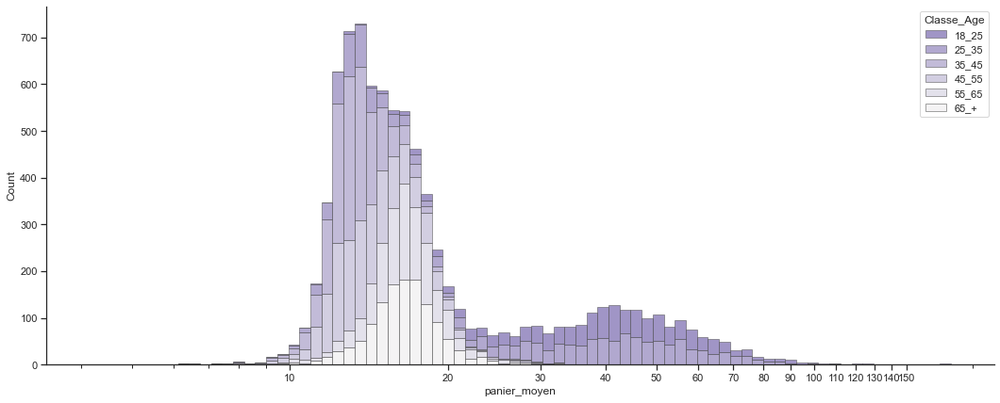

In [93]:
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt

sns.set_theme(style="ticks")

f, ax = plt.subplots(figsize=(18, 7))
sns.despine(f)

sns.histplot(
    df_fusion,
    x="panier_moyen", hue="Classe_Age",
    multiple="stack",
    palette="light:m_r",
    edgecolor=".3",
    linewidth=.5,
    log_scale=True,
)
ax.xaxis.set_major_formatter(mpl.ticker.ScalarFormatter())
ax.set_xticks([10, 20, 30, 40, 50,60,70,80,90,100,110,120,130,140,150])

In [106]:
# Condition égalité des variances :

df_fusion[['panier_moyen','Classe_Age']].groupby('Classe_Age').std()

,panier_moyen
Classe_Age,
18_25,17.650157
25_35,19.212297
35_45,1.802613
45_55,2.603934
55_65,2.919443
65_+,3.240913


In [ ]:
## On ne peut pas faire d'ANOVA, pas d'égalité des variances. Donc nous allons réaliser un test non paramétrique : le "kruskal wallis"
https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.kruskal.html
# H0 = L'age de la population est indépendant du panier moyen
# H1 = L'age de la population est dépendant du panier moyen
# Réaliser le test de kruskal avec toutes les paires de variables en dessous de 0.05 on rejette l'hypothèse d'indépendance.
# pas d'effet de l'age sur le panier moyen

#### Vérification via histogramme la répartition des paniers d'achat :

#### Après contrôle à l'histogramme des paniers d'achats on peut dire qu'ils ne suivent une distribution de loi normale.

## --- Test de Normalité ---

In [89]:
# Si volonté de consolider la première observation : test de kolmogorox smirnov

from scipy import stats

x = df_fusion.panier_moyen
stats.kstest(x, stats.norm.cdf)

# stats.kstest(df_fusion.panier_moyen)

KstestResult(statistic=0.9999833762362703, pvalue=0.0)

## Si P-value faible : Risque faible de se tromper en concluant que les données sont non-normales

In [90]:
from scipy import stats

# H0 = population est normalement distribuée
# H1 = population n'est pas normalement distribuée

shapiro_test = stats.shapiro(df_fusion.panier_moyen)
shapiro_test

ShapiroResult(statistic=0.6865142583847046, pvalue=0.0)

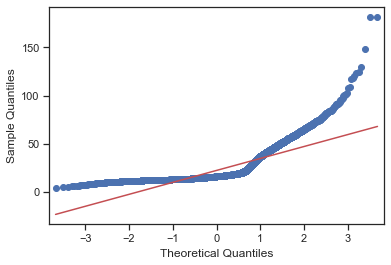

In [91]:
import statsmodels.api as smi
import pylab

smi.qqplot(df_fusion.panier_moyen, line = "r")
pylab.show()

In [92]:
# Test d'égalité des variances :

# - Test de Levene -

from scipy.stats import levene

a = df_fusion.loc[df_fusion['Classe_Age'] == "18_25",['panier_moyen']].panier_moyen.to_numpy().astype(int)
b = df_fusion.loc[df_fusion['Classe_Age'] == "25_35",['panier_moyen']].panier_moyen.to_numpy().astype(int)
c = df_fusion.loc[df_fusion['Classe_Age'] == "35_45",['panier_moyen']].panier_moyen.to_numpy().astype(int)
d = df_fusion.loc[df_fusion['Classe_Age'] == "45_55",['panier_moyen']].panier_moyen.to_numpy().astype(int)
e = df_fusion.loc[df_fusion['Classe_Age'] == "55_65",['panier_moyen']].panier_moyen.to_numpy().astype(int)
f = df_fusion.loc[df_fusion['Classe_Age'] == "65_+",['panier_moyen']].panier_moyen.to_numpy().astype(int)

stat, p = levene(a,b,c,d,e,f)
p

0.0

## The small p-value suggests that the populations do not have equal variances.

## Maintenant nous pouvons réaliser une ANOVA :

In [93]:
# Création du sous-échantillon sur lequel on va travailler

df_fusion = df_fusion.sort_values(by=["Classe_Age"])

X = "Classe_Age" # qualitative
Y = "panier_moyen" # quantitative

sous_echantillon = df_fusion

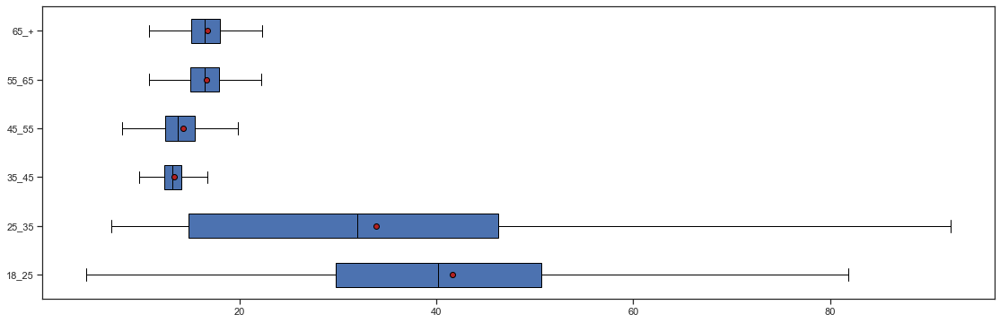

In [94]:
# Affichage du graphique

modalites = sous_echantillon[X].unique()
groupes = []
for m in modalites:
    groupes.append(sous_echantillon[sous_echantillon[X]==m][Y])

# Propriétés graphiques (pas très importantes)
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
plt.figure(figsize=(19,6))
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops,\
           vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.show()

In [95]:
# Les variables sont-elles corrélées Sexe et Price sont-elles corrélées ?

# RAPPEL => SCT = SGE + SCR
#  SCT = Variation Totale
#    SCE = Variation InterClasse
#    SCR = Variation IntraClasse

# Rapport de corrélation : η²Y/X = Vinterclasses/Vtotale
# η² signifie eta carré ou eta squared en Anglais

X = "Classe_Age" # qualitative
Y = "panier_moyen" # quantitative

sous_echantillon = df_fusion # On ne garde que les dépenses

def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                       'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT

eta_squared(sous_echantillon[X],sous_echantillon[Y])

0.49738612642548297

## 2 / - Analyses de liens -
#### Entre l'âge des clients / le montant total des achats /  la fréquence d'achat / la taille du panier moyen / les catégories de livres achetés

In [96]:
df_transactions_products_customers

,id_prod,date,session_id,client_id,année,mois,jour,heure,minute,jour_semaine,price,categ,sex,birth,age,Date,rank,classe_age
0,0_1518,2022-05-20 13:21:29.043970,s_211425,c_103,2022.0,5.0,20.0,13.0,21.0,4.0,4.18,0,f,1986.0,37.0,2022-05-20 13:21:29.043970,134,3
1,0_1518,2021-07-20 13:21:29.043970,s_64849,c_103,2021.0,7.0,20.0,13.0,21.0,1.0,4.18,0,f,1986.0,37.0,2021-07-20 13:21:29.043970,37,3
2,0_1518,2022-08-20 13:21:29.043970,s_255965,c_103,2022.0,8.0,20.0,13.0,21.0,5.0,4.18,0,f,1986.0,37.0,2022-08-20 13:21:29.043970,161,3
3,0_1418,2022-06-18 01:49:37.823274,s_225411,c_103,2022.0,6.0,18.0,1.0,49.0,5.0,8.57,0,f,1986.0,37.0,2022-06-18 01:49:37.823274,138,3
4,0_1418,2021-08-18 01:49:37.823274,s_77214,c_103,2021.0,8.0,18.0,1.0,49.0,2.0,8.57,0,f,1986.0,37.0,2021-08-18 01:49:37.823274,42,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
679327,2_147,2021-07-23 07:01:38.963669,s_65994,c_4391,2021.0,7.0,23.0,7.0,1.0,4.0,181.99,2,f,2001.0,22.0,2021-07-23 07:01:38.963669,1,1
679328,0_142,2022-03-25 18:07:25.880052,s_184472,c_1232,2022.0,3.0,25.0,18.0,7.0,4.0,19.85,0,f,1960.0,63.0,2022-03-25 18:07:25.880052,2,5
679329,0_142,2021-09-25 18:07:25.880052,s_95415,c_1232,2021.0,9.0,25.0,18.0,7.0,5.0,19.85,0,f,1960.0,63.0,2021-09-25 18:07:25.880052,1,5
679330,2_205,2021-03-11 00:11:32.016264,s_4605,c_7534,2021.0,3.0,11.0,0.0,11.0,3.0,100.99,2,m,1992.0,31.0,2021-03-11 00:11:32.016264,1,2


In [97]:
finaldf.head(1)

,client_id,nbr_achats,CA_tot_client,Ancienneté,fréq_achat,panier_moyen,rank,Tranche_CA_Tot
0,c_1,39,558.18,-659 days +12:36:39.382765,-17 days +02:47:05.625199103,14.312308,1,0500_0999


In [98]:
# --- Création Catégories avec nos variables  ---------------------------------------------------------------

# finaldf : ------------------------------- Discrétization des fréquences d'achat -------------------------------

finaldf.fréq_achat_jours = -finaldf.fréq_achat.dt.days

finaldf['fréq_achat_0_2j'] = np.where((finaldf.fréq_achat_jours > 0) & (finaldf.fréq_achat_jours < 3), 1, 0).astype(np.int8);
finaldf['fréq_achat_3_9j'] = np.where((finaldf.fréq_achat_jours >= 3) & (finaldf.fréq_achat_jours < 10), 2, 0).astype(np.int8);
finaldf['fréq_achat_10_19j'] = np.where((finaldf.fréq_achat_jours >= 10) & (finaldf.fréq_achat_jours < 19), 3, 0).astype(np.int8);
finaldf['fréq_achat_20_49j'] = np.where((finaldf.fréq_achat_jours >= 20) & (finaldf.fréq_achat_jours < 49), 4, 0).astype(np.int8);
finaldf['fréq_achat_50_365j'] = np.where((finaldf.fréq_achat_jours >= 50) & (finaldf.fréq_achat_jours < 365), 5, 0).astype(np.int8);
finaldf['fréq_achat_365_765j'] = np.where((finaldf.fréq_achat_jours >= 365), 6, 0).astype(np.int8);

finaldf['tranche_freq_achat'] = finaldf['fréq_achat_0_2j'] + finaldf['fréq_achat_3_9j'] + finaldf['fréq_achat_10_19j'] + finaldf['fréq_achat_20_49j'] + finaldf['fréq_achat_50_365j'] + finaldf['fréq_achat_365_765j'] 
finaldf = finaldf.drop(columns=['fréq_achat_0_2j','fréq_achat_3_9j','fréq_achat_10_19j','fréq_achat_20_49j','fréq_achat_50_365j','fréq_achat_365_765j'])
finaldf['tranche_freq_achat']

# finaldf : ------------------------------- Discrétization des taille de panier moyen -------------------------------

finaldf['tranche_panier_moyen_0_9'] = np.where((finaldf.panier_moyen > 0) & (finaldf.panier_moyen < 3), 1, 0).astype(np.int8);
finaldf['tranche_panier_moyen_10_19'] = np.where((finaldf.panier_moyen >= 3) & (finaldf.panier_moyen < 10), 2, 0).astype(np.int8);
finaldf['tranche_panier_moyen_20_49'] = np.where((finaldf.panier_moyen >= 10) & (finaldf.panier_moyen < 19), 3, 0).astype(np.int8);
finaldf['tranche_panier_moyen_50_99'] = np.where((finaldf.panier_moyen >= 20) & (finaldf.panier_moyen < 49), 4, 0).astype(np.int8);
finaldf['tranche_panier_moyen_100_300'] = np.where((finaldf.panier_moyen >= 50) & (finaldf.panier_moyen < 365), 5, 0).astype(np.int8);
finaldf['tranche_panier_moyen_300_et+'] = np.where((finaldf.panier_moyen >= 365), 6, 0).astype(np.int8);

finaldf['tranche_freq_achat'] = finaldf['tranche_panier_moyen_0_9'] + finaldf['tranche_panier_moyen_10_19'] + finaldf['tranche_panier_moyen_20_49'] + finaldf['tranche_panier_moyen_50_99'] + finaldf['tranche_panier_moyen_100_300'] + finaldf['tranche_panier_moyen_300_et+'] 
finaldf = finaldf.drop(columns=['tranche_panier_moyen_0_9','tranche_panier_moyen_10_19','tranche_panier_moyen_20_49','tranche_panier_moyen_50_99','tranche_panier_moyen_100_300','tranche_panier_moyen_300_et+'])
finaldf['tranche_freq_achat']

df_transactions_products_customers.jour_semaine = df_transactions_products_customers.jour_semaine.astype(str)
df_transactions_products_customers.Categ = df_transactions_products_customers.categ

## - Analyse rapide des catégories :

--------------------
0
moy:
 10.638188127612297
med:
 9.99
var:
 24.32669270515572
std:
 4.932209718286087
skw:
 0.4224785977009464
kur:
 -0.38616523247586176


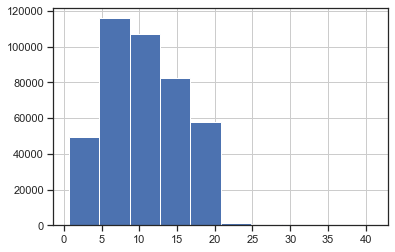

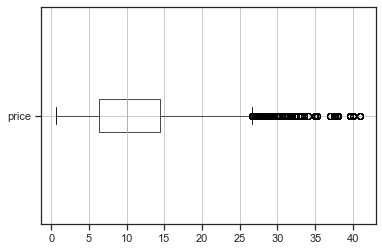

--------------------
1
moy:
 20.48572952301662
med:
 19.08
var:
 57.53035707570934
std:
 7.584876866219342
skw:
 1.7342372581162104
kur:
 8.16411560584804


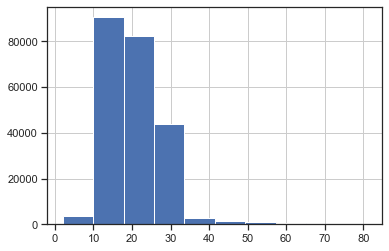

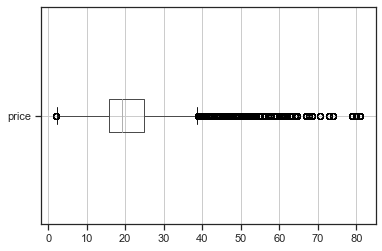

--------------------
2
moy:
 76.2074122194194
med:
 62.83
var:
 1579.9408534984684
std:
 39.74846982587466
skw:
 2.1835172974115062
kur:
 4.817061548670198


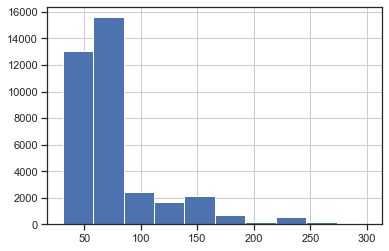

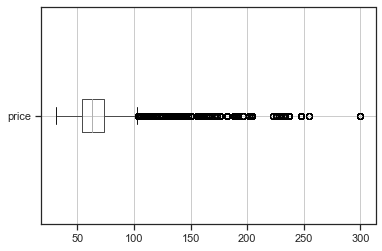

In [99]:
for cat in df_transactions_products_customers["categ"].unique():
    sous_echantillon = df_transactions_products_customers[df_transactions_products_customers.categ == cat]
    print("-"*20)
    print(cat)
    print("moy:\n",sous_echantillon['price'].mean())
    print("med:\n",sous_echantillon['price'].median())
    print("var:\n",sous_echantillon['price'].var(ddof=0))
    print("std:\n",sous_echantillon['price'].std(ddof=0))
    print("skw:\n",sous_echantillon['price'].skew())
    print("kur:\n",sous_echantillon['price'].kurtosis())
    sous_echantillon["price"].hist() # Crée l'histogramme
    plt.show() # Affiche l'histogramme
    sous_echantillon.boxplot(column="price", vert=False)
    plt.show()

#### 

#### L'analyse par catégorie nous révèle que nos différentes catégories de produits ont des paniers moyens différents.

#### Cibles principales 30-55ans
#### Concentration principale de la clientèle : Personnes en début de 40aine
#### Nous allons affiner de manière intéractive avec Power BI.

In [100]:
df_transactions_products_customers.sex.value_counts()

m    340930
f    338402
Name: sex, dtype: int64

In [101]:
#df_erp_liaison = df_erp.merge(df_liaison, left_on='product_id', right_on='product_id')

---
---
---

# -------------------------------- Partie sur les tests statistiques --------------------------------

In [102]:
# Demandes Julie : Besoin de vérifier les corrélations / tests statistiques

# 1 / - Analyses du lien entre le sexe d'un client et les catégories des livres achetés.

# 2 / - Lien entre l'âge des clients et le montant total des achats, la fréquence d'achat, la taille du panier moyen et les
#       catégories de livres achetés.

In [103]:
pip install https://github.com/ydataai/pandas-profiling/archive/master.zip

  Created wheel for pandas-profiling: filename=pandas_profiling-3.3.0-py2.py3-none-any.whl size=268032 sha256=761c401234856973afa1811357f61fa3b8407e5b2e86a742b7dd6ac9a2de573e
  Stored in directory: C:\Users\cyril\AppData\Local\Temp\pip-ephem-wheel-cache-h0mb_jtk\wheels\de\d6\dc\61cc65cce70dda40583eef25ac13cbffb18dcd67295810e1c3
Successfully built pandas-profiling
  Attempting uninstall: pandas-profiling
    Found existing installation: pandas-profiling 3.2.0
    Uninstalling pandas-profiling-3.2.0:
      Successfully uninstalled pandas-profiling-3.2.0
Note: you may need to restart the kernel to use updated packages.


In [156]:
from pandas_profiling import ProfileReport

profile = ProfileReport(df_fusion, title="Pandas Profiling Report", explorative=True)

profile.to_widgets()
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

---
---

---

In [ ]:
Âge des clients et montant total des achats.
Âge des clients et fréquence d’achat.
Âge des clients et panier moyen.
Âge des clients et catégorie de produits achetés.

In [141]:
!pip install pingouin


  Created wheel for pingouin: filename=pingouin-0.5.2-py3-none-any.whl size=196207 sha256=45141d588a851eb3374a4a8fcfb8e1ae09f9033a53b2392c15d71e5832199b82
  Stored in directory: c:\users\cyril\appdata\local\pip\cache\wheels\c0\9f\92\4c574395e1e8e5e08cf73dcb76815a7eaa62921833b6b0f6ad
  Created wheel for littleutils: filename=littleutils-0.2.2-py3-none-any.whl size=7048 sha256=6f93e2e35793268304123a989c5fcf42131e622ef3a248826eca837490ba9bcb
  Stored in directory: c:\users\cyril\appdata\local\pip\cache\wheels\04\bb\0d\2d02ec45f29c48d6192476bfb59c5a0e64b605e7212374dd15
Successfully built pingouin littleutils


In [150]:
# - Test de normalité -

from pingouin import multivariate_normality
import pandas as pd
import numpy as np
data = df_transactions_products_customers

# perform the Multivariate Normality Test

multivariate_normality(data, alpha=.05)

AssertionError: X must be of shape (n_samples, n_features).

## Test de student : (sur variable quanti : price)

In [225]:
# H0 =  Il n'y a pas de différences signifiantes dans les prix 
# H1 =  Il y a des différences signifiantes dans les prix 

In [233]:
 df_transactions_products_customers['price'].mean()

17.452555968102477

In [234]:
sys_bp=df_transactions_products_customers['price']

mu=17.45


from scipy import stats

t_value,p_value = stats.ttest_1samp(sys_bp,mu)

one_tailed_p_value = float("{:.6f}".format(p_value/2)) 
# Since alternative hypothesis is one tailed, We need to divide the p value by 2.

print('Test statistic is %f'%float("{:.6f}".format(t_value)))

print('p-value for one tailed test is %f'%one_tailed_p_value)

alpha = 0.05

if one_tailed_p_value<=alpha:

    print('Conclusion','n','Since p-value(=%f)'%one_tailed_p_value,'<','alpha(=%.2f)'%alpha,'''We reject the null hypothesis H0.So we conclude that there is no significant mean difference in price.'' 
i.e., μ = 17.45 at %.2f level of significance'''%alpha)

else:

    print('Conclusion','n','Since p-value(=%f)'%one_tailed_p_value,'>','alpha(=%.2f)'%alpha,'','We do not reject the null hypothesis H0.')

Test statistic is 0.114953
p-value for one tailed test is 0.454241
Conclusion n Since p-value(=0.454241) > alpha(=0.05)  We do not reject the null hypothesis H0.


In [240]:
# Nous ne pouvons donc pas rejeter qu'il n'y a pas de différences signifiantes dans les prix.

## Réalisation d'un test de student entre age et price :

In [235]:
# Lien vers la possibilité de faire des tests statistiques en ligne de manière gratuite,
# simple et automatisée :
# http://www.sthda.com/french/rsthda/one-sample-t-test.php

In [241]:
age = df_transactions_products_customers['age']
price = df_transactions_products_customers['price']

In [251]:
# H0 : p = p0 équiproba, pas de liens entre les variables, effets des variables non liés.
# H1 : p différent de p0 les variables ont des liens


from scipy import stats

t_value, p_value = stats.ttest_ind(age,price)

print('Test statistic is %f'%float("{:.6f}".format(t_value)))

print('p-value for two tailed test is %f'%p_value)

# niveau de test :
alpha = 0.05

if p_value <= alpha :

    print('Conclusion', 'n', 'Since p-value(=%f)'%p_value, '<','alpha(=%.2f)'%alpha,'\n','We reject the null hypothesis H0. So we conclude that the effect of age and price are not equal i.e., μ1 = μ2 at %.2f level of significance.'%alpha)

else:

    print('Conclusion', 'n', 'Since p-value(=%f)'%p_value, '>', 'alpha(=%.2f)'%alpha, ' ', 'We do not reject the null hypothesis H0.')

Test statistic is 966.246511
p-value for two tailed test is 0.000000
Conclusion n Since p-value(=0.000000) < alpha(=0.05) 
 We reject the null hypothesis H0. So we conclude that the effect of age and price are not equal i.e., μ1 = μ2 at 0.05 level of significance.


In [243]:
# On fixe le niveau de contrainte à 5% :
alpha = 0.05

In [244]:
from scipy import stats

t_value,p_value=stats.ttest_rel(age,price)

one_tailed_p_value=float("{:.6f}".format(p_value/2)) 

print('Test statistic is %f'%float("{:.6f}".format(t_value)))

print('p-value for one_tailed_test is %f'%one_tailed_p_value)

alpha = 0.05

if one_tailed_p_value<=alpha:

    print('Conclusion', 'n', 'Since p-value(=%f)'%one_tailed_p_value, '<', 'alpha(=%.2f)'%alpha, '\n','We reject the null hypothesis H0. So we conclude that age and price have a signifiant effect. i.e., d = 0 at %.2f level of significance.'%alpha)

else:
    
    print('Conclusion','n','Since p-value(=%f)'%one_tailed_p_value,'>','alpha(=%.2f)'%alpha,' ','We do not reject the null hypothesis H0. So we conclude that age and price have not a significant liaison a . i.e., d = 0 at %.2f level of significance.'%alpha)

Test statistic is 881.931099
p-value for one_tailed_test is 0.000000
Conclusion n Since p-value(=0.000000) < alpha(=0.05) 
 We reject the null hypothesis H0. So we conclude that age and price have a signifiant effect. i.e., d = 0 at 0.05 level of significance.


In [ ]:
# L'age et le prix ont des effets tous deux signifiants et ne sont pas corrélés à ce niveau
# empirique, nous verrons sous forme de visualisations exploitables les croisements statistiques
# des différentes séquences ou proportions et leurs impacts sur le reste des variables.

---

# 2/ Lien entre l'Age et la taille du panier moyen d'achat :

# Réalisation d'une ANOVA :
# https://help.xlstat.com/fr/6443-which-statistical-test-should-you-use alternative à l'ANOVA

In [142]:
#ANOVA : Analyse de la Variance

# H0 = L'age n'a pas de lien avec le panier moyen d'achat
# H1 = Les hommes et les femmmes n'ont pas le même panier moyen.

# Déterminons si la variabilité entre les moyennes de groupe est plus grande que la variabilité
# des observations à l'intérieur des groupes

In [ ]:
Âge des clients et montant total des achats.

In [150]:
finaldf.columns

Index(['client_id', 'nbr_achats', 'CA_tot_client', 'Ancienneté', 'fréq_achat',
       'panier_moyen', 'rank', 'age_moyen', 'tranche_freq_achat',
       'tranche_CA_Total_Client'],
      dtype='object')

In [ ]:
# En 1/ vérifier en plottant via histogramme les paniers d'achat :
# Si volonté de consolider la première observation.
#ou test de kolmogorox smirnov

In [166]:
# Création du sous-échantillon sur lequel on va travailler

finaldf = finaldf.sort_values(by=["age_moyen"])

X = "age_moyen" # qualitative
Y = "CA_tot_client" # quantitative

sous_echantillon = finaldf

In [174]:
finaldf.age_moyen.unique()

array([34., 35., 37., 38., 40., 41., 42., 43., 44., 45., 46., 47., 48.,
       49., 51., 52., 59., 61., 83.])

In [181]:
df_transactions_products_customers.age.unique().sort_by(by =["age"])

AttributeError: 'numpy.ndarray' object has no attribute 'sort_by'

In [167]:
# prendre la pop des hommes et la pop des femmes, récupérer l'écart type des paniers moyens.


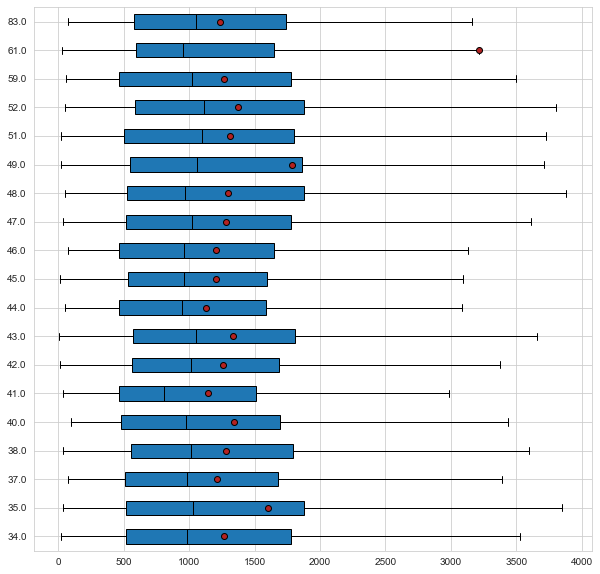

In [171]:
# Affichage du graphique

modalites = sous_echantillon[X].unique()
groupes = []
for m in modalites:
    groupes.append(sous_echantillon[sous_echantillon[X]==m][Y])

# Propriétés graphiques (pas très importantes)
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
plt.figure(figsize=(10,10))
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops,\
           vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.show()

#### Le panier moyen d'un homme ou d'une femme est très similaire, nous irons sur Power BI ensuite approfondir tout ça ensuite.

In [169]:
# Les variables sont-elles corrélées Sexe et Price sont-elles corrélées ?

# RAPPEL => SCT = SGE + SCR
#  SCT = Variation Totale
#    SCE = Variation InterClasse
#    SCR = Variation IntraClasse

# Rapport de corrélation : η²Y/X = Vinterclasses/Vtotale
# η² signifie eta carré ou eta squared en Anglais

X = "age_moyen" # qualitative
Y = "CA_tot_client" # quantitative

sous_echantillon = finaldf # On ne garde que les dépenses

def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                       'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT

eta_squared(sous_echantillon[X],sous_echantillon[Y])

0.0031761809716854264

# 

# Mesures à tendance centrale :

--------------------
0.0
moy:
 10.638188127612297
med:
 9.99
mod:
 0    4.99
Name: price, dtype: float64


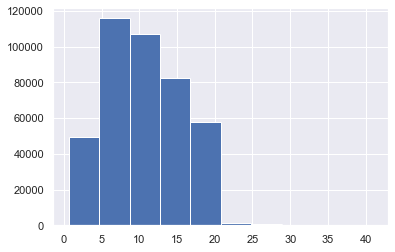

--------------------
1.0
moy:
 20.48572952301662
med:
 19.08
mod:
 0    15.99
Name: price, dtype: float64


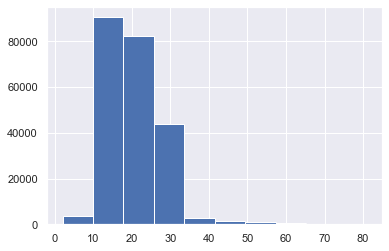

--------------------
2.0
moy:
 76.2074122194194
med:
 62.83
mod:
 0    68.99
Name: price, dtype: float64


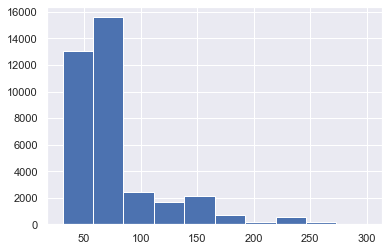

In [285]:
for cat in df_transactions_products_customers["categ"].unique():
    subset = df_transactions_products_customers[df_transactions_products_customers.categ == cat] # Création du sous-échantillon
    print("-"*20)
    print(cat)
    print("moy:\n",subset['price'].mean())
    print("med:\n",subset['price'].median())
    print("mod:\n",subset['price'].mode())
    subset["price"].hist() # Crée l'histogramme
    plt.show() # Affiche l'histogramme

# 6/ Courbe de Lorenz :

In [197]:
df_transactions_products_customers

,id_prod,date,session_id,client_id,année,mois,jour,heure,minute,jour_semaine,price,categ,sex,birth,age,Date,rank,classe_age
0,0_1518,2022-05-20 13:21:29.043970,s_211425,c_103,2022.0,5,20,13.0,21.0,4.0,4.18,0,f,1986.0,37,2022-05-20 13:21:29.043970,134,3
1,0_1518,2021-07-20 13:21:29.043970,s_64849,c_103,2021.0,7,20,13.0,21.0,1.0,4.18,0,f,1986.0,37,2021-07-20 13:21:29.043970,37,3
2,0_1518,2022-08-20 13:21:29.043970,s_255965,c_103,2022.0,8,20,13.0,21.0,5.0,4.18,0,f,1986.0,37,2022-08-20 13:21:29.043970,161,3
3,0_1418,2022-06-18 01:49:37.823274,s_225411,c_103,2022.0,6,18,1.0,49.0,5.0,8.57,0,f,1986.0,37,2022-06-18 01:49:37.823274,138,3
4,0_1418,2021-08-18 01:49:37.823274,s_77214,c_103,2021.0,8,18,1.0,49.0,2.0,8.57,0,f,1986.0,37,2021-08-18 01:49:37.823274,42,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
679327,2_147,2021-07-23 07:01:38.963669,s_65994,c_4391,2021.0,7,23,7.0,1.0,4.0,181.99,2,f,2001.0,22,2021-07-23 07:01:38.963669,1,1
679328,0_142,2022-03-25 18:07:25.880052,s_184472,c_1232,2022.0,3,25,18.0,7.0,4.0,19.85,0,f,1960.0,63,2022-03-25 18:07:25.880052,2,5
679329,0_142,2021-09-25 18:07:25.880052,s_95415,c_1232,2021.0,9,25,18.0,7.0,5.0,19.85,0,f,1960.0,63,2021-09-25 18:07:25.880052,1,5
679330,2_205,2021-03-11 00:11:32.016264,s_4605,c_7534,2021.0,3,11,0.0,11.0,3.0,100.99,2,m,1992.0,31,2021-03-11 00:11:32.016264,1,2


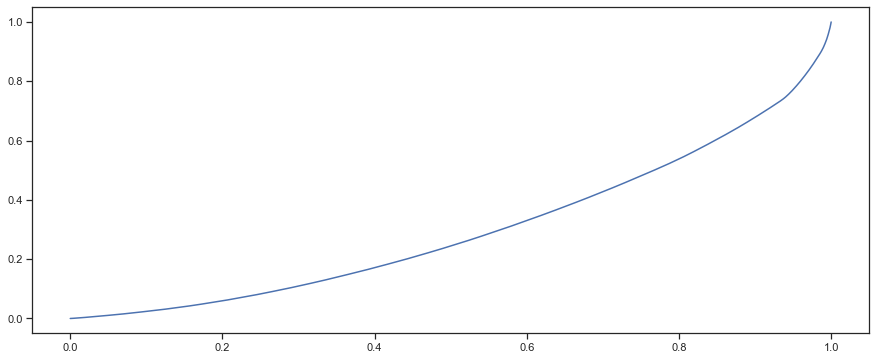

In [195]:
# Objectif : dabord group by par produit puis sum price par produit



plt.figure(figsize=(15,6))

lorenz = np.cumsum(np.sort(df_transactions_products_customers['price'].values)) / df_transactions_products_customers['price'].sum()
lorenz = np.append([0],lorenz) # La courbe de Lorenz commence à 0

plt.plot(np.linspace(0,1,len(lorenz)),lorenz, drawstyle='steps-post')
plt.show()

In [287]:
lorenz = np.nan_to_num(lorenz)

## 20% des plus grosses commandes consolident environ 47% du CA total.

In [288]:
aire_ss_courbe = lorenz[:-1].sum()/len(lorenz) # aire sous la courbe de Lorenz. La dernière valeur ne participe pas à l'aire, d'où "[:-1]"
S = 0.5 - aire_ss_courbe # aire entre la 1e bissectrice et la courbe de Lorenz
gini = 2*S
gini

0.395440978289855

## Beaucoup de petites commandes restent néanmoins importantes dans la consolidation du CA mais la répartition reste relativement homogène.

# Moyenne, médiane, modal, écart-type empirique :

--------------------
0.0
moy:
 10.638188127612297
med:
 9.99
mod:
 0    4.99
Name: price, dtype: float64
var:
 24.32669270515572
ect:
 4.932209718286087


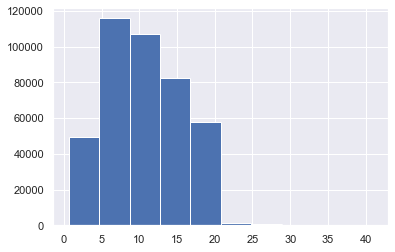

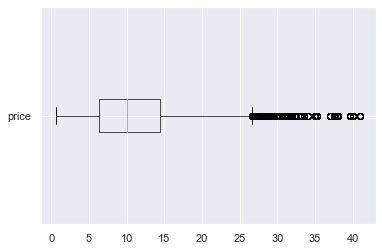

--------------------
1.0
moy:
 20.48572952301662
med:
 19.08
mod:
 0    15.99
Name: price, dtype: float64
var:
 57.53035707570934
ect:
 7.584876866219342


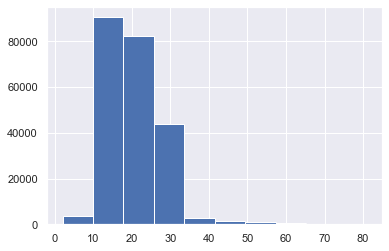

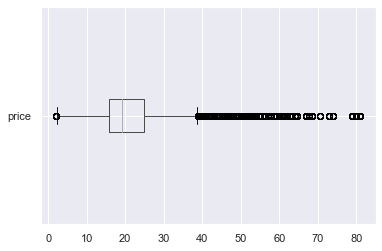

--------------------
2.0
moy:
 76.2074122194194
med:
 62.83
mod:
 0    68.99
Name: price, dtype: float64
var:
 1579.9408534984684
ect:
 39.74846982587466


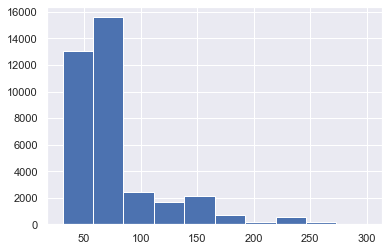

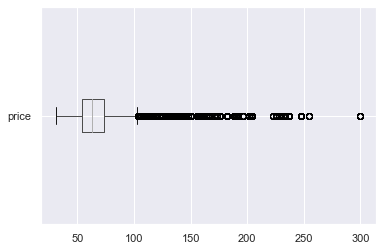

In [290]:
for cat in df_transactions_products_customers["categ"].unique():
    subset = df_transactions_products_customers[df_transactions_products_customers.categ == cat]
    print("-"*20)
    print(cat)
    print("moy:\n",subset['price'].mean())
    print("med:\n",subset['price'].median())
    print("mod:\n",subset['price'].mode())
    print("var:\n",subset['price'].var(ddof=0))
    print("ect:\n",subset['price'].std(ddof=0))
    subset["price"].hist()
    plt.show()
    subset.boxplot(column="price", vert=False)
    plt.show()

In [300]:
sous_echantillon = df_transactions_products_customers

In [301]:
X = "categ" # qualitative
Y = "price" # quantitative

# On n'étudie pas les loyers car trop gros:
sous_echantillon = sous_echantillon.loc[sous_echantillon["price"]>0,['categ','price']]

In [302]:
sous_echantillon

,categ,price
0,0.0,4.18
1,0.0,4.18
2,0.0,4.18
3,0.0,8.57
4,0.0,8.57
...,...,...
679327,2.0,181.99
679328,0.0,19.85
679329,0.0,19.85
679330,2.0,100.99


In [303]:
sous_echantillon[X].unique()

array([0., 1., 2.])

# Analyses par répartition des prix et catégorie de produit :

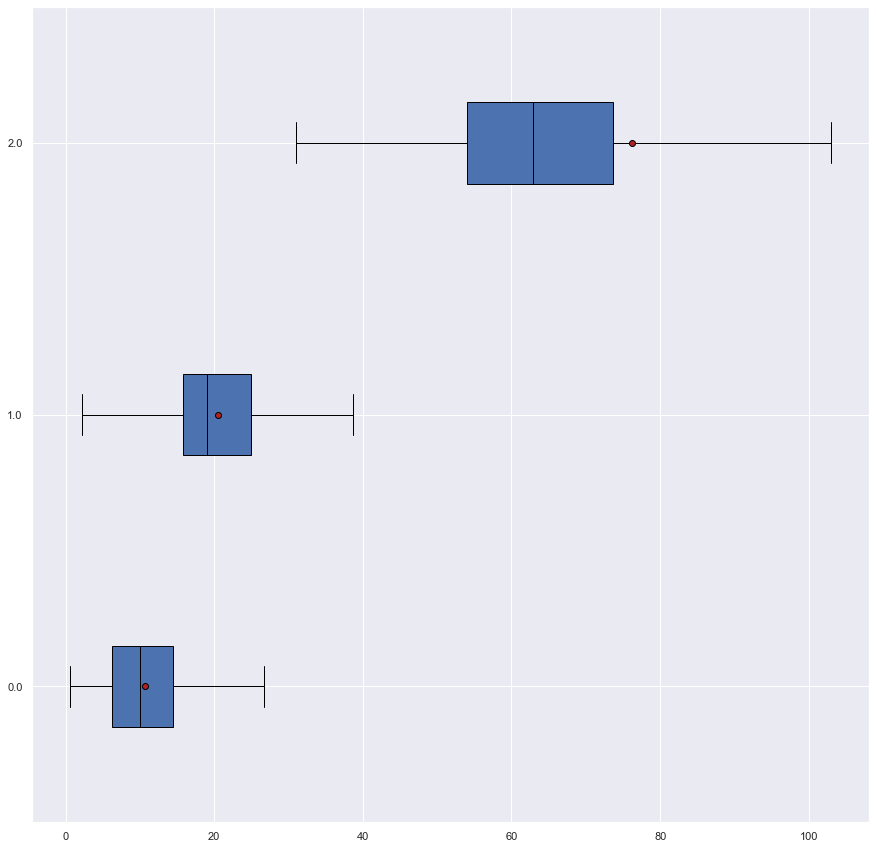

In [304]:
plt.figure(figsize=(15,15))

modalites = sous_echantillon[X].unique()
groupes = []
for m in modalites:
    groupes.append(sous_echantillon[sous_echantillon[X]==m][Y])

# Propriétés graphiques (pas très importantes)    
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, 
            vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.show()

# Forme des dispersions de prix pour chaque catégorie de produits :

C:\Users\cyril\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


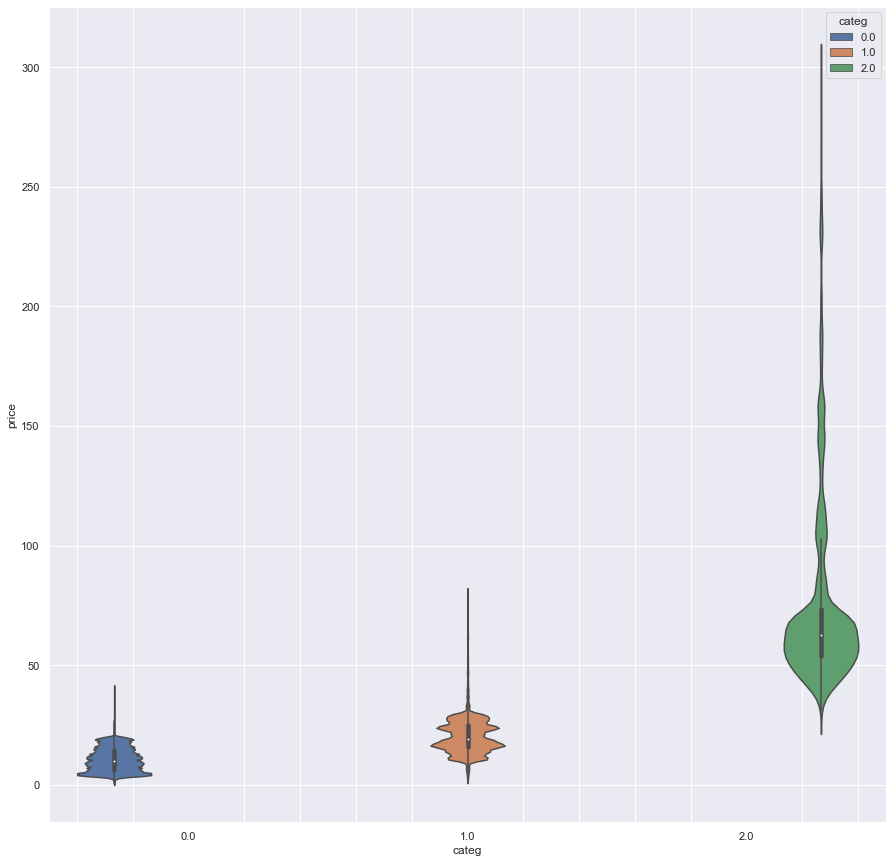

In [305]:
plt.figure(figsize=(15,15))
ax1 = sns.violinplot("categ", "price", data=df_transactions_products_customers, hue='categ')
ax1.minorticks_on()
ax1.grid(which='minor', axis='x', linewidth=1)

In [308]:
df_transactions_products_customers

,id_prod,session_id,client_id,année,mois,jour,heure,minute,jour_semaine,price,categ,sex,birth,age,Année,Mois,Jour
0,0_1518,s_211425,c_103,2022.0,5.0,20.0,13.0,21.0,4.0,4.18,0.0,f,1986.0,36.0,2022,5,20
1,0_1518,s_64849,c_103,2021.0,7.0,20.0,13.0,21.0,1.0,4.18,0.0,f,1986.0,36.0,2021,7,20
2,0_1518,s_255965,c_103,2022.0,8.0,20.0,13.0,21.0,5.0,4.18,0.0,f,1986.0,36.0,2022,8,20
3,0_1418,s_225411,c_103,2022.0,6.0,18.0,1.0,49.0,5.0,8.57,0.0,f,1986.0,36.0,2022,6,18
4,0_1418,s_77214,c_103,2021.0,8.0,18.0,1.0,49.0,2.0,8.57,0.0,f,1986.0,36.0,2021,8,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
679327,2_147,s_65994,c_4391,2021.0,7.0,23.0,7.0,1.0,4.0,181.99,2.0,f,2001.0,21.0,2021,7,23
679328,0_142,s_184472,c_1232,2022.0,3.0,25.0,18.0,7.0,4.0,19.85,0.0,f,1960.0,62.0,2022,3,25
679329,0_142,s_95415,c_1232,2021.0,9.0,25.0,18.0,7.0,5.0,19.85,0.0,f,1960.0,62.0,2021,9,25
679330,2_205,s_4605,c_7534,2021.0,3.0,11.0,0.0,11.0,3.0,100.99,2.0,m,1992.0,30.0,2021,3,11


In [331]:
X = "categ"
Y = "sex"

cont = df_transactions_products_customers[[X,Y]].pivot_table(index=X,columns=Y,aggfunc=len,margins=True,margins_name="Total")
cont

sex,f,m,Total
categ,,,
0.0,206220,209460,415680
1.0,114899,112270,227169
2.0,17283,19200,36483
Total,338402,340930,679332


# Tests de Pearson :

In [334]:
from scipy.stats import pearsonr

corr, _ = pearsonr(df_transactions_products_customers['age'], df_transactions_products_customers['price'])
corr

-0.20943870186601654

# Légère anti-corrélation entre les variables age et price.

In [336]:
corr, _ = pearsonr(df_transactions_products_customers['jour'], df_transactions_products_customers['price'])
corr
# pas corrélé

0.0006313157986363967

# Clairement pas de corrélations entre jour et price.

# -------------------------------------------------------------------------------

# Analyses matricielles / corrélogramme :

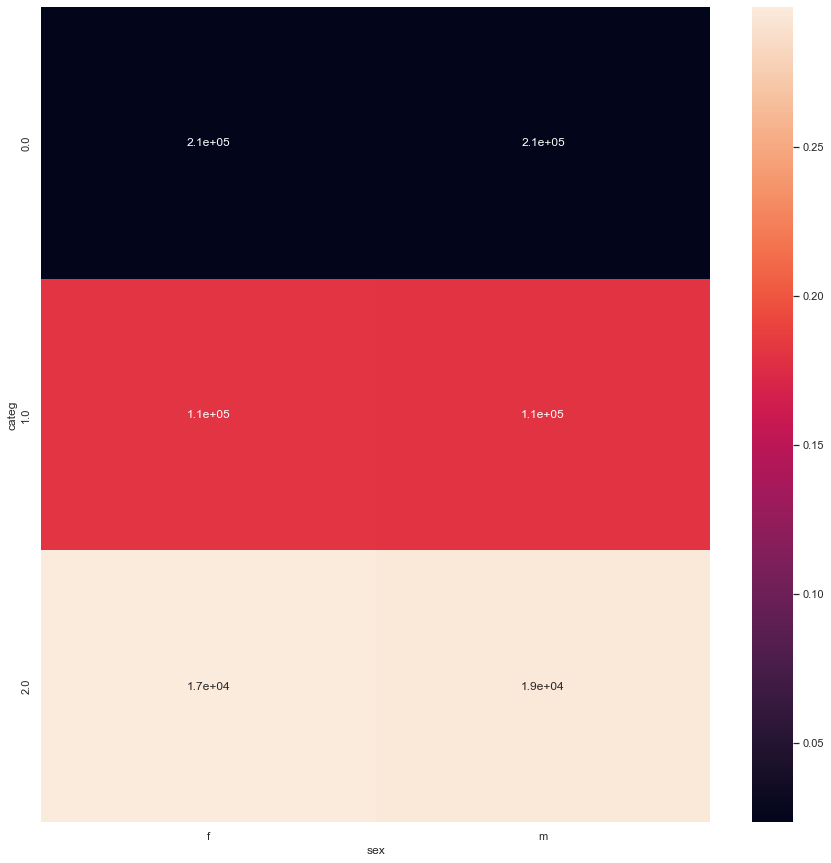

In [310]:
import seaborn as sns

tx = cont.loc[:,["Total"]]
ty = cont.loc[["Total"],:]
n = len(df_transactions_products_customers)
indep = tx.dot(ty) / n

plt.figure(figsize=(15,15))
c = cont.fillna(0) # On remplace les valeurs nulles par 0
measure = (c-indep)**2/indep
xi_n = measure.sum().sum()
table = measure/xi_n
sns.heatmap(table.iloc[:-1,:-1],annot=c.iloc[:-1,:-1])
plt.show()

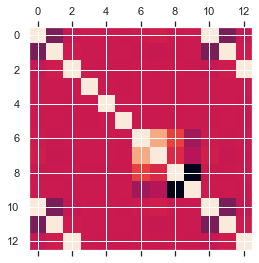

In [311]:
import matplotlib.pyplot as plt

plt.matshow(df_transactions_products_customers.corr())
plt.show()

C:\Users\cyril\AppData\Local\Temp\ipykernel_6308\2019544052.py:5: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = plt.colorbar()


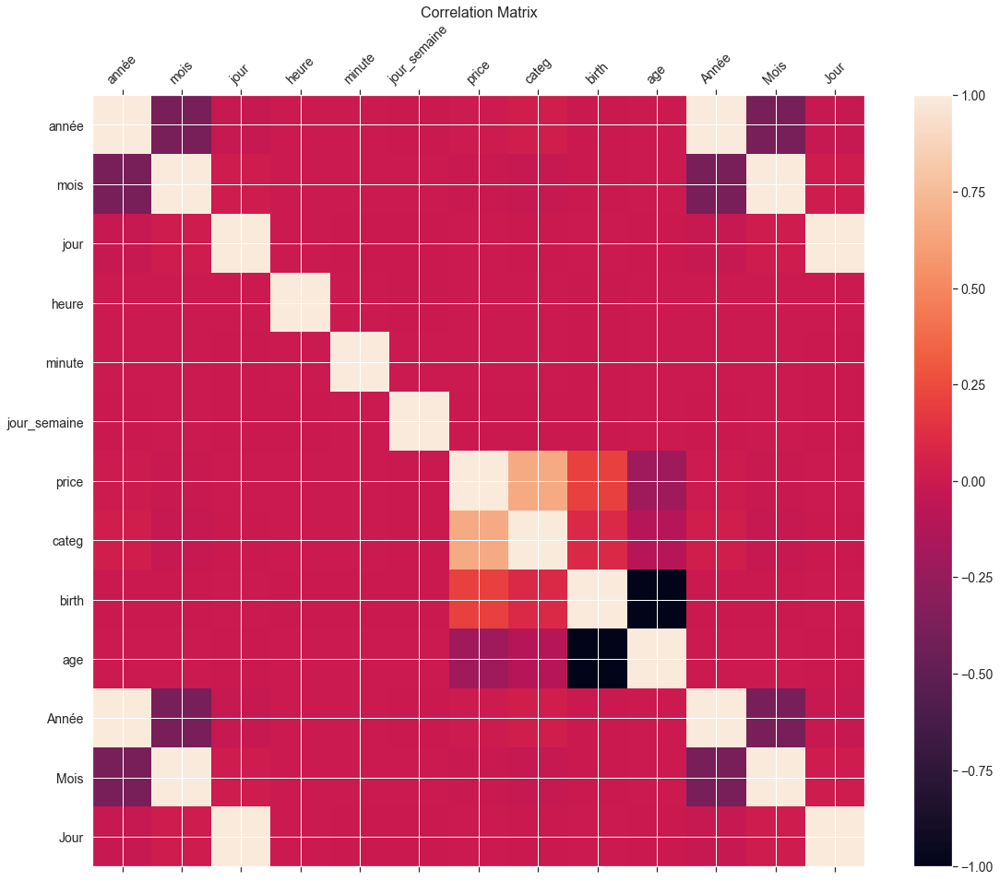

In [312]:
f = plt.figure(figsize=(19, 15))
plt.matshow(df_transactions_products_customers.corr(), fignum=f.number)
plt.xticks(range(df_transactions_products_customers.select_dtypes(['number']).shape[1]), df_transactions_products_customers.select_dtypes(['number']).columns, fontsize=14, rotation=45)
plt.yticks(range(df_transactions_products_customers.select_dtypes(['number']).shape[1]), df_transactions_products_customers.select_dtypes(['number']).columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16);

# En vérifiant les corrélations de manière globale on peut discerner que l'age est fortement corrélé à la date de naissance et qu'il y a un certain niveau de corrélation entre mois et année, age et prix, ainsi que categ et age. 

# Taux de Corrélations entre les variables :

In [325]:
import pandas as pd
import numpy as np

rs = np.random.RandomState(0)
df = df_transactions_products_customers
corr = df.corr()
corr.style.background_gradient(cmap='coolwarm')
# 'RdBu_r', 'BrBG_r', & PuOr_r are other good diverging colormaps

,année,mois,jour,heure,minute,jour_semaine,price,categ,birth,age,Année,Mois,Jour
année,1.000000,-0.384767,-0.018287,0.000200,0.000324,-0.001172,0.014198,0.033494,-0.002629,0.002629,1.000000,-0.384767,-0.018287
mois,-0.384767,1.000000,0.017957,0.001718,0.000141,0.007068,-0.012301,-0.019239,-0.002310,0.002310,-0.384767,1.000000,0.017957
jour,-0.018287,0.017957,1.000000,0.000377,-0.000680,-0.005781,0.000631,-0.002399,0.005249,-0.005249,-0.018287,0.017957,1.000000
heure,0.000200,0.001718,0.000377,1.000000,0.000844,-0.000523,0.000317,0.002129,-0.006894,0.006894,0.000200,0.001718,0.000377
minute,0.000324,0.000141,-0.000680,0.000844,1.000000,0.001668,0.001853,0.000201,-0.001856,0.001856,0.000324,0.000141,-0.000680
jour_semaine,-0.001172,0.007068,-0.005781,-0.000523,0.001668,1.000000,-0.000531,-0.001264,-0.002658,0.002658,-0.001172,0.007068,-0.005781
price,0.014198,-0.012301,0.000631,0.000317,0.001853,-0.000531,1.000000,0.671767,0.209439,-0.209439,0.014198,-0.012301,0.000631
categ,0.033494,-0.019239,-0.002399,0.002129,0.000201,-0.001264,0.671767,1.000000,0.099222,-0.099222,0.033494,-0.019239,-0.002399
birth,-0.002629,-0.002310,0.005249,-0.006894,-0.001856,-0.002658,0.209439,0.099222,1.000000,-1.000000,-0.002629,-0.002310,0.005249
age,0.002629,0.002310,-0.005249,0.006894,0.001856,0.002658,-0.209439,-0.099222,-1.000000,1.000000,0.002629,0.002310,-0.005249


# régression linéaire :

In [326]:
import scipy.stats as st
import numpy as np
df_transactions_products_customers = df_transactions_products_customers.dropna()

In [327]:
import numpy as np 
import pandas as pd 
import seaborn as sns 
import matplotlib.pyplot as plt 
from sklearn import preprocessing, svm 
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression 

In [ ]:
df = df_transactions_products_customers
df_binary = df[['age', 'price']] 
  
df_binary.columns = ['age', 'price'] 
  
df_binary.head() 
-------------------------------------
sns.lmplot(x ="age", y ="price", data = df_binary, order = 2, ci = None)
-------------------------------------
df_binary.fillna(method ='ffill', inplace = True) 
---------------------------------------------------------------------------
X = np.array(df_binary['age']).reshape(-1, 1) 
y = np.array(df_binary['price']).reshape(-1, 1) 
  
df_binary.dropna(inplace = True) 
  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25) 
  
regr = LinearRegression() 
  
regr.fit(X_train, y_train) 
print(regr.score(X_test, y_test)) 
--------------------------------------------------------------
y_pred = regr.predict(X_test) 
plt.scatter(X_test, y_test, color ='b') 
plt.plot(X_test, y_pred, color ='k') 
  
plt.show() 
-----------------------------------------------------------------


In [328]:
df = df_transactions_products_customers
df_binary = df[['age', 'price']] 
  
df_binary.columns = ['age', 'price'] 
  
df_binary.head() 

,age,price
0,36.0,4.18
1,36.0,4.18
2,36.0,4.18
3,36.0,8.57
4,36.0,8.57


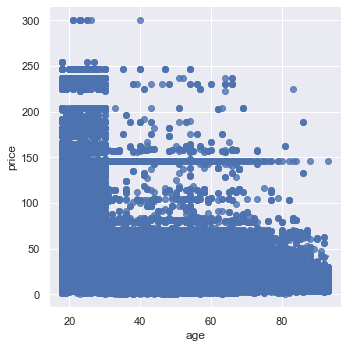

In [329]:
sns.lmplot(x ="age", y ="price", data = df_binary, order = 2, ci = None)

In [318]:
df_binary.fillna(method ='ffill', inplace = True) 

C:\Users\cyril\AppData\Local\Temp\ipykernel_6308\431716509.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_binary.fillna(method ='ffill', inplace = True)


In [319]:
X = np.array(df_binary['age']).reshape(-1, 1) 
y = np.array(df_binary['price']).reshape(-1, 1) 
  
df_binary.dropna(inplace = True) 
  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25) 
  
regr = LinearRegression() 
  
regr.fit(X_train, y_train) 
print(regr.score(X_test, y_test)) 

0.04503028587963731


C:\Users\cyril\AppData\Local\Temp\ipykernel_6308\3328728212.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_binary.dropna(inplace = True)


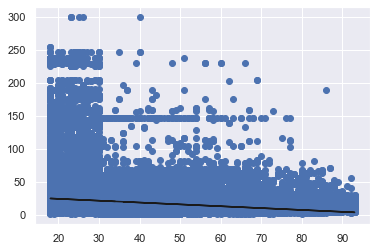

In [320]:
y_pred = regr.predict(X_test) 
plt.scatter(X_test, y_test, color ='b') 
plt.plot(X_test, y_pred, color ='k') 
  
plt.show() 

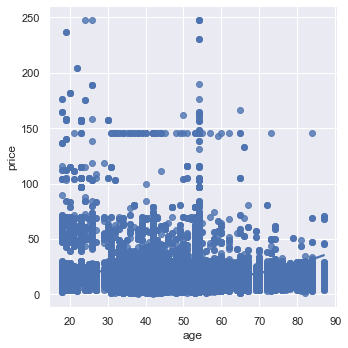

In [321]:
# inspection d'un échantillon de 100 000 clients :
df_binary500 = df_binary[:][:100000] 
  
sns.lmplot(x ="age", y ="price", data = df_binary500, 
                               order = 2, ci = None) 

In [322]:
df_binary500.fillna(method ='ffill', inplace = True) 
  
X = np.array(df_binary500['age']).reshape(-1, 1) 
y = np.array(df_binary500['price']).reshape(-1, 1) 
  
df_binary500.dropna(inplace = True) 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20) 
  
regr = LinearRegression() 
regr.fit(X_train, y_train) 
print(regr.score(X_test, y_test)) 

0.00436677991851242


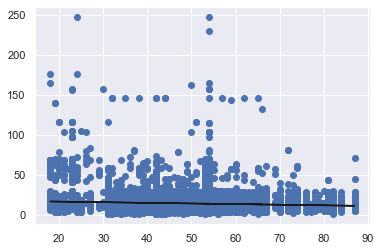

In [323]:
y_pred = regr.predict(X_test) 
plt.scatter(X_test, y_test, color ='b') 
plt.plot(X_test, y_pred, color ='k') 
  
plt.show() 

# La régression linéaire nous montre une tendance très générale du prix d'achat des clients qui chutes légèrement avec la montée de l'age d'achat par contre pas de corrélation linéaires sérieuses.

# Suite de l'Exploration sous POWER BI